In [4]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [5]:
import os
os.environ['PYTHONPATH'] = '/env/python'

In [6]:
%cd '/content/gdrive/My Drive/finalKPDL/finalProject'

/content/gdrive/My Drive/finalKPDL/finalProject


#1. Dataset Amazon Product Reviews

In [83]:
import numpy as np
import pandas as pd
import os
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import math
import json
import time
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import train_test_split
from sklearn.neighbors import NearestNeighbors
import joblib
import scipy.sparse
from scipy.sparse import csr_matrix
from scipy.sparse.linalg import svds
import warnings; warnings.simplefilter('ignore')
%matplotlib inline

In [84]:
electronics_data=pd.read_csv("data/rating.csv",names=['userId', 'productId','Rating','timestamp'])

In [85]:
electronics_data.head()

,userId,productId,Rating,timestamp
0,AKM1MP6P0OYPR,0132793040,5.0,1365811200
1,A2CX7LUOHB2NDG,0321732944,5.0,1341100800
2,A2NWSAGRHCP8N5,0439886341,1.0,1367193600
3,A2WNBOD3WNDNKT,0439886341,3.0,1374451200
4,A1GI0U4ZRJA8WN,0439886341,1.0,1334707200


In [86]:
electronics_data.shape

(7824482, 4)

In [87]:
#Taking subset of the dataset
electronics_data=electronics_data.iloc[:1048576,0:]

In [88]:
electronics_data.dtypes

userId        object
productId     object
Rating       float64
timestamp      int64
dtype: object

In [62]:
electronics_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048576 entries, 0 to 1048575
Data columns (total 4 columns):
 #   Column     Non-Null Count    Dtype  
---  ------     --------------    -----  
 0   userId     1048576 non-null  object 
 1   productId  1048576 non-null  object 
 2   Rating     1048576 non-null  float64
 3   timestamp  1048576 non-null  int64  
dtypes: float64(1), int64(1), object(2)
memory usage: 32.0+ MB


In [89]:
electronics_data.describe()['Rating'].T

count    1.048576e+06
mean     3.973380e+00
std      1.399329e+00
min      1.000000e+00
25%      3.000000e+00
50%      5.000000e+00
75%      5.000000e+00
max      5.000000e+00
Name: Rating, dtype: float64

In [90]:
#Find the minimum and maximum ratings
print('Minimum rating is: %d' %(electronics_data.Rating.min()))
print('Maximum rating is: %d' %(electronics_data.Rating.max()))

Minimum rating is: 1
Maximum rating is: 5


The rating of the product range from 0 to 1

**Handling Missing values**


In [91]:
#Check for missing values
print('Number of missing values across columns: \n',electronics_data.isnull().sum())

Number of missing values across columns: 
 userId       0
productId    0
Rating       0
timestamp    0
dtype: int64


Ratings

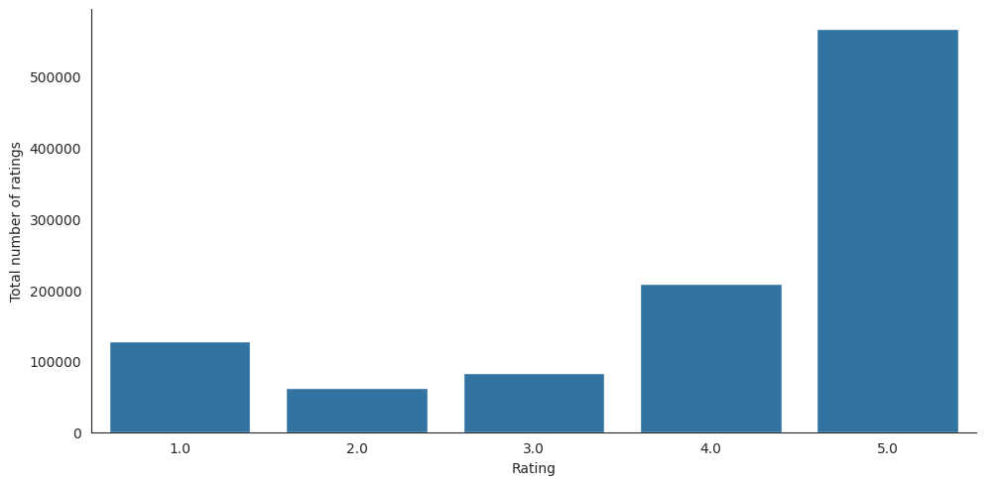

In [92]:
# Check the distribution of the rating
with sns.axes_style('white'):
    g = sns.catplot(x="Rating", data=electronics_data, aspect=2.0, kind='count')
    g.set_ylabels("Total number of ratings")

Most of the people has given the rating of 5



**Unique Users and products**

In [93]:
print("Total data ")
print("-"*50)
print("\nTotal no of ratings :",electronics_data.shape[0])
print("Total No of Users   :", len(np.unique(electronics_data.userId)))
print("Total No of products  :", len(np.unique(electronics_data.productId)))

Total data 
--------------------------------------------------

Total no of ratings : 1048576
Total No of Users   : 786330
Total No of products  : 61894


**Dropping the TimeStamp Column**

In [94]:
#Dropping the Timestamp column

electronics_data.drop(['timestamp'], axis=1,inplace=True)

**Analyzing the rating**

In [95]:
#Analysis of rating given by the user

no_of_rated_products_per_user = electronics_data.groupby(by='userId')['Rating'].count().sort_values(ascending=False)

no_of_rated_products_per_user.head(20)

userId
A5JLAU2ARJ0BO     412
A231WM2Z2JL0U3    249
A25HBO5V8S8SEA    164
A6FIAB28IS79      146
AT6CZDCP4TRGA     128
AKT8TGIT6VVZ5     122
A11D1KHM7DVOQK    112
A2B7BUH8834Y6M    103
A3OXHLG6DIBRW8     95
A203OCQQ12MAVT     90
A2R6RA8FRBS608     88
A2AEZQ3DGBBLPR     85
A680RUE1FDO8B      78
A1F9Z42CFF9IAY     76
AGHZXQL9F94T9      75
A1FR68QH6Z4YZM     75
A1MJMYLRTZ76ZX     74
A1JWSDDIH5Z7DV     72
A7Y6AVS576M03      70
A1435P5AMCPB3X     69
Name: Rating, dtype: int64

In [96]:
no_of_rated_products_per_user.describe()

count    786330.000000
mean          1.333506
std           1.385612
min           1.000000
25%           1.000000
50%           1.000000
75%           1.000000
max         412.000000
Name: Rating, dtype: float64

In [97]:
quantiles = no_of_rated_products_per_user.quantile(np.arange(0,1.01,0.01), interpolation='higher')

<Figure size 1000x1000 with 0 Axes>

Text(0.5, 1.0, 'Quantiles and their Values')

<Axes: title={'center': 'Quantiles and their Values'}>

Text(0, 0.5, 'No of ratings by user')

Text(0.5, 0, 'Value at the quantile')

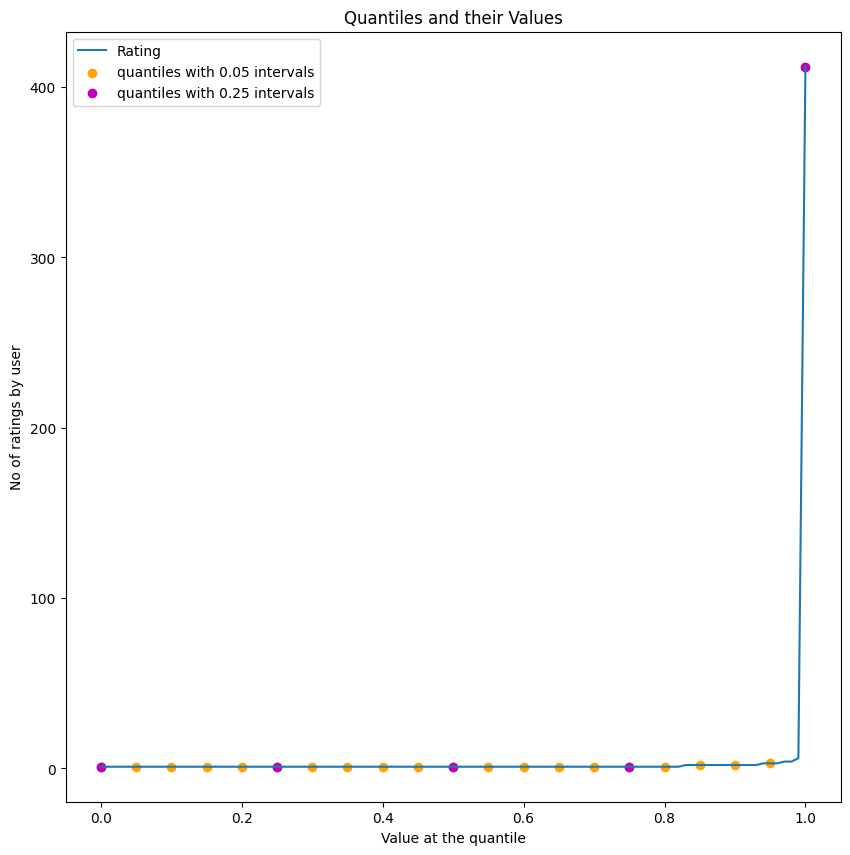

In [98]:
plt.figure(figsize=(10,10))
plt.title("Quantiles and their Values")
quantiles.plot()
# quantiles with 0.05 difference
plt.scatter(x=quantiles.index[::5], y=quantiles.values[::5], c='orange', label="quantiles with 0.05 intervals")
# quantiles with 0.25 difference
plt.scatter(x=quantiles.index[::25], y=quantiles.values[::25], c='m', label = "quantiles with 0.25 intervals")
plt.ylabel('No of ratings by user')
plt.xlabel('Value at the quantile')
plt.legend(loc='best')
plt.show()

In [99]:
print('\n Số lượng sản phẩm được xếp hạng nhiều hơn 50 trên mỗi user : {}\n'.format(sum(no_of_rated_products_per_user >= 50)) )


 Số lượng sản phẩm được xếp hạng nhiều hơn 50 trên mỗi user : 38



Kiểm tra xem số lượt đánh giá 5 sao có nhiều hơn các lượt đánh giá còn lại không

In [100]:
# Tách các nhóm đánh giá
ratings_5 = electronics_data[electronics_data['Rating'] == 5]['Rating']
other_ratings = electronics_data[electronics_data['Rating'] != 5]['Rating']

In [101]:
import scipy.stats as stats
# Tính số lượng đánh giá của mỗi nhóm
count_5 = ratings_5.count()
count_others = other_ratings.count()

# In số lượng đánh giá
print(f"Số lượng đánh giá 5 sao: {count_5}")
print(f"Số lượng đánh giá còn lại: {count_others}")

# Sử dụng t-test để kiểm định sự khác biệt giữa hai nhóm
t_stat, p_val = stats.ttest_1samp([count_5], count_others)

print(f"T-statistic: {t_stat}")
print(f"P-value: {p_val}")

if count_5 > count_others and p_val < 0.05:
    print("Số lượng đánh giá 5 sao lớn hơn số lượng đánh giá còn lại với sự khác biệt có ý nghĩa thống kê.")
else:
    print("Số lượng đánh giá 5 sao không lớn hơn số lượng đánh giá còn lại hoặc sự khác biệt không có ý nghĩa thống kê.")

Số lượng đánh giá 5 sao: 565637
Số lượng đánh giá còn lại: 482939
T-statistic: nan
P-value: nan
Số lượng đánh giá 5 sao không lớn hơn số lượng đánh giá còn lại hoặc sự khác biệt không có ý nghĩa thống kê.


# Đề xuất dựa trên mức độ phổ biến

In [102]:
#Lấy data frame mới chứa người dùng đã đưa ra 50 xếp hạng trở lên

new_df=electronics_data.groupby("productId").filter(lambda x:x['Rating'].count() >=50)

Text(0.5, 1.0, '# RATINGS per Product')

Text(0.5, 0, 'Product')

Text(0, 0.5, 'No of ratings per product')

[Text(-500.0, 0, ''),
 Text(0.0, 0, ''),
 Text(500.0, 0, ''),
 Text(1000.0, 0, ''),
 Text(1500.0, 0, ''),
 Text(2000.0, 0, ''),
 Text(2500.0, 0, ''),
 Text(3000.0, 0, ''),
 Text(3500.0, 0, ''),
 Text(4000.0, 0, ''),
 Text(4500.0, 0, '')]

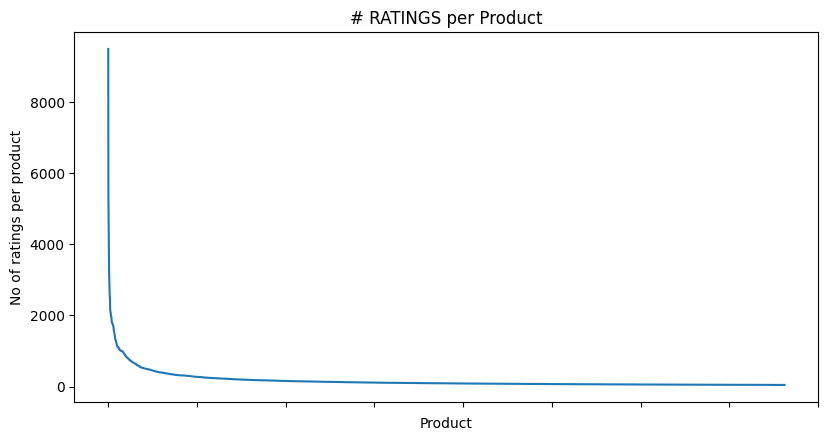

In [103]:
no_of_ratings_per_product = new_df.groupby(by='productId')['Rating'].count().sort_values(ascending=False)

fig = plt.figure(figsize=plt.figaspect(.5))
ax = plt.gca()
plt.plot(no_of_ratings_per_product.values)
plt.title('# RATINGS per Product')
plt.xlabel('Product')
plt.ylabel('No of ratings per product')
ax.set_xticklabels([])

plt.show()

In [104]:
#Đánh giá trung bình của sản phẩm

new_df.groupby('productId')['Rating'].mean().head()

productId
0972683275    4.470980
1400501466    3.560000
1400501520    4.243902
1400501776    3.884892
1400532620    3.684211
Name: Rating, dtype: float64

In [105]:
new_df.groupby('productId')['Rating'].mean().sort_values(ascending=False).head()

productId
B0000DYV9H    4.947368
B000053HC5    4.945783
B00009R96C    4.885714
B00005LE76    4.879310
B000I1X3W8    4.869565
Name: Rating, dtype: float64

In [106]:
#Tổng số đánh giá cho sản phẩm

new_df.groupby('productId')['Rating'].count().sort_values(ascending=False).head()

productId
B0002L5R78    9487
B0001FTVEK    5345
B000I68BD4    4903
B000BQ7GW8    4275
B00007E7JU    3523
Name: Rating, dtype: int64

In [107]:
ratings_mean_count = pd.DataFrame(new_df.groupby('productId')['Rating'].mean())

In [108]:
ratings_mean_count['rating_counts'] = pd.DataFrame(new_df.groupby('productId')['Rating'].count())

In [109]:
ratings_mean_count.head()

,Rating,rating_counts
productId,,
0972683275,4.470980,1051
1400501466,3.560000,250
1400501520,4.243902,82
1400501776,3.884892,139
1400532620,3.684211,171


In [110]:
ratings_mean_count['rating_counts'].max()

9487

<Figure size 800x600 with 0 Axes>

<Axes: >

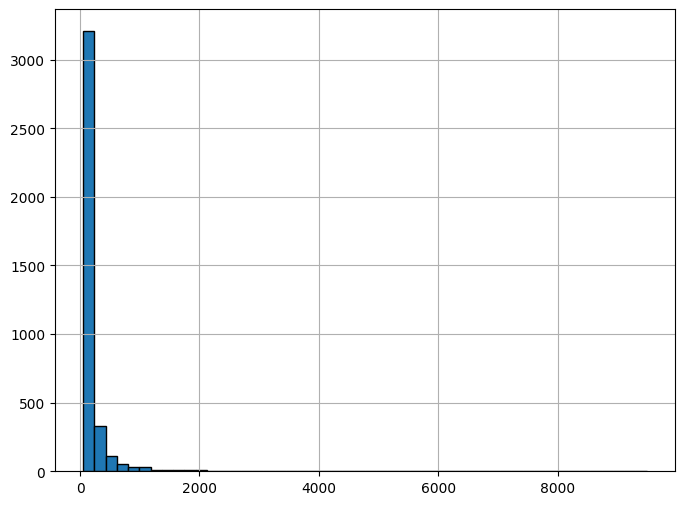

In [111]:
plt.figure(figsize=(8,6))
plt.rcParams['patch.force_edgecolor'] = True
ratings_mean_count['rating_counts'].hist(bins=50)

<Figure size 800x600 with 0 Axes>

<Axes: >

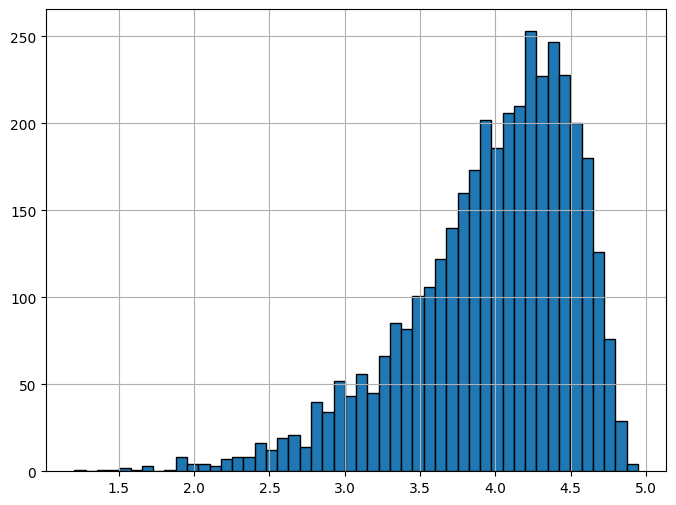

In [112]:
plt.figure(figsize=(8,6))
plt.rcParams['patch.force_edgecolor'] = True
ratings_mean_count['Rating'].hist(bins=50)

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

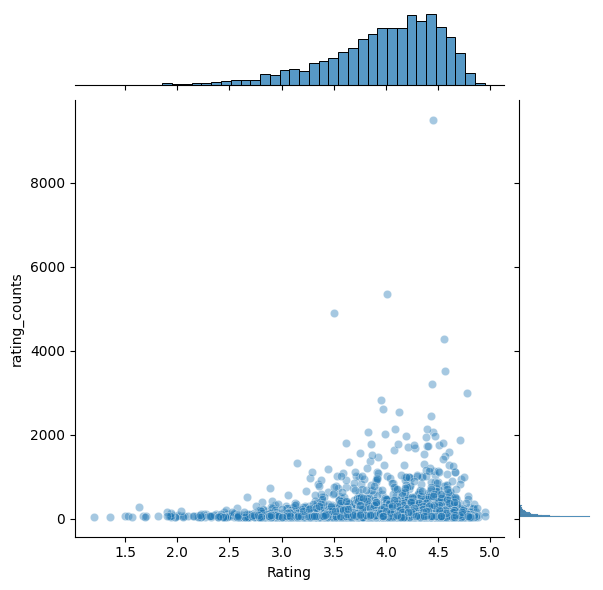

In [113]:
plt.figure(figsize=(8,6))
plt.rcParams['patch.force_edgecolor'] = True
sns.jointplot(x='Rating', y='rating_counts', data=ratings_mean_count, alpha=0.4)

<Axes: xlabel='productId'>

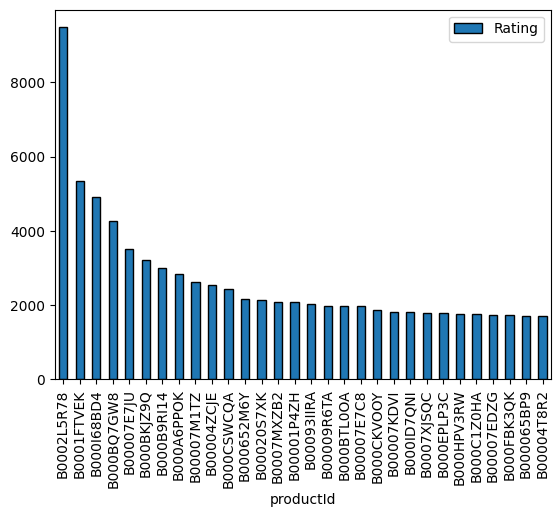

In [114]:
popular_products = pd.DataFrame(new_df.groupby('productId')['Rating'].count())
most_popular = popular_products.sort_values('Rating', ascending=False)
most_popular.head(30).plot(kind = "bar")

# Lọc cộng tác bằng KNN

In [116]:
!pip install surprise

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 2.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for scikit-surprise: filename=scikit_surprise-1.1.4-cp310-cp310-linux_x86_64.whl size=2357255 sha256=6639223863d69e3632cdf0ae2abc9f98a8b75e6f6502643c6fe4837b84eef255
  Stored in directory: /root/.cache/pip/wheels/4b/3f/df/6acbf0a40397d9bf3ff97f582cc22fb9ce66adde75bc71fd54
Successfully built scikit-surprise


In [117]:
from surprise import KNNWithMeans
from surprise import Dataset
from surprise import accuracy
from surprise import Reader
import os
from surprise.model_selection import train_test_split

In [118]:
reader = Reader(rating_scale=(1, 5))
data = Dataset.load_from_df(new_df,reader)
trainset, testset = train_test_split(data, test_size=0.3,random_state=10)

In [119]:
algo = KNNWithMeans(k=5, sim_options={'name': 'pearson_baseline', 'user_based': False})
algo.fit(trainset)

Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.


In [120]:
test_pred = algo.test(testset)

In [121]:
print("Item-based Model : Test Set")
accuracy.rmse(test_pred, verbose=True)

Item-based Model : Test Set
RMSE: 1.3436


1.343641161111319

In [122]:
# Lấy danh sách người dùng duy nhất từ testset
unique_users = list(set([pred.uid for pred in test_pred]))

# Hiển thị kết quả cho 10 người dùng đầu tiên
for idx, uid in enumerate(unique_users[:50]):
    try:
        # Chuyển đổi user id sang inner id
        inner_uid = trainset.to_inner_uid(uid)

        # Lấy danh sách các item đã được đánh giá bởi người dùng
        rated_items = [item for (item, _) in trainset.ur[inner_uid]]

        # Dự đoán điểm đánh giá cho tất cả các sản phẩm chưa được đánh giá bởi người dùng cụ thể
        items_to_predict = [iid for iid in trainset.all_items() if iid not in rated_items]

        predictions = []
        for iid in items_to_predict:
            predictions.append((iid, algo.predict(uid, trainset.to_raw_iid(iid)).est))

        # Sắp xếp các dự đoán theo thứ tự giảm dần
        predictions.sort(key=lambda x: x[1], reverse=True)

        # Lấy top 5 sản phẩm để gợi ý
        top_5_recommendations = [trainset.to_raw_iid(pred[0]) for pred in predictions[:5]]
        print(f"User {uid} top 5 recommendations: {top_5_recommendations}")
    except ValueError:
        continue

User A4TH1G4MV3VLM top 5 recommendations: ['B000AJIF4E', 'B000EMWBT2', 'B00009UT9B', 'B0007WK8LC', 'B0007G6RZE']
User A1EE25IKCXG5T0 top 5 recommendations: ['B000HWVOFQ', 'B000067RT6', 'B0002Y5WZM', 'B000ID7QNI', 'B0000B006W']
User A1FNIBTI1D91KM top 5 recommendations: ['B0002Y5WZM', 'B0002L5R78', 'B000BQ7GW8', 'B000GFWFY8', 'B000FKKWVM']
User A2IX9EO0C3ZEWB top 5 recommendations: ['B000053HC5', 'B0002L5R78', 'B000A5TAT2', 'B000G1ENQA', 'B0000DYV9H']
User A12T4HA2HIT5GC top 5 recommendations: ['B000053HC5', 'B000G1ENQA', 'B0000DYV9H', 'B00009L1UX', 'B000I1X3W8']
User A1CA84VNHZUDZ top 5 recommendations: ['B0007QKXYU', 'B000067O5G', 'B0000CE1UO', 'B00006RVPW', 'B000IE8Z4Q']
User A1DB2EVH0HGHBP top 5 recommendations: ['B0002Y5WZC', 'B00005LEN4', 'B00009R6WT', 'B000BYCKU8', 'B0007WK8KS']
User A2MJ9IDWS6F99B top 5 recommendations: ['B000144I2Q', 'B000EOSHGQ', 'B000053HC5', 'B000G1ENQA', 'B0000DYV9H']
User A3KZ7OH4VRL048 top 5 recommendations: ['B0002MQGOK', 'B000BTL0OA', 'B000EXS1BS', 'B00

# Hệ thống lọc cộng tác dựa trên mô hình

In [123]:
new_df1=new_df.head(10000)
ratings_matrix = new_df1.pivot_table(values='Rating', index='userId', columns='productId', fill_value=0)
ratings_matrix.head()

productId,0972683275,1400501466,1400501520,1400501776,1400532620,1400532655,140053271X,1400532736,1400599997,1400698987,...,B00000JFMK,B00000JHWX,B00000JI4F,B00000JII6,B00000JMUG,B00000JPPI,B00000JSGF,B00000JYLO,B00000JYWQ,B00000K135
userId,,,,,,,,,,,,,,,,,,,,,
A01852072Z7B68UHLI5UG,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
A0266076X6KPZ6CCHGVS,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
A0293130VTX2ZXA70JQS,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
A030530627MK66BD8V4LN,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
A0571176384K8RBNKGF8O,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [124]:
ratings_matrix.shape

(9832, 76)

In [125]:
X = ratings_matrix.T
X.head()

userId,A01852072Z7B68UHLI5UG,A0266076X6KPZ6CCHGVS,A0293130VTX2ZXA70JQS,A030530627MK66BD8V4LN,A0571176384K8RBNKGF8O,A0590501PZ7HOWJKBGQ4,A0641581307AKT5MAOU0Q,A076219533YHEV2LJO988,A0821988FXKFYX53V4QG,A099626739FNCRNHIKBCG,...,AZWOPBY75SGAM,AZX0ZDVAFMN78,AZX5LAN9JEAFF,AZX7I110AF0W2,AZXKUK895VGSM,AZXP46IB63PU8,AZYTSU42BZ7TP,AZZGJ2KMWB7R,AZZMV5VT9W7Y8,AZZST8OYL5P4Q
productId,,,,,,,,,,,,,,,,,,,,,
0972683275,0,0,5,4,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1400501466,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1400501520,0,0,0,0,0,0,0,0,0,3,...,0,0,0,0,0,0,0,0,0,0
1400501776,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1400532620,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [126]:
X.shape

(76, 9832)

In [127]:
X1 = X

In [128]:
#Decomposing the Matrix
from sklearn.decomposition import TruncatedSVD
SVD = TruncatedSVD(n_components=10)
decomposed_matrix = SVD.fit_transform(X)
decomposed_matrix.shape

(76, 10)

In [129]:
#Ma trận tương quan

correlation_matrix = np.corrcoef(decomposed_matrix)
correlation_matrix.shape

(76, 76)

In [130]:
X.index[75]

'B00000K135'

In [131]:
i = "B00000K135"

product_names = list(X.index)
product_ID = product_names.index(i)
product_ID

75

In [132]:
correlation_product_ID = correlation_matrix[product_ID]
correlation_product_ID.shape

(76,)

In [133]:
Recommend = list(X.index[correlation_product_ID > 0.65])

# Removes the item already bought by the customer
Recommend.remove(i)
print(product_ID)
Recommend[0:24]

75


['7214047977',
 '9575871979',
 '9625993428',
 '9983891212',
 '9985511476',
 'B00000J1EQ',
 'B00000J1F3',
 'B00000J1QK',
 'B00000J1U8',
 'B00000J1V3',
 'B00000JCT8',
 'B00000JFMK',
 'B00000JII6',
 'B00000JMUG']

#2. NYC Yellow Taxi Trip Data: Pickup Density Prediction

Installing & Importing Packages

In [7]:
# !pip3 install graphviz
# !pip3 install dask
# !pip install "dask[complete]"
# !pip3 install toolz
# !pip3 install cloudpickle
# !pip3 install folium
!pip install gpxpy
!pip install pyroomacoustics

#2.1 ML Problem
### Dự đoán không áp dụng phân cụm
### Time-series Forecasting và Regression
- Dự đoán số lần pickups dựa trên tọa độ vị trí (vĩ độ và kinh độ) và thời gian.
- Để giải quyết vấn đề trên, chúng ta sẽ sử dụng:
  - Sử dụng dữ liệu được thu thập vào tháng 1 năm 2015 để dự đoán số lần thu thập trong giai đoạn từ tháng 1 đến tháng 3 năm 2016
  - Sử dụng các giá trị đã biết trước đó của chính dữ liệu năm 2016 để dự đoán các giá trị tương lai.

# Các metrics sử dụng đánh giá
1. Mean absolute percentage error (MAPE)
2. Root mean squared error (RMSE)
3. Coefficient of Determination (R^2)

In [8]:
import os
import time
import math
import scipy
import pickle
import warnings
import datetime
import numpy as np
import pandas as pd
import matplotlib
import seaborn as sns
import xgboost as xgb
import matplotlib.pylab as plt

# This library helps to open street map
import folium

# Similar to pandas, but helps in parallel computing
# Below are some resources for getting familiar with Dask
import dask.dataframe as dd
import gpxpy.geo
from matplotlib import rcParams
from pyroomacoustics.doa.detect_peaks import detect_peaks

from sklearn.cluster import MiniBatchKMeans, KMeans
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import LinearRegression

from prettytable import PrettyTable
from datetime import datetime as dt

matplotlib.use('nbagg');
warnings.filterwarnings("ignore");
%matplotlib inline

## Thông tin data
- **NYC Taxi and Limousine Commission (TLC)** (Ủy ban Taxi & Limousine của Thành phố New York ) lưu giữ dữ liệu từ tất cả các xe taxi của mình và có thể tải xuống miễn phí từ trang web chính thức của họ.
- Có thể truy cập từ đây
[here](https://www1.nyc.gov/site/tlc/about/tlc-trip-record-data.page).

## Data
- Trong bộ dữ liệu này, chúng tôi đã thu thập dữ liệu cho 4 tháng cụ thể:
  - Tháng 1 năm 2015: 1.8 GB
  - Tháng 1 năm 2016: 1.6 GB
  - Tháng 2 năm 2016: 1.7 GB
  - Tháng 3 năm 2016: 1.8 GB

## Dask
- Khác với Pandas, các thao tác trên dask.dataframes không kích hoạt tính toán ngay lập tức.
- Thay vào đó, chúng thêm các cặp khóa-giá trị vào một Đồ thị Dask cơ bản, được lưu trữ dưới dạng Từ điển Python.
- Dask được thiết kế để làm việc với các bộ dữ liệu từ 10-100 GB, bằng cách sử dụng thông minh tính toán song song.

## Thông tin chi tiết về tập dữ liệu

<table border="0.5">
<tr>
    <th>STT</th> <th>Cột</th> <th>Mô tả</th>
</tr>
<tr> <td>1</td> <td>VendorID</td> <td>Mã chỉ ra nhà cung cấp TPEP đã cung cấp bản ghi: - Creative Mobile Technologies
- VeriFone Inc.</td> </tr> <tr> <td>2</td> <td>tpep_pickup_datetime</td> <td>Ngày và giờ khi đồng hồ tính tiền được kích hoạt.</td> </tr> <tr> <td>3</td> <td>tpep_dropoff_datetime</td> <td>Ngày và giờ khi đồng hồ tính tiền được tắt.</td> </tr> <tr> <td>4</td> <td>Passenger_count</td> <td>Số lượng hành khách trên xe. Đây là giá trị do tài xế nhập.</td> </tr> <tr> <td>5</td> <td>Trip_distance</td> <td>Khoảng cách chuyến đi tính bằng dặm do đồng hồ tính tiền báo cáo.</td> </tr> <tr> <td>6</td> <td>Pickup_longitude</td> <td>Kinh độ nơi đồng hồ tính tiền được kích hoạt.</td> </tr> <tr> <td>7</td> <td>Pickup_latitude</td> <td>Vĩ độ nơi đồng hồ tính tiền được kích hoạt.</td> </tr> <tr> <td>8</td> <td>RateCodeID</td> <td>Mã giá cuối cùng có hiệu lực vào cuối chuyến đi. Bao gồm các giá: 1.Standard rate, 2.JFK, 3.Newark, 4.Nassau hoặc Westchester, 5.Negotiated fare, 6.Group ride.</td> </tr> <tr> <td>9</td> <td>Store_and_fwd_flag</td> <td>Cờ này chỉ ra liệu bản ghi chuyến đi có được lưu trong bộ nhớ của xe trước khi gửi đến nhà cung cấp hay không, vì xe không có kết nối với máy chủ. Y = lưu và chuyển tiếp, N = không lưu và chuyển tiếp.</td> </tr> <tr> <td>10</td> <td>Dropoff_longitude</td> <td>Kinh độ nơi đồng hồ tính tiền được tắt.</td> </tr> <tr> <td>11</td> <td>Dropoff_latitude</td> <td>Vĩ độ nơi đồng hồ tính tiền được tắt.</td> </tr> <tr> <td>12</td> <td>Payment_type</td> <td>Mã số chỉ cách thức hành khách thanh toán cho chuyến đi. Bao gồm: 1.Credit card, 2.Cash, 3.No charge, 4.Dispute, 5.Unknown, 6.Voided trip.</td> </tr> <tr> <td>13</td> <td>Fare_amount</td> <td>Tiền cước tính theo thời gian và khoảng cách do đồng hồ tính tiền báo cáo.</td> </tr> <tr> <td>14</td> <td>Extra</td> <td>Các khoản phụ phí và phụ thu khác. Hiện tại, chỉ bao gồm phí giờ cao điểm và qua đêm.</td> </tr> <tr> <td>15</td> <td>MTA_tax</td> <td>Thuế MTA 0.50 đô la tự động kích hoạt dựa trên mức giá đồng hồ tính tiền đang sử dụng.</td> </tr> <tr> <td>16</td> <td>Improvement_surcharge</td> <td>Phụ phí cải thiện 0.30 đô la áp dụng cho các chuyến đi từ điểm cờ. Phụ phí cải thiện bắt đầu được áp dụng từ năm 2015.</td> </tr> <tr> <td>17</td> <td>Tip_amount</td> <td>Số tiền tip_trường này tự động điền cho các tip bằng thẻ tín dụng. Không bao gồm tip bằng tiền mặt.</td> </tr> <tr> <td>18</td> <td>Tolls_amount</td> <td>Tổng số tiền cho tất cả các phí cầu đường đã trả trong chuyến đi.</td> </tr> <tr> <td>19</td> <td>Total_amount</td> <td>Tổng số tiền hành khách phải trả. Không bao gồm tip bằng tiền mặt.</td> </tr> </table>

Ở đây để phục vụ mục đích trực quan hóa ta chưa cần tính toán trên dữ liệu đưa vào nên đơn giản ta chỉ cần sử dụng pandas
#2.2 Visualization

In [7]:
test = pd.read_csv("data/yellow_tripdata_2015-01.csv")
test

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,2,2015-01-15 19:05:39,2015-01-15 19:23:42,1,1.59,-73.993896,40.750111,1,N,-73.974785,40.750618,1,12.0,1.0,0.5,3.25,0.0,0.3,17.05
1,1,2015-01-10 20:33:38,2015-01-10 20:53:28,1,3.30,-74.001648,40.724243,1,N,-73.994415,40.759109,1,14.5,0.5,0.5,2.00,0.0,0.3,17.80
2,1,2015-01-10 20:33:38,2015-01-10 20:43:41,1,1.80,-73.963341,40.802788,1,N,-73.951820,40.824413,2,9.5,0.5,0.5,0.00,0.0,0.3,10.80
3,1,2015-01-10 20:33:39,2015-01-10 20:35:31,1,0.50,-74.009087,40.713818,1,N,-74.004326,40.719986,2,3.5,0.5,0.5,0.00,0.0,0.3,4.80
4,1,2015-01-10 20:33:39,2015-01-10 20:52:58,1,3.00,-73.971176,40.762428,1,N,-74.004181,40.742653,2,15.0,0.5,0.5,0.00,0.0,0.3,16.30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12748981,1,2015-01-10 19:01:44,2015-01-10 19:05:40,2,1.00,-73.951988,40.786217,1,N,-73.953735,40.775162,1,5.5,0.0,0.5,1.25,0.0,0.3,7.55
12748982,1,2015-01-10 19:01:44,2015-01-10 19:07:26,2,0.80,-73.982742,40.728184,1,N,-73.974976,40.720013,1,6.0,0.0,0.5,2.00,0.0,0.3,8.80
12748983,1,2015-01-10 19:01:44,2015-01-10 19:15:01,1,3.40,-73.979324,40.749550,1,N,-73.969101,40.787800,2,13.5,0.0,0.5,0.00,0.0,0.3,14.30
12748984,1,2015-01-10 19:01:44,2015-01-10 19:17:03,1,1.30,-73.999565,40.738483,1,N,-73.981819,40.737652,1,10.5,0.0,0.5,2.25,0.0,0.3,13.55


In [8]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12748986 entries, 0 to 12748985
Data columns (total 19 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   VendorID               int64  
 1   tpep_pickup_datetime   object 
 2   tpep_dropoff_datetime  object 
 3   passenger_count        int64  
 4   trip_distance          float64
 5   pickup_longitude       float64
 6   pickup_latitude        float64
 7   RateCodeID             int64  
 8   store_and_fwd_flag     object 
 9   dropoff_longitude      float64
 10  dropoff_latitude       float64
 11  payment_type           int64  
 12  fare_amount            float64
 13  extra                  float64
 14  mta_tax                float64
 15  tip_amount             float64
 16  tolls_amount           float64
 17  improvement_surcharge  float64
 18  total_amount           float64
dtypes: float64(12), int64(4), object(3)
memory usage: 1.8+ GB


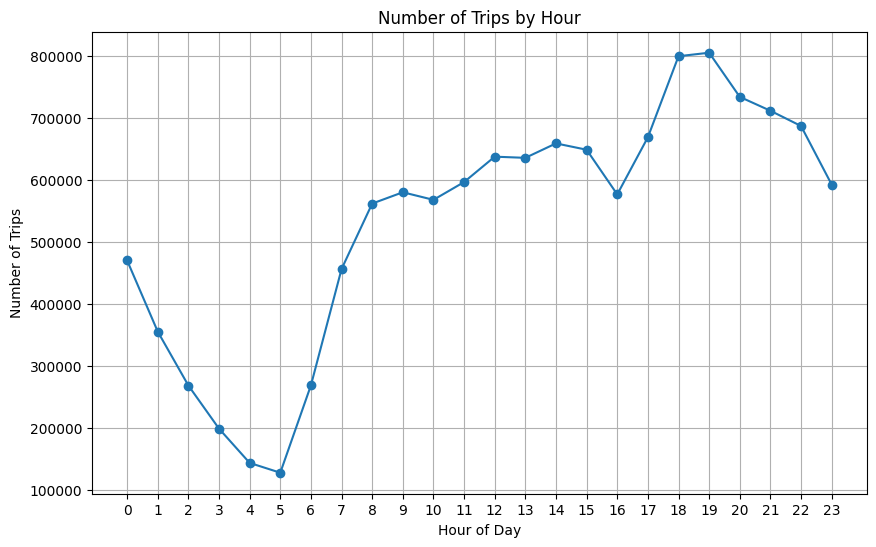

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df is your DataFrame
# Parse datetime column
test['tpep_pickup_datetime'] = pd.to_datetime(test['tpep_pickup_datetime'])

# Extract hour from the datetime
test['pickup_hour'] = test['tpep_pickup_datetime'].dt.hour

# Count trips by hour
trips_by_hour = test['pickup_hour'].value_counts().sort_index()

# Plot the number of trips by hour
plt.figure(figsize=(10, 6))
plt.plot(trips_by_hour.index, trips_by_hour.values, marker='o')
plt.title('Number of Trips by Hour')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Trips')
plt.grid(True)
plt.xticks(range(0, 24))
plt.show()

Nhận xét: Dựa trên biểu đồ số lượng chuyến xe theo giờ trong ngày. Ta sẽ thấy được số chuyến cao nhất 18h-19h là giờ cao điểm và số chuyến thấp nhất tầm 0h-5h sáng đây là khoảng thời gian nghỉ ngơi.

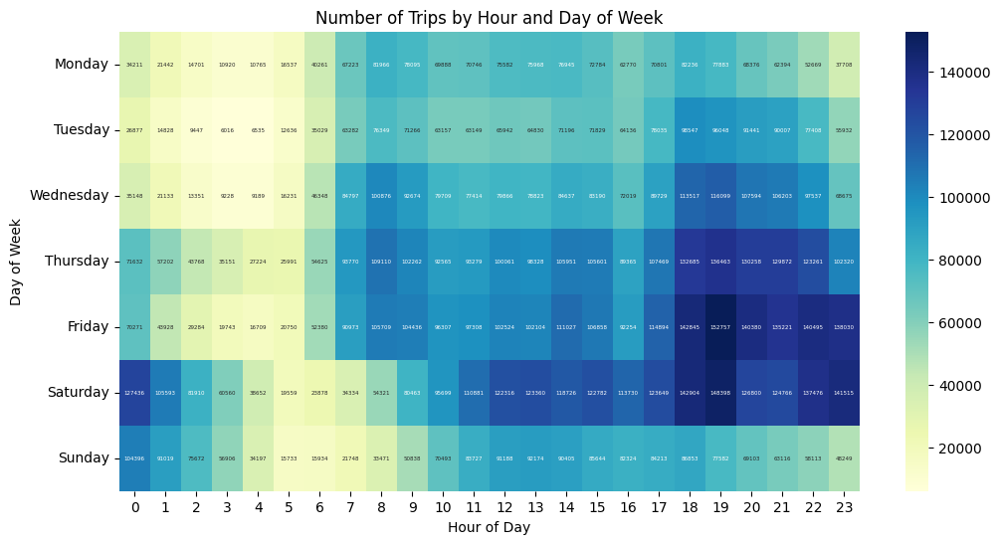

In [ ]:
# Assuming df is your DataFrame
# Parse datetime column
test['tpep_pickup_datetime'] = pd.to_datetime(test['tpep_pickup_datetime'])

# Extract hour and day of the week from the datetime
test['pickup_hour'] = test['tpep_pickup_datetime'].dt.hour
test['pickup_day'] = test['tpep_pickup_datetime'].dt.dayofweek  # Monday=0, Sunday=6

# Count trips by hour and day
trips_by_hour_day = test.groupby(['pickup_day', 'pickup_hour']).size().unstack(fill_value=0)

# Plot the heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(trips_by_hour_day, cmap='YlGnBu', annot=True, fmt='d',cbar=True, annot_kws={"size": 4})
plt.title('Number of Trips by Hour and Day of Week')
plt.xlabel('Hour of Day')
plt.ylabel('Day of Week')
plt.yticks(ticks=[0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5], labels=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'], rotation=0)
plt.show()

Nhận xét: Thứ 6 và thứ 7 vào khoảng thời gian 18h-23h là khoảng thời gian có nhiều chuyến nhất vì đó là ngày nghỉ nên lượng xe đông đúc ngược lại chủ nhật sẽ có xu hướng nghỉ ngơi

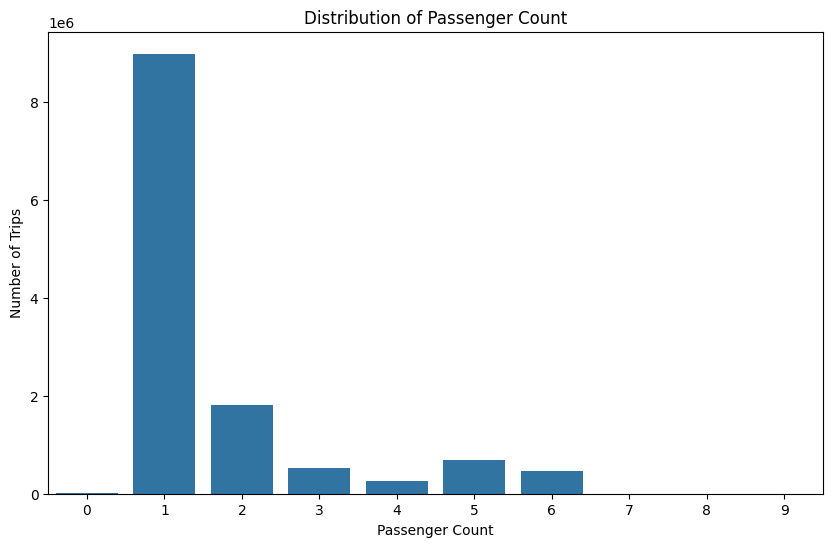

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.countplot(data=test, x='passenger_count')
plt.title('Distribution of Passenger Count')
plt.xlabel('Passenger Count')
plt.ylabel('Number of Trips')
plt.show()

Biểu đồ này sẽ cho thấy phân bố của số lượng hành khách trong các chuyến đi.

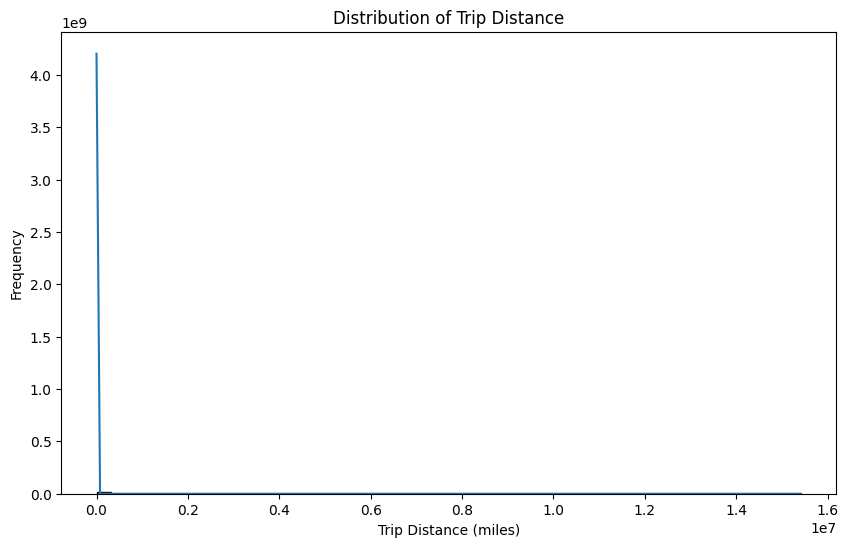

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(data=test, x='trip_distance', bins=50, kde=True)
plt.title('Distribution of Trip Distance')
plt.xlabel('Trip Distance (miles)')
plt.ylabel('Frequency')
plt.show()

Biểu đồ này sẽ cho thấy phân bố của khoảng cách chuyến đi. Ta có thể loại bỏ outlier dựa trên trường Trip Distance này

In [ ]:
# Looking at the features
month = dd.read_csv("yellow_tripdata_2015-01.csv")
month.columns

Index(['VendorID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime',
       'passenger_count', 'trip_distance', 'pickup_longitude',
       'pickup_latitude', 'RateCodeID', 'store_and_fwd_flag',
       'dropoff_longitude', 'dropoff_latitude', 'payment_type', 'fare_amount',
       'extra', 'mta_tax', 'tip_amount', 'tolls_amount',
       'improvement_surcharge', 'total_amount'],
      dtype='object')

#2.3 Tiền xử lí
- Trong phần này, ta sẽ thực hiện phân tích một biến và loại bỏ các giá trị ngoại lai/không hợp lệ có thể do một số lỗi gây ra.
- Chúng ta sẽ thực hiện phân tích một biến trên dữ liệu tháng 1 năm 2015, và bất kỳ tiền xử lý nào dựa trên thông tin, sẽ được áp dụng cho tất cả.

In [10]:
# The table below shows few datapoints along with all our features
month = dd.read_csv('data/yellow_tripdata_2015-01.csv')
print(month.columns)

Index(['VendorID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime',
       'passenger_count', 'trip_distance', 'pickup_longitude',
       'pickup_latitude', 'RateCodeID', 'store_and_fwd_flag',
       'dropoff_longitude', 'dropoff_latitude', 'payment_type', 'fare_amount',
       'extra', 'mta_tax', 'tip_amount', 'tolls_amount',
       'improvement_surcharge', 'total_amount'],
      dtype='object')


## 2.3.1. Pickup Latitude và Pickup Longitude
- Dựa vào tìm kiếm ta có thể biết rằng New York được giới hạn bởi các tọa độ địa lý (vĩ độ, kinh độ) - (40.5774, -74.15) và (40.9176,-73.7004).
- Do đó, bất kỳ tọa độ nào không nằm trong phạm vi tọa độ này sẽ không được xem xét và ta chỉ quan tâm đến những điểm đón khách bắt đầu từ New York.



In [11]:
outlier_locations = month[((month.pickup_longitude <= -74.15) | (month.pickup_latitude <= 40.5774)| \
    (month.pickup_longitude >= -73.7004) | (month.pickup_latitude >= 40.9176))]
print("Number of Outlier Locations:", len(outlier_locations))

Number of Outlier Locations: 247742


## 2.3.2. Dropoff Latitude và Dropoff Longitude
Cùng ý tưởng với phần 1.1

In [12]:
outlier_locations = month[((month.dropoff_longitude <= -74.15) | (month.dropoff_latitude <= 40.5774)| \
    (month.dropoff_longitude >= -73.7004) | (month.dropoff_latitude >= 40.9176))]
print("Number of Outlier Locations:", len(outlier_locations))

Number of Outlier Locations: 264440


## 2.3.3. Trip Durations:
Thời gian chuyến đi tối đa được phép đối với người lái xe taxi và xe limousine trong khoảng thời gian 24 giờ theo Quy định của Ủy ban Taxi & Limousine Thành phố New York (TLC) là 12 giờ. Quy tắc này đảm bảo rằng người lái xe được nghỉ ngơi đầy đủ và ngăn ngừa tình trạng mệt mỏi quá mức trong ca làm việc của họ. Nếu người lái xe vượt quá giới hạn này, họ phải nghỉ ngơi trước khi tiếp tục dịch vụ.

In [35]:
# Các dấu thời gian được chuyển đổi sang unix để lấy thời gian di chuyển (trip-time) và tốc độ (speed).
# Ngoài ra, thời gian đón khách ở định dạng unix được sử dụng khi phân loại (binning)

# Trong dữ liệu, chúng ta có thời gian ở định dạng "YYYY-MM-DD HH:MM:SS"
# Chúng ta chuyển đổi chuỗi này sang định dạng thời gian của python và sau đó sang dấu thời gian unix
# https://stackoverflow.com/a/27914405
def convert_to_unix(s):
    return time.mktime(datetime.datetime.strptime(s, "%Y-%m-%d %H:%M:%S").timetuple())
def return_with_trip_times(month):
    duration = month[['tpep_pickup_datetime','tpep_dropoff_datetime']].compute()

    # Pickups and dropoffs to unix time
    duration_pickup = [convert_to_unix(x) for x in duration['tpep_pickup_datetime'].values]
    duration_drop = [convert_to_unix(x) for x in duration['tpep_dropoff_datetime'].values]

    # Calculate the duration of trips
    # Division by 60 converts the difference from seconds to minutes
    durations = (np.array(duration_drop) - np.array(duration_pickup))/float(60)

    # Append durations of trips and speed in miles/hr to a new dataframe
    new_frame = month[['passenger_count','trip_distance','pickup_longitude','pickup_latitude',
        'dropoff_longitude','dropoff_latitude','total_amount']].compute()

    new_frame['trip_times'] = durations
    new_frame['pickup_times'] = duration_pickup
    new_frame['Speed'] = 60*(new_frame['trip_distance']/new_frame['trip_times'])

    return new_frame

In [ ]:
# Ta chuyển đổi data-frame chứa các cột như sau:
# 1.'passenger_count'   : Self-explanatory
# 2.'trip_distance'     : Self-explanatory
# 3.'pickup_longitude'  : Self-explanatory
# 4.'pickup_latitude'   : Self-explanatory
# 5.'dropoff_longitude' : Self-explanatory
# 6.'dropoff_latitude'  : Self-explanatory
# 7.'total_amount'      : Tổng số tiền đã trả
# 8.'trip_times'        : Thời gian của mỗi chuyến đi
# 9.'pickup_times'      : Thời gian đón khách được chuyển đổi sang dấu thời gian unix
# 10.'Speed'            : Tốc độ của mỗi chuyến đi

frame_with_durations = return_with_trip_times(month)
# Lưu csv vì thời gian khá lâu
#frame_with_durations.to_csv('frame_with_durations.csv', index=False)

In [36]:
frame_with_durations = pd.read_csv('data/data_extra/frame_with_durations.csv')

<Axes: ylabel='trip_times'>

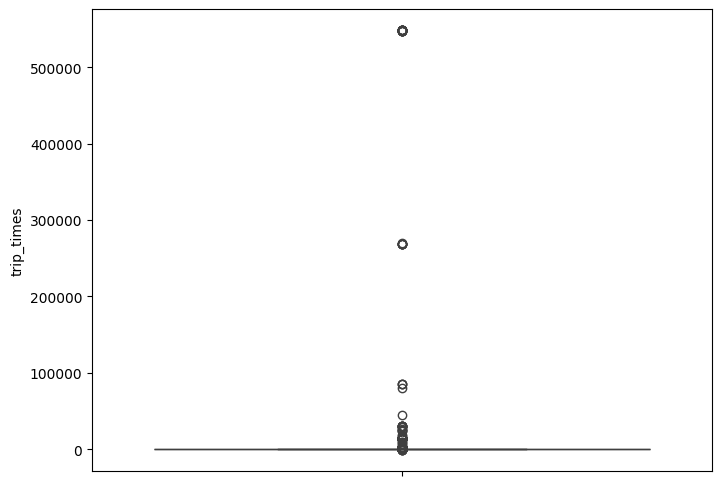

In [ ]:
# The skewed box-plot shows us the presence of outliers
plt.figure(figsize = (8, 6))
sns.boxplot(y="trip_times", data = frame_with_durations)

In [ ]:
# Calculating 0-100th percentile to find the correct percentile value for removal of outliers
var = frame_with_durations["trip_times"].values
var = np.sort(var, axis = None)

for i in range(0,100,10):
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print ("100 percentile value is", var[-1])

0 percentile value is -1211.0166666666667
10 percentile value is 3.8333333333333335
20 percentile value is 5.383333333333334
30 percentile value is 6.816666666666666
40 percentile value is 8.3
50 percentile value is 9.95
60 percentile value is 11.866666666666667
70 percentile value is 14.283333333333333
80 percentile value is 17.633333333333333
90 percentile value is 23.45
100 percentile value is 548555.6333333333


In [ ]:
# Looking further from the 99th percentile
var = frame_with_durations["trip_times"].values
var = np.sort(var,axis = None)

for i in range(90,100):
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print ("100 percentile value is", var[-1])

90 percentile value is 23.45
91 percentile value is 24.35
92 percentile value is 25.383333333333333
93 percentile value is 26.55
94 percentile value is 27.933333333333334
95 percentile value is 29.583333333333332
96 percentile value is 31.683333333333334
97 percentile value is 34.46666666666667
98 percentile value is 38.71666666666667
99 percentile value is 46.75
100 percentile value is 548555.6333333333


In [18]:
frame_with_durations

,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,total_amount,trip_times,pickup_times,Speed
0,1,1.59,-73.993896,40.750111,-73.974785,40.750618,17.05,18.050000,1.421349e+09,5.285319
1,1,3.30,-74.001648,40.724243,-73.994415,40.759109,17.80,19.833333,1.420922e+09,9.983193
2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,10.80,10.050000,1.420922e+09,10.746269
3,1,0.50,-74.009087,40.713818,-74.004326,40.719986,4.80,1.866667,1.420922e+09,16.071429
4,1,3.00,-73.971176,40.762428,-74.004181,40.742653,16.30,19.316667,1.420922e+09,9.318378
...,...,...,...,...,...,...,...,...,...,...
12748981,2,1.00,-73.951988,40.786217,-73.953735,40.775162,7.55,3.933333,1.420917e+09,15.254237
12748982,2,0.80,-73.982742,40.728184,-73.974976,40.720013,8.80,5.700000,1.420917e+09,8.421053
12748983,1,3.40,-73.979324,40.749550,-73.969101,40.787800,14.30,13.283333,1.420917e+09,15.357591
12748984,1,1.30,-73.999565,40.738483,-73.981819,40.737652,13.55,15.316667,1.420917e+09,5.092492


In [19]:
# Loại bỏ dữ liệu không hợp lệ dựa trên phân tích và quy định của TLC:
frame_with_durations_modified = frame_with_durations[(frame_with_durations.trip_times > 1) & \
    (frame_with_durations.trip_times < 720)]
frame_with_durations_modified

,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,total_amount,trip_times,pickup_times,Speed
0,1,1.59,-73.993896,40.750111,-73.974785,40.750618,17.05,18.050000,1.421349e+09,5.285319
1,1,3.30,-74.001648,40.724243,-73.994415,40.759109,17.80,19.833333,1.420922e+09,9.983193
2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,10.80,10.050000,1.420922e+09,10.746269
3,1,0.50,-74.009087,40.713818,-74.004326,40.719986,4.80,1.866667,1.420922e+09,16.071429
4,1,3.00,-73.971176,40.762428,-74.004181,40.742653,16.30,19.316667,1.420922e+09,9.318378
...,...,...,...,...,...,...,...,...,...,...
12748981,2,1.00,-73.951988,40.786217,-73.953735,40.775162,7.55,3.933333,1.420917e+09,15.254237
12748982,2,0.80,-73.982742,40.728184,-73.974976,40.720013,8.80,5.700000,1.420917e+09,8.421053
12748983,1,3.40,-73.979324,40.749550,-73.969101,40.787800,14.30,13.283333,1.420917e+09,15.357591
12748984,1,1.30,-73.999565,40.738483,-73.981819,40.737652,13.55,15.316667,1.420917e+09,5.092492


- Điều kiện lọc là trip_times phải lớn hơn 1 phút và nhỏ hơn 720 phút (12 giờ).
- Điều này giúp loại bỏ các giá trị không hợp lệ hoặc bất thường, chẳng hạn như các chuyến đi có thời gian dưới 1 phút hoặc dài hơn 12 giờ, vốn có thể không thực tế hoặc do lỗi dữ liệu.

<Axes: ylabel='trip_times'>

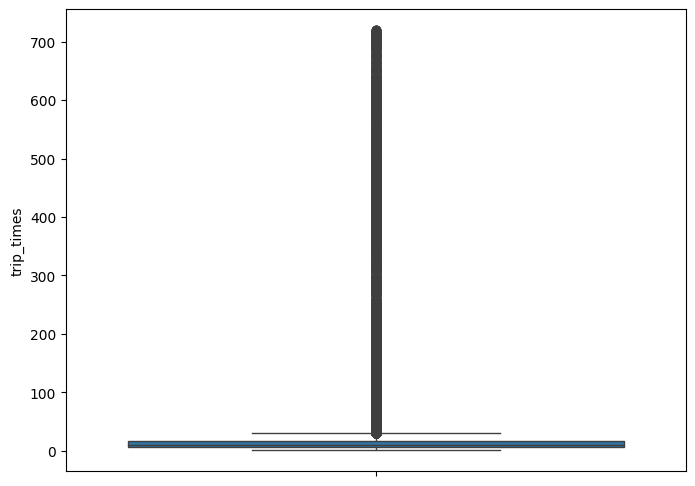

In [ ]:
# Box-plot sau khi removal outliers
plt.figure(figsize = (8, 6))
sns.boxplot(y="trip_times", data = frame_with_durations_modified)

<Axes: xlabel='trip_times', ylabel='Density'>

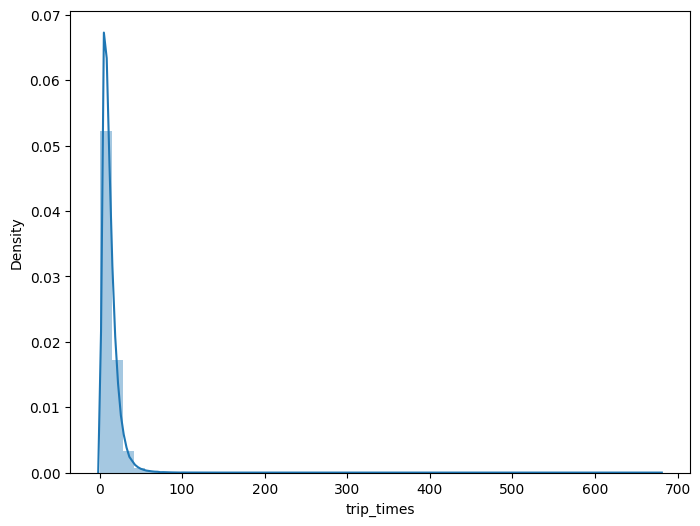

In [ ]:
# PDF (Biểu đồ phân phối mật độ xác suất) của trip-times sau khi loại outiler
tt_sample = frame_with_durations_modified['trip_times'].sample(n = 200000)

plt.figure(figsize = (8, 6))
sns.distplot(tt_sample, hist=True, kde=True)

#### Giả thuyết
Biểu đồ nhìn bằng mắt thường có dạng như phân phối log chuẩn
=> đặt ra giả thuyết: Dữ liệu có phân phối log chuẩn (log-normal)

In [ ]:
# Converting the values to log-values to check for log-normal distribution
frame_with_durations_modified['log_times'] = [math.log(i) for i in frame_with_durations_modified['trip_times'].values]

<Axes: xlabel='log_times', ylabel='Density'>

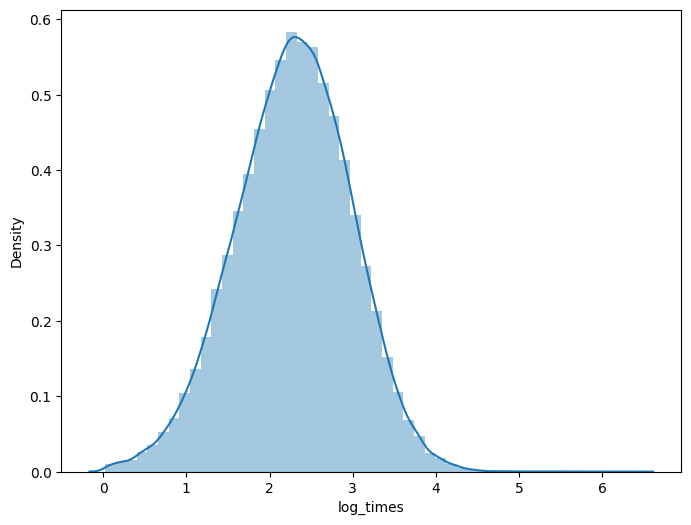

In [ ]:
# PDF of log-values of trip-times
ltt_sample = frame_with_durations_modified['log_times'].sample(n = 200000)

plt.figure(figsize = (8, 6))
sns.distplot(ltt_sample, hist=True, kde=True)

((array([-4.49578239, -4.30333035, -4.19887063, ...,  4.19887063,
          4.30333035,  4.49578239]),
  array([0.0165293 , 0.0165293 , 0.0165293 , ..., 6.54429547, 6.55476402,
         6.57686411])),
 (0.6945482595425954, 2.282578540989302, 0.9991618361110094))

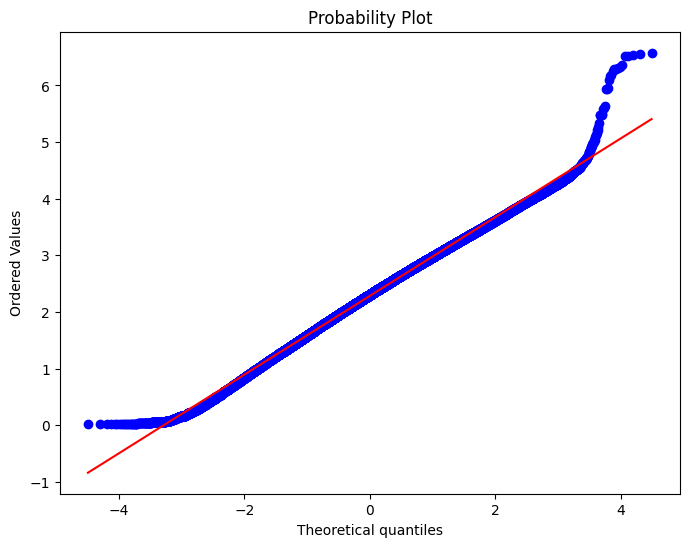

In [ ]:
# tạo một Q-Q plot nhằm kiểm tra xem các giá trị thời gian của chuyến đi (đã được logarit hóa)
# có tuân theo phân phối log-chuẩn hay không. Đây là một phương pháp trực quan để kiểm tra giả thuyết phân phối của dữ liệu.
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.probplot.html
ltt_sample = frame_with_durations_modified['log_times'].sample(n = 200000)

plt.figure(figsize = (8, 6))
scipy.stats.probplot(ltt_sample, plot = plt)

#### Observations:
- Như có thể thấy từ biểu đồ QQ-Plot phía trên, trip_times không hoàn toàn tuân theo phân phối log-normal.
- Từ khoảng [-3 Std-Dev, +3 Std-Dev], nó gần như là một phân phối log-normal, nhưng ngoài khoảng đó, trip_times khác biệt so với phân phối log-normal ở một mức độ nhất định.

## 2.3.4. Speed

<Axes: ylabel='Speed'>

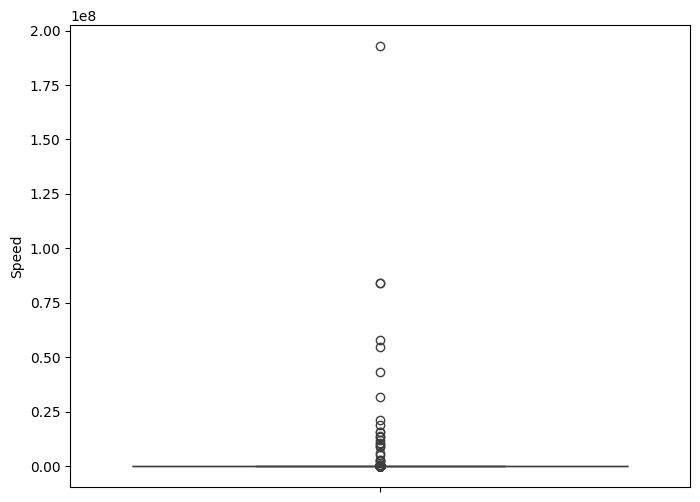

In [ ]:
# Check for any outliers in the data after trip duration outliers have been removed
# Box-plot for speeds with outliers
frame_with_durations_modified['Speed'] = 60 * (frame_with_durations_modified['trip_distance'] / \
    frame_with_durations_modified['trip_times'])

plt.figure(figsize = (8, 6))
sns.boxplot(y="Speed", data = frame_with_durations_modified)

In [ ]:
# Calculating speed values at each percentile: 0,10,20,30,40,50,60,70,80,90,100
var = frame_with_durations_modified["Speed"].values
var = np.sort(var,axis = None)
for i in range(0,100,10):
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

0 percentile value is 0.0
10 percentile value is 6.409495548961425
20 percentile value is 7.80952380952381
30 percentile value is 8.929133858267717
40 percentile value is 9.98019801980198
50 percentile value is 11.06865671641791
60 percentile value is 12.286689419795222
70 percentile value is 13.796407185628745
80 percentile value is 15.963224893917962
90 percentile value is 20.186915887850468
100 percentile value is  192857142.85714284


In [ ]:
# Calculating speed values at each percentile: 90,91,92,93,94,95,96,97,98,99,100
var = frame_with_durations_modified["Speed"].values
var = np.sort(var,axis = None)
for i in range(90,100):
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

90 percentile value is 20.186915887850468
91 percentile value is 20.91645569620253
92 percentile value is 21.752988047808763
93 percentile value is 22.721893491124263
94 percentile value is 23.844155844155843
95 percentile value is 25.182552504038775
96 percentile value is 26.80851063829787
97 percentile value is 28.84304932735426
98 percentile value is 31.591128254580514
99 percentile value is 35.7513566847558
100 percentile value is  192857142.85714284


In [ ]:
# Calculating speed values at each percentile: 99.0,99.1,99.2,99.3,99.4,99.5,99.6,99.7,99.8,99.9,100
var = frame_with_durations_modified["Speed"].values
var = np.sort(var,axis = None)
for i in np.arange(0.0, 1.0, 0.1):
    print("{} percentile value is {}".format(99+i,var[int(len(var)*(float(99+i)/100))]))
print("100 percentile value is ",var[-1])

99.0 percentile value is 35.7513566847558
99.1 percentile value is 36.31084727468969
99.2 percentile value is 36.91470054446461
99.3 percentile value is 37.588235294117645
99.4 percentile value is 38.33035714285714
99.5 percentile value is 39.17580340264651
99.6 percentile value is 40.15384615384615
99.7 percentile value is 41.338301043219076
99.8 percentile value is 42.86631016042781
99.9 percentile value is 45.3107822410148
100 percentile value is  192857142.85714284


In [ ]:
# Removing further outliers based on the 99.9th percentile value
frame_with_durations_modified = frame_with_durations[(frame_with_durations.Speed > 0) & \
    (frame_with_durations.Speed < 45.31)]

#### Giả thuyết
Tốc độ trung bình của taxi ở New York là 20 dặm/giờ ?

In [ ]:
import scipy.stats as stats

# Tốc độ trung bình giả thuyết
hypothesized_mean = 12

# Lấy mẫu tốc độ
speeds = frame_with_durations_modified["Speed"]

# Thực hiện kiểm định t-test một phía
t_statistic, p_value = stats.ttest_1samp(speeds, hypothesized_mean, alternative='less')

# Hiển thị kết quả
print("T-Statistic:", t_statistic)
print("P-Value:", p_value)

# Kiểm định giả thuyết
alpha = 0.05
if p_value < alpha:
    print("Bác bỏ giả thuyết H0. Tốc độ trung bình nhỏ hơn 12.")
else:
    print("Không đủ bằng chứng để bác bỏ giả thuyết H0. Tốc độ trung bình không nhỏ hơn 12.")

T-Statistic: 2.900373339959639
P-Value: 0.998136404603501
Không đủ bằng chứng để bác bỏ giả thuyết H0. Tốc độ trung bình không nhỏ hơn 12.


In [ ]:
# Average speed of cabs in New-York
sum(frame_with_durations_modified["Speed"]) / float(len(frame_with_durations_modified["Speed"]))

12.450173996027528

#### Observations:
- Tốc độ trung bình của tài xế taxi ở New York là **12,45 dặm/giờ**, vì vậy một tài xế taxi có thể di chuyển 2 dặm trong khoảng thời gian 10 phút trung bình.
- Chúng ta sẽ sử dụng quan sát này để xác định các khoảng thời gian và khu vực.

## 2.3.5. Trip Distance

<Axes: ylabel='trip_distance'>

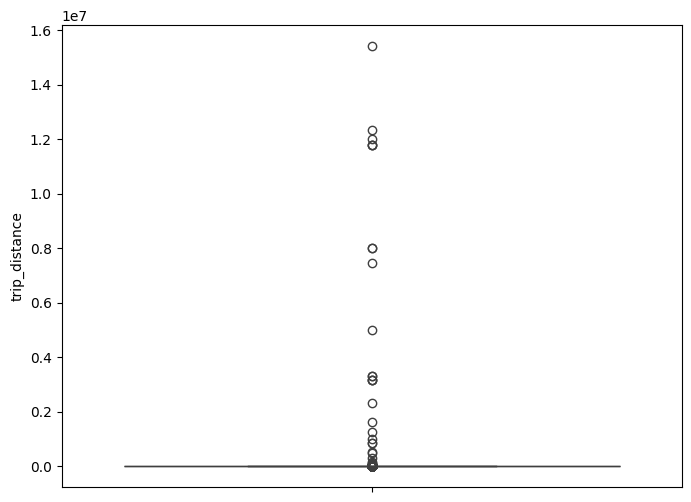

In [ ]:
plt.figure(figsize = (8, 6))
sns.boxplot(y = "trip_distance", data = frame_with_durations_modified)

In [ ]:
# Calculating trip distance values at each percentile: 0,10,20,30,40,50,60,70,80,90,100
var = frame_with_durations_modified["trip_distance"].values
var = np.sort(var,axis = None)
for i in range(0,100,10):
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

0 percentile value is 0.0
10 percentile value is 0.67
20 percentile value is 0.9
30 percentile value is 1.1
40 percentile value is 1.39
50 percentile value is 1.7
60 percentile value is 2.08
70 percentile value is 2.61
80 percentile value is 3.6
90 percentile value is 6.0
100 percentile value is  15420004.5


In [ ]:
# Calculating trip distance values at each percentile: 90,91,92,93,94,95,96,97,98,99,100
var = frame_with_durations_modified["trip_distance"].values
var = np.sort(var,axis = None)
for i in range(90,100):
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

90 percentile value is 6.0
91 percentile value is 6.5
92 percentile value is 7.1
93 percentile value is 7.91
94 percentile value is 8.8
95 percentile value is 9.7
96 percentile value is 10.7
97 percentile value is 12.3
98 percentile value is 16.29
99 percentile value is 18.23
100 percentile value is  15420004.5


In [ ]:
# Calculating trip distance values at each percentile: 99.0,99.1,99.2,99.3,99.4,99.5,99.6,99.7,99.8,99.9,100
var = frame_with_durations_modified["trip_distance"].values
var = np.sort(var,axis = None)
for i in np.arange(0.0, 1.0, 0.1):
    print("{} percentile value is {}".format(99+i,var[int(len(var)*(float(99+i)/100))]))
print("100 percentile value is ",var[-1])

99.0 percentile value is 18.23
99.1 percentile value is 18.44
99.2 percentile value is 18.69
99.3 percentile value is 18.93
99.4 percentile value is 19.24
99.5 percentile value is 19.6
99.6 percentile value is 20.1
99.7 percentile value is 20.68
99.8 percentile value is 21.4
99.9 percentile value is 23.1
100 percentile value is  15420004.5


In [ ]:
# Removing further outliers based on the 99.9th percentile value
frame_with_durations_modified=frame_with_durations[(frame_with_durations.trip_distance > 0) & \
    (frame_with_durations.trip_distance < 23)]

<Axes: ylabel='trip_distance'>

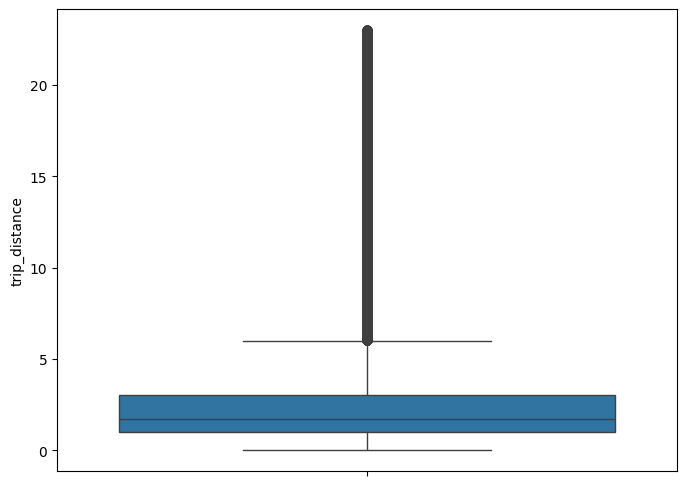

In [ ]:
# Box-plot after removal of outliers
plt.figure(figsize = (8, 6))
sns.boxplot(y="trip_distance", data = frame_with_durations_modified)

## 2.3.6. Total Fare

<Axes: ylabel='total_amount'>

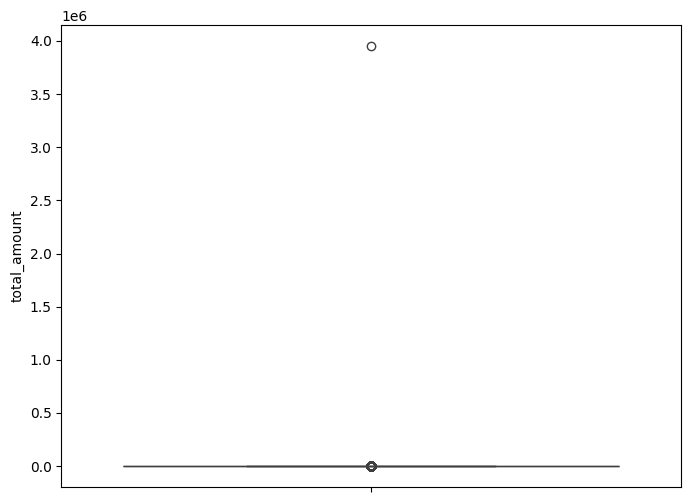

In [ ]:
plt.figure(figsize = (8, 6))
sns.boxplot(y="total_amount", data = frame_with_durations_modified)

In [ ]:
# Calculating total fare amount values at each percentile: 0,10,20,30,40,50,60,70,80,90,100
var = frame_with_durations_modified["total_amount"].values
var = np.sort(var,axis = None)
for i in range(0,100,10):
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

0 percentile value is -242.55
10 percentile value is 6.3
20 percentile value is 7.8
30 percentile value is 8.8
40 percentile value is 9.8
50 percentile value is 11.16
60 percentile value is 12.8
70 percentile value is 14.8
80 percentile value is 18.3
90 percentile value is 25.8
100 percentile value is  3950611.6


In [ ]:
# Calculating total fare amount values at each percentile: 90,91,92,93,94,95,96,97,98,99,100
var = frame_with_durations_modified["total_amount"].values
var = np.sort(var,axis = None)
for i in range(90,100):
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

90 percentile value is 25.8
91 percentile value is 27.3
92 percentile value is 29.3
93 percentile value is 31.8
94 percentile value is 34.8
95 percentile value is 38.53
96 percentile value is 42.6
97 percentile value is 48.13
98 percentile value is 58.13
99 percentile value is 66.13
100 percentile value is  3950611.6


In [ ]:
# Calculating total fare amount values at each percentile: 99.0,99.1,99.2,99.3,99.4,99.5,99.6,99.7,99.8,99.9,100
var = frame_with_durations_modified["total_amount"].values
var = np.sort(var,axis = None)
for i in np.arange(0.0, 1.0, 0.1):
    print("{} percentile value is {}".format(99+i,var[int(len(var)*(float(99+i)/100))]))
print("100 percentile value is ",var[-1])

99.0 percentile value is 66.13
99.1 percentile value is 68.13
99.2 percentile value is 69.6
99.3 percentile value is 69.6
99.4 percentile value is 69.73
99.5 percentile value is 69.75
99.6 percentile value is 69.76
99.7 percentile value is 72.58
99.8 percentile value is 75.35
99.9 percentile value is 88.28
100 percentile value is  3950611.6


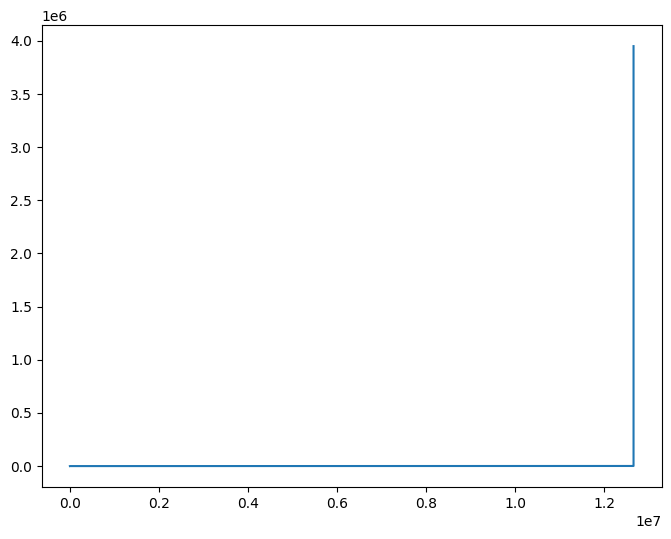

In [ ]:
plt.figure(figsize = (8, 6))
plt.plot(var)
plt.show()

Dữ liệu bị tăng đột ngột ở tầm phân vị thứ 99.9

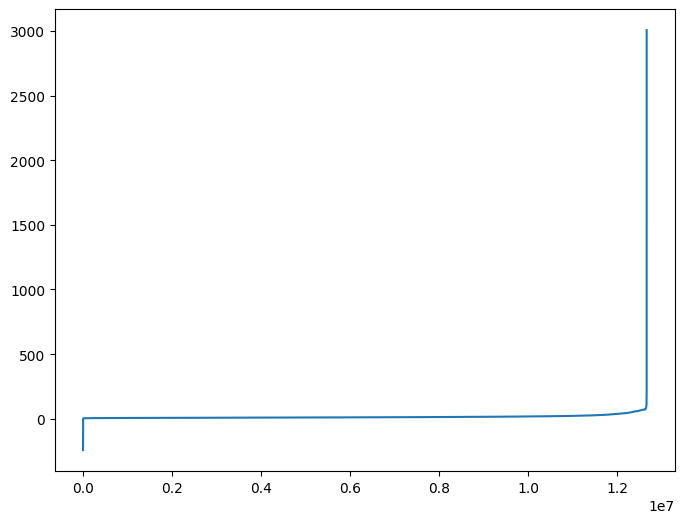

In [ ]:
plt.figure(figsize = (8, 6))
plt.plot(var[:-2])
plt.show()

#### Observations:
- Có thể thấy một sự tăng rất mạnh trong các giá trị giá cước
- Vẽ biểu đồ ba giá trị giá cước cuối cùng có một sự tăng đột ngột trong các giá trị

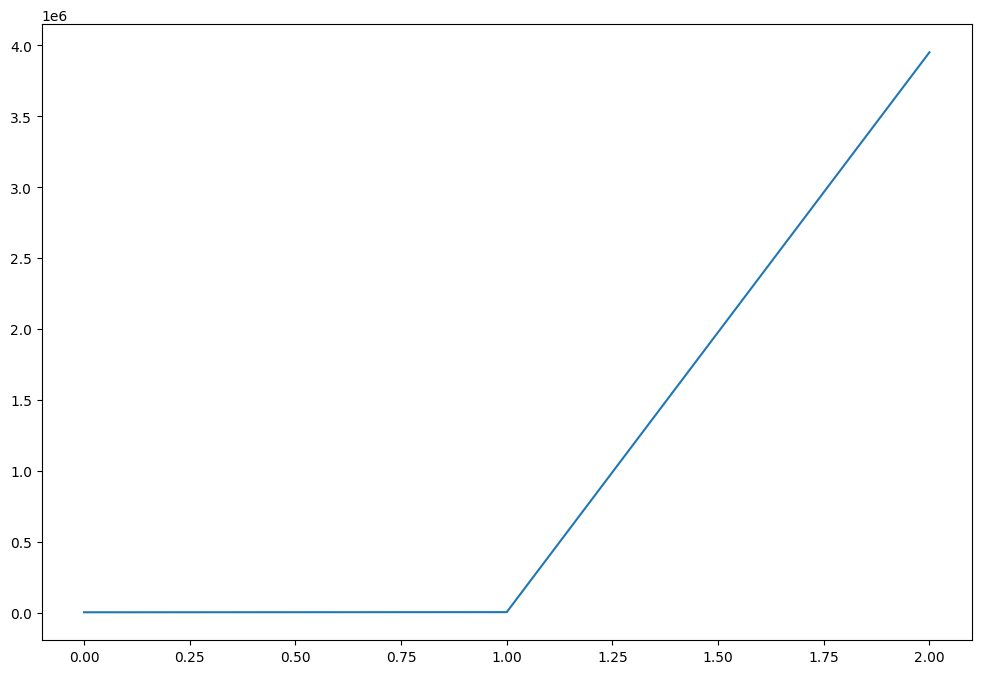

In [ ]:
plt.figure(figsize = (12, 8))
plt.plot(var[-3:])
plt.show()

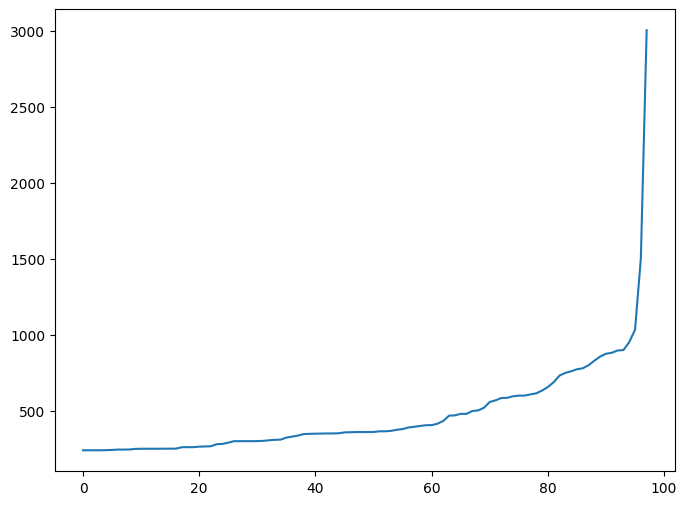

In [ ]:
# Bây giờ xem xét các giá trị không bao gồm hai điểm cuối cùng, chúng ta lại thấy một sự tăng mạnh
# ở khoảng giá trị giá cước 1000. Chúng ta vẽ biểu đồ 100 giá trị cuối cùng, ngoại trừ hai giá trị cuối.
plt.figure(figsize = (8, 6))
plt.plot(var[-100:-2])
plt.show()

## 2.3.7. Loại bỏ tất cả các điểm ngoại lai/sai lệch
Dựa trên phân tích đơn biến số (numerical/graphical univariate analysis) mà chúng ta đã thực hiện với *pickup coordinates, dropoff coordinates, trip durations, trip distances, speeds and total fares* chúng ta sẽ tạo ra một hàm để áp dụng tất cả các bước tiền xử lý đó.

In [37]:
def remove_outliers(new_frame):
    a = new_frame.shape[0]
    print("Number of pickup records:", a)

    temp_frame = new_frame[((new_frame.dropoff_longitude >= -74.15) & (new_frame.dropoff_longitude <= -73.7004) &\
        (new_frame.dropoff_latitude >= 40.5774) & (new_frame.dropoff_latitude <= 40.9176)) & \
        ((new_frame.pickup_longitude >= -74.15) & (new_frame.pickup_latitude >= 40.5774)& \
        (new_frame.pickup_longitude <= -73.7004) & (new_frame.pickup_latitude <= 40.9176))]
    b = temp_frame.shape[0]
    print("Number of outlier coordinates lying outside NY boundaries:", (a-b))

    temp_frame = new_frame[(new_frame.trip_times > 0) & (new_frame.trip_times < 720)]
    c = temp_frame.shape[0]
    print("Number of outliers from trip times analysis:", (a-c))

    temp_frame = new_frame[(new_frame.trip_distance > 0) & (new_frame.trip_distance < 23)]
    d = temp_frame.shape[0]
    print ("Number of outliers from trip distance analysis:", (a-d))

    temp_frame = new_frame[(new_frame.Speed <= 45.31) & (new_frame.Speed >= 0)]
    e = temp_frame.shape[0]
    print ("Number of outliers from speed analysis:", (a-e))

    temp_frame = new_frame[(new_frame.total_amount < 1000) & (new_frame.total_amount > 0)]
    f = temp_frame.shape[0]
    print ("Number of outliers from fare analysis:", (a-f))


    new_frame = new_frame[((new_frame.dropoff_longitude >= -74.15) & (new_frame.dropoff_longitude <= -73.7004) &\
        (new_frame.dropoff_latitude >= 40.5774) & (new_frame.dropoff_latitude <= 40.9176)) & \
        ((new_frame.pickup_longitude >= -74.15) & (new_frame.pickup_latitude >= 40.5774)& \
        (new_frame.pickup_longitude <= -73.7004) & (new_frame.pickup_latitude <= 40.9176))]
    new_frame = new_frame[(new_frame.trip_times > 0) & (new_frame.trip_times < 720)]
    new_frame = new_frame[(new_frame.trip_distance > 0) & (new_frame.trip_distance < 23)]
    new_frame = new_frame[(new_frame.Speed < 45.31) & (new_frame.Speed > 0)]
    new_frame = new_frame[(new_frame.total_amount < 1000) & (new_frame.total_amount > 0)]

    print ("Total outliers removed", a-new_frame.shape[0])
    return new_frame

In [38]:
print ("Removing outliers in the month of Jan-2015")
frame_with_durations_outliers_removed = remove_outliers(frame_with_durations)
print("Fraction of data points that remain after removing outliers",
    float(len(frame_with_durations_outliers_removed)) / len(frame_with_durations))

Removing outliers in the month of Jan-2015
Number of pickup records: 12748986
Number of outlier coordinates lying outside NY boundaries: 293919
Number of outliers from trip times analysis: 23889
Number of outliers from trip distance analysis: 92597
Number of outliers from speed analysis: 36690
Number of outliers from fare analysis: 5275
Total outliers removed 377910
Fraction of data points that remain after removing outliers 0.9703576425607495


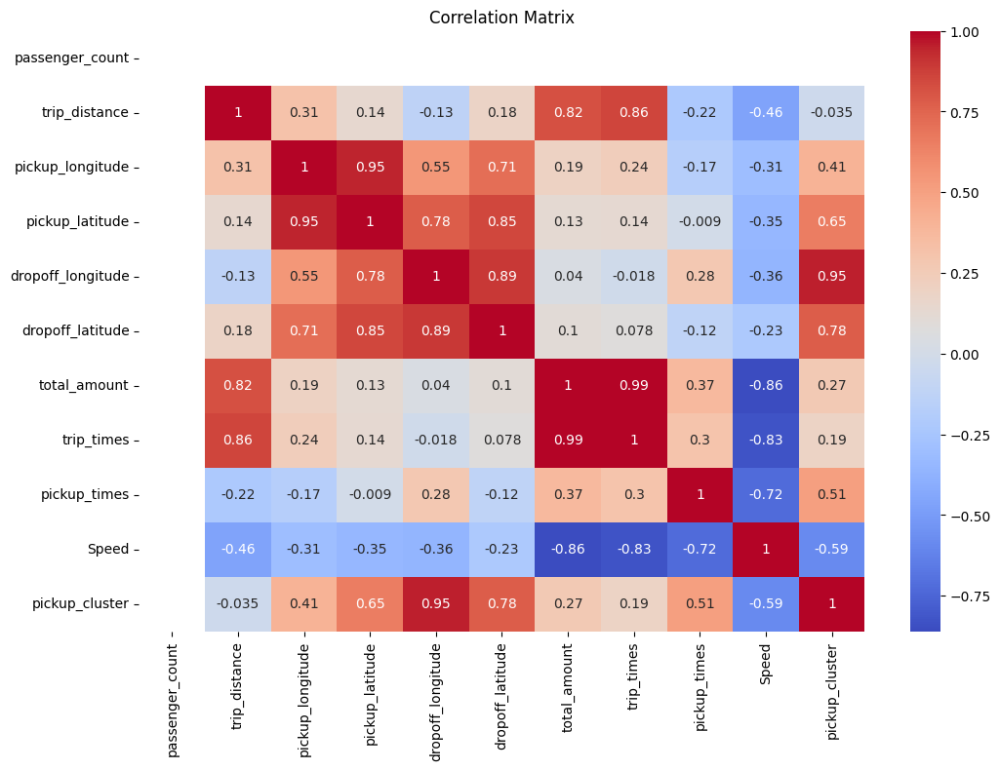

In [ ]:
df = frame_with_durations_outliers_removed.head()
# Tính toán ma trận tương quan
correlation_matrix = df.corr()

# Vẽ heatmap của ma trận tương quan
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

##2.4. Xây dựng model khi chưa áp dụng phân cụm

In [22]:
# Tách đặc trưng và biến mục tiêu, loại bỏ các thuộc tính không cần thiết
X = frame_with_durations_outliers_removed.drop(['total_amount', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude'], axis=1)
y = frame_with_durations_outliers_removed['total_amount']

In [23]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.3, random_state=42)

###2.4.1 Linear Regression Model

In [28]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import LinearRegression
from sklearn import metrics

In [24]:
# Scaling the data
y_train= y_train.values.reshape(-1,1)
y_test= y_test.values.reshape(-1,1)

from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()
sc_y = StandardScaler()
X_train = sc_X.fit_transform(X_train)
X_test = sc_X.fit_transform(X_test)
y_train = sc_X.fit_transform(y_train)
y_test = sc_y.fit_transform(y_test)

In [30]:
lm = LinearRegression()
lm.fit(X_train,y_train)
lm_prediction = lm.predict(X_test)

# Evaluation metrics
mae_lm = metrics.mean_absolute_error(y_test, lm_prediction)
mse_lm =  metrics.mean_squared_error(y_test, lm_prediction)
rmse_lm =  np.sqrt(mse_lm)

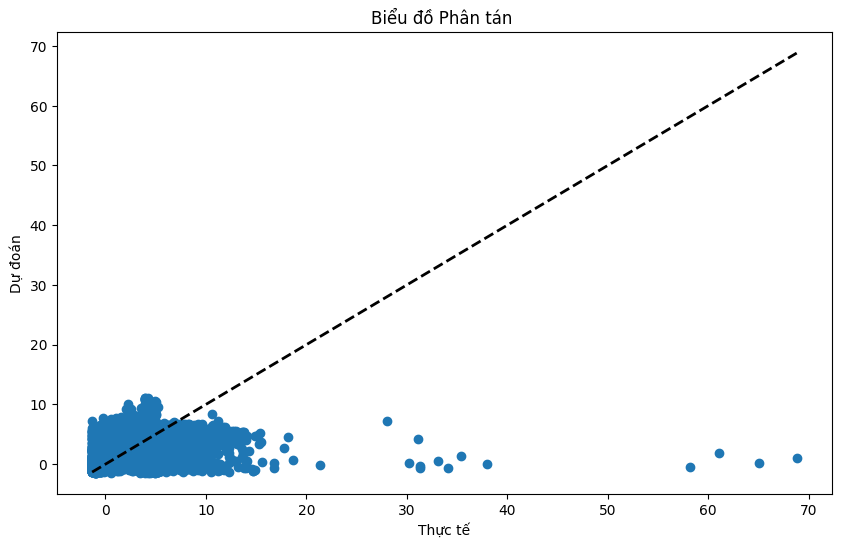

In [31]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test, lm_prediction)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xlabel('Thực tế')
plt.ylabel('Dự đoán')
plt.title('Biểu đồ Phân tán ')
plt.show()

In [32]:
print('MAE:', mae_lm)
print('MSE:', mse_lm)
print('RMSE:', rmse_lm)

MAE: 0.14201356848142654
MSE: 0.08257339853957504
RMSE: 0.28735587437805243


###2.4.2 Decision Tree

In [33]:
from sklearn.tree import DecisionTreeRegressor
dt = DecisionTreeRegressor(random_state = 100)
dt.fit(X_train, y_train)
dt_prediction = dt.predict(X_test)

# Evaluation metrics
mae_dt = metrics.mean_absolute_error(y_test, dt_prediction)
mse_dt =  metrics.mean_squared_error(y_test, dt_prediction)
rmse_dt =  np.sqrt(mse_dt)

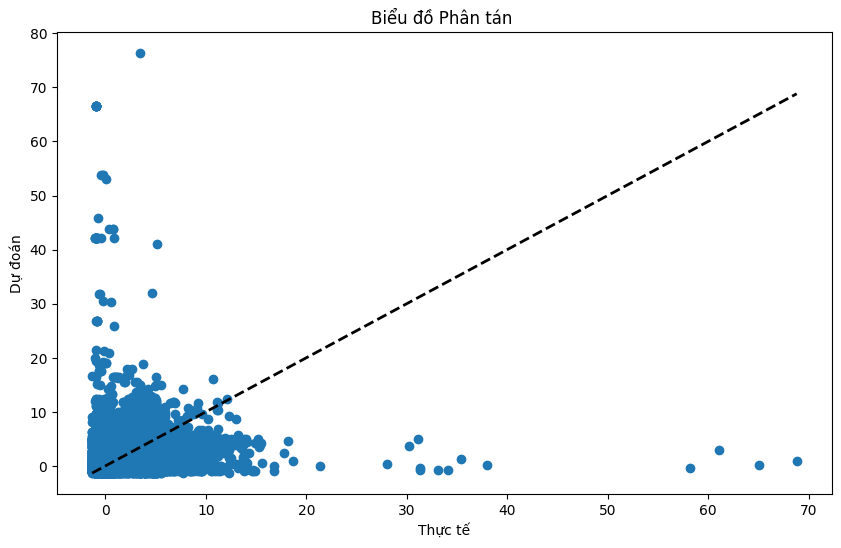

In [34]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test, dt_prediction)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xlabel('Thực tế')
plt.ylabel('Dự đoán')
plt.title('Biểu đồ Phân tán ')
plt.show()

In [35]:
print('MAE:', mae_dt)
print('MSE:', mse_dt)
print('RMSE:', rmse_dt)

MAE: 0.16354607765885096
MSE: 0.15778282688147596
RMSE: 0.3972188652134689


##2.5 Xây dựng model áp dụng phân cụm

###2.5.1 Chuẩn bị data cho xây dựng model


####Clustering/Segmentation
- Trong quá trình phân cụm, khoảng cách giữa 2 cụm gần nhau được cân nhắc đặt là **2 dặm**.
- Trong phần 1.4, ta đã quan sát thấy rằng trung bình một tài xế taxi có thể đi được 2 dặm trong khoảng 10 phút, và vì 2 dặm là khoảng cách có thể chấp nhận được để tìm thêm #pickups, do đó ta đã đặt ngưỡng 2 dặm.
- Chúng ta cần chọn số cụm sao cho có nhiều vùng cụm gần trung tâm cụm nào hơn và đảm bảo khoảng cách tối thiểu giữa các cụm không quá nhỏ.

In [36]:
from sklearn.cluster import MiniBatchKMeans

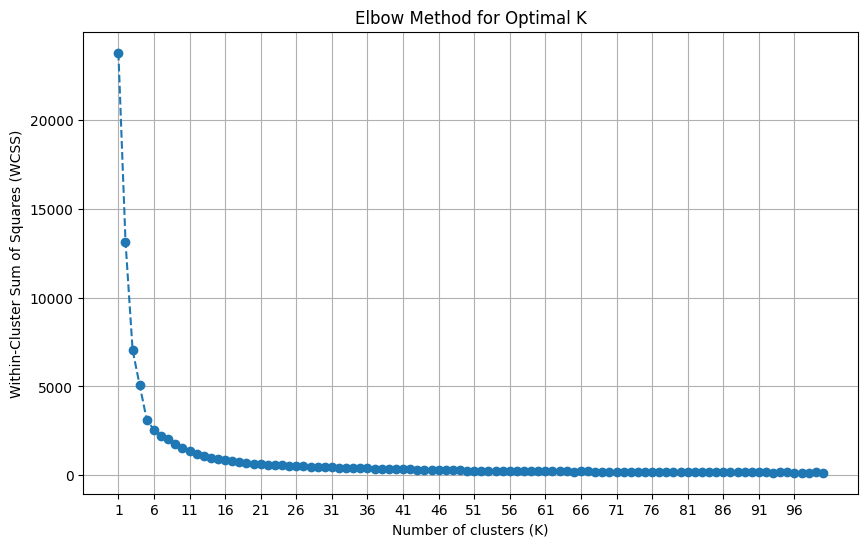

In [37]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'frame_with_durations_outliers_removed' is your DataFrame
coords = frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']].values

# Function to calculate WCSS for a given number of clusters
def calculate_wcss(coords, max_k):
    wcss = []
    for k in range(1, max_k+1):
        kmeans = MiniBatchKMeans(n_clusters=k, batch_size=10000, random_state=42)
        kmeans.fit(coords)
        wcss.append(kmeans.inertia_)  # WCSS
    return wcss

# Calculate WCSS for K ranging from 1 to 100
max_k = 100
wcss = calculate_wcss(coords, max_k)

# Plotting the WCSS to find the elbow point
plt.figure(figsize=(10, 6))
plt.plot(range(1, max_k+1), wcss, marker='o', linestyle='--')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.xticks(np.arange(1, max_k+1, step=5))
plt.grid(True)
plt.show()

In [39]:
# Trying different cluster sizes to choose the right K in K-means
coords = frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']].values
neighbours = []

def find_min_distance(cluster_centers, cluster_len):
    nice_points = 0
    wrong_points = 0
    less2 = []
    more2 = []
    # Stored & Calculated in miles
    min_dist = 1000

    for i in range(0, cluster_len):
        nice_points = 0
        wrong_points = 0
        for j in range(0, cluster_len):
            if j != i:
                distance = gpxpy.geo.haversine_distance(cluster_centers[i][0], cluster_centers[i][1],
                    cluster_centers[j][0], cluster_centers[j][1])
                # `distance` is in meters, so, we have converted it into miles
                min_dist = min(min_dist, distance/(1.60934*1000))
                if (distance/(1.60934*1000)) <= 2: nice_points += 1
                else: wrong_points += 1
        less2.append(nice_points)
        more2.append(wrong_points)
    neighbours.append(less2)
    print ("On choosing a cluster size of:", cluster_len, "\nAvg. #Clusters within the vicinity (i.e. intercluster-distance < 2):",
        np.ceil(sum(less2)/len(less2)), "\nAvg. #Clusters outside the vicinity (i.e. intercluster-distance > 2):",
        np.ceil(sum(more2)/len(more2)), "\nMin inter-cluster distance:", min_dist, "\n")

# https://scikit-learn.org/stable/modules/clustering.html#mini-batch-kmeans
def find_clusters(increment):
    kmeans = MiniBatchKMeans(n_clusters=increment, batch_size=10000, random_state=42).fit(coords)
    frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])
    cluster_centers = kmeans.cluster_centers_
    cluster_len = len(cluster_centers)
    return cluster_centers, cluster_len

for increment in range(10, 100, 10):
    cluster_centers, cluster_len = find_clusters(increment)
    find_min_distance(cluster_centers, cluster_len)

On choosing a cluster size of: 10 
Avg. #Clusters within the vicinity (i.e. intercluster-distance < 2): 2.0 
Avg. #Clusters outside the vicinity (i.e. intercluster-distance > 2): 8.0 
Min inter-cluster distance: 0.9403042157013325 

On choosing a cluster size of: 20 
Avg. #Clusters within the vicinity (i.e. intercluster-distance < 2): 4.0 
Avg. #Clusters outside the vicinity (i.e. intercluster-distance > 2): 15.0 
Min inter-cluster distance: 0.6591575997035559 

On choosing a cluster size of: 30 
Avg. #Clusters within the vicinity (i.e. intercluster-distance < 2): 8.0 
Avg. #Clusters outside the vicinity (i.e. intercluster-distance > 2): 22.0 
Min inter-cluster distance: 0.4816324407604508 

On choosing a cluster size of: 40 
Avg. #Clusters within the vicinity (i.e. intercluster-distance < 2): 11.0 
Avg. #Clusters outside the vicinity (i.e. intercluster-distance > 2): 29.0 
Min inter-cluster distance: 0.45331676035418483 

On choosing a cluster size of: 50 
Avg. #Clusters within the vi

#### Observations:
- Mục tiêu chính là tìm khoảng cách tối thiểu tối ưu giữa các cụm. Nếu ta kiểm tra 50 cụm, chúng ta có thể thấy rằng có hai cụm chỉ cách nhau *0.3* dặm, vì vậy chúng ta chọn 40 cụm.

In [40]:
# Getting 40 clusters using K-Means
kmeans = MiniBatchKMeans(n_clusters=40, batch_size=10000, random_state=0).fit(coords)
frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])

#### Plotting the Clusters

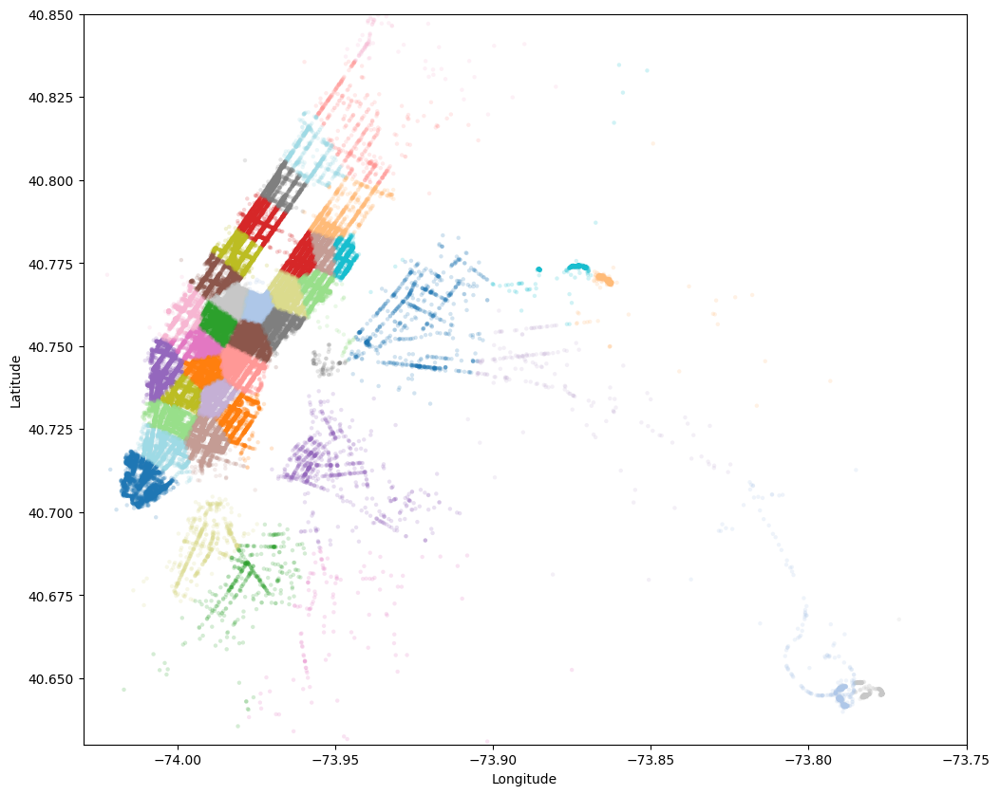

In [ ]:
# Visualising the clusters on a map
def plot_clusters(frame):
    city_long_border = (-74.03, -73.75)
    city_lat_border = (40.63, 40.85)
    fig, ax = plt.subplots(ncols=1, nrows=1, figsize = (12, 10))
    ax.scatter(frame.pickup_longitude.values[:100000], frame.pickup_latitude.values[:100000], s=10,
        lw=0, c=frame.pickup_cluster.values[:100000], cmap='tab20', alpha=0.2)
    ax.set_xlim(city_long_border)
    ax.set_ylim(city_lat_border)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    plt.show()

plot_clusters(frame_with_durations_outliers_removed)

### 2.5.2 Time Binning
- Các mốc thời gian tương ứng với Unix Time-Stamp: https://www.unixtimestamp.com/
| Unix Time Stamp | YYYY-MM-DD HH:MM:SS |
| --- | --- |
| 1420070400 | 2015-01-01 00:00:00 |
| 1422748800 | 2015-02-01 00:00:00 |
| 1425168000 | 2015-03-01 00:00:00 |
| 1427846400 | 2015-04-01 00:00:00 |
| 1430438400 | 2015-05-01 00:00:00 |
| 1433116800 | 2015-06-01 00:00:00 |
| 1451606400 | 2016-01-01 00:00:00 |
| 1454284800 | 2016-02-01 00:00:00 |
| 1456790400 | 2016-03-01 00:00:00 |
| 1459468800 | 2016-04-01 00:00:00 |
| 1462060800 | 2016-05-01 00:00:00 |
| 1464739200 | 2016-06-01 00:00:00 |

- Reference for EST: https://www.timeanddate.com/time/zones/est
- **(int((i-start_pickup_unix)/600) + 33)**: The unix time is in GMT/UTC, so, we are converting it to EST (Eastern Standard Time)

In [ ]:
def add_pickup_bins(frame, month, year):
    unix_pickup_times = [i for i in frame['pickup_times'].values]
    unix_times = [[1420070400,1422748800,1425168000,1427846400,1430438400,1433116800],\
                    [1451606400,1454284800,1456790400,1459468800,1462060800,1464739200]]
    start_pickup_unix = unix_times[year-2015][month-1]

    tenminutewise_binned_unix_pickup_times=[(int((i-start_pickup_unix)/600)+33) for i in unix_pickup_times]
    frame['pickup_bins'] = np.array(tenminutewise_binned_unix_pickup_times)
    return frame

In [ ]:
# Clustering, making pickup bins and grouping by pickup cluster and pickup bins
jan_2015_frame = add_pickup_bins(frame_with_durations_outliers_removed,1,2015)
jan_2015_groupby = jan_2015_frame[['pickup_cluster','pickup_bins','trip_distance']] \
    .groupby(['pickup_cluster','pickup_bins']).count()
jan_2015_groupby = jan_2015_groupby.rename(columns = {'trip_distance': 'pickups'})

In [ ]:
jan_2015_frame.to_csv('jan_2015_frame.csv', index=False)
jan_2015_groupby.to_csv('jan_2015_groupby.csv', index=False)

In [ ]:
jan_2015_frame

,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,total_amount,trip_times,pickup_times,Speed,pickup_bins,pickup_cluster
0,1,1.59,-73.993896,40.750111,-73.974785,40.750618,17.05,18.050000,1.421349e+09,5.285319,2163,25
1,1,3.30,-74.001648,40.724243,-73.994415,40.759109,17.80,19.833333,1.420922e+09,9.983193,1452,11
2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,10.80,10.050000,1.420922e+09,10.746269,1452,28
3,1,0.50,-74.009087,40.713818,-74.004326,40.719986,4.80,1.866667,1.420922e+09,16.071429,1452,0
4,1,3.00,-73.971176,40.762428,-74.004181,40.742653,16.30,19.316667,1.420922e+09,9.318378,1452,2
...,...,...,...,...,...,...,...,...,...,...,...,...
12371071,2,1.00,-73.951988,40.786217,-73.953735,40.775162,7.55,3.933333,1.420917e+09,15.254237,1443,6
12371072,2,0.80,-73.982742,40.728184,-73.974976,40.720013,8.80,5.700000,1.420917e+09,8.421053,1443,4
12371073,1,3.40,-73.979324,40.749550,-73.969101,40.787800,14.30,13.283333,1.420917e+09,15.357591,1443,21
12371074,1,1.30,-73.999565,40.738483,-73.981819,40.737652,13.55,15.316667,1.420917e+09,5.092492,1443,33


- Thêm 2 cột: pickup_cluster (thuộc về cụm nào) và pickup_bins (thuộc về khoảng thời gian 10 phút nào trong chuyến đi).
- Ở đây, số lần (pickups) đại diện cho số lần pickup đã xảy ra trong khoảng thời gian 10 phút cụ. Dataframe chỉ có 2 chỉ số:

  - Chỉ số chính: pickup_cluster (Số cụm)
  - Chỉ số phụ: pickup_bins (Chia toàn bộ thời gian trong tháng thành các khoảng thời gian 10 phút, tổng cộng 4464 khoảng thời gian)
- Ta đã làm sạch và chuẩn bị dữ liệu cho tháng 1 năm 2015. Bây giờ, chúng tôi sẽ thực hiện các thao tác tương tự cho các tháng 1, 2 và 3 năm 2016:
  - Lấy khung dữ liệu bao gồm chỉ các cột cần thiết.
  - Thêm  trip times, speed, unix time-stamp of pickup_time
  - Loại bỏ các giá trị ngoại lai dựa trên thời gian chuyến đi, tốc độ, thời gian chuyến đi và tổng số tiền.
  - Thêm pickup_cluster cho mỗi điểm dữ liệu.
  - Thêm pickup_bin (chỉ số của khoảng thời gian 10 phút mà chuyến đi đó thuộc về).
  - Nhóm dữ liệu dựa trên ‘pickup_cluster’ và 'pickup_bin

In [ ]:
# Data Preparation for the months of Jan,Feb and March 2016
# Here, `month` refers to the Dask Dataframe
def datapreparation(month, kmeans, month_no, year_no):
    # Add the trip-times
    frame_with_durations = return_with_trip_times(month)

    # Remove the outliers
    frame_with_durations_outliers_removed = remove_outliers(frame_with_durations)
    print("\n")

    # Estimating Clusters
    frame_with_durations_outliers_removed['pickup_cluster'] = kmeans.predict(frame_with_durations_outliers_removed[['pickup_latitude', 'pickup_longitude']])

    # Performing the Group-By operation
    final_updated_frame = add_pickup_bins(frame_with_durations_outliers_removed, month_no, year_no)
    final_groupby_frame = final_updated_frame[['pickup_cluster','pickup_bins','trip_distance']].groupby(['pickup_cluster','pickup_bins']).count()
    final_groupby_frame = final_groupby_frame.rename(columns = {'trip_distance': 'pickups'})
    return final_updated_frame, final_groupby_frame
import dask.dataframe as dd

In [ ]:
# Chỉ định kiểu dữ liệu cho các cột
dtype_dict = {'tip_amount': 'float64',
              'tolls_amount': 'float64'}

# Đọc dữ liệu với kiểu dữ liệu được chỉ định
month_jan_2016 = dd.read_csv('yellow_tripdata_2016-01.csv', dtype=dtype_dict)
month_feb_2016 = dd.read_csv('yellow_tripdata_2016-02.csv', dtype=dtype_dict)
month_mar_2016 = dd.read_csv('yellow_tripdata_2016-03.csv', dtype=dtype_dict)

# Gọi hàm datapreparation
jan_2016_frame, jan_2016_groupby = datapreparation(month_jan_2016, kmeans, 1, 2016)
feb_2016_frame, feb_2016_groupby = datapreparation(month_feb_2016, kmeans, 2, 2016)
mar_2016_frame, mar_2016_groupby = datapreparation(month_mar_2016, kmeans, 3, 2016)

Number of pickup records: 10906858
Number of outlier coordinates lying outside NY boundaries: 214677
Number of outliers from trip times analysis: 27190
Number of outliers from trip distance analysis: 79742
Number of outliers from speed analysis: 31018
Number of outliers from fare analysis: 4991
Total outliers removed 297784




/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but MiniBatchKMeans was fitted without feature names
  warnings.warn(


Number of pickup records: 11382049
Number of outlier coordinates lying outside NY boundaries: 223161
Number of outliers from trip times analysis: 27670
Number of outliers from trip distance analysis: 81902
Number of outliers from speed analysis: 31866
Number of outliers from fare analysis: 5476
Total outliers removed 308177




/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but MiniBatchKMeans was fitted without feature names
  warnings.warn(


Number of pickup records: 12210952
Number of outlier coordinates lying outside NY boundaries: 232444
Number of outliers from trip times analysis: 30868
Number of outliers from trip distance analysis: 87318
Number of outliers from speed analysis: 33076
Number of outliers from fare analysis: 5859
Total outliers removed 324635




/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but MiniBatchKMeans was fitted without feature names
  warnings.warn(


Vì thời gian chạy quá lâu nên cần lưu dataframe

jan_2016_frame.to_csv('jan_2016_frame.csv', index=False)
jan_2016_groupby.to_csv('jan_2016_groupby.csv', index=False)


feb_2016_frame.to_csv('feb_2016_frame.csv', index=False)
feb_2016_groupby.to_csv('feb_2016_groupby.csv', index=False)

mar_2016_frame.to_csv('mar_2016_frame.csv', index=False)
mar_2016_groupby.to_csv('mar_2016_groupby.csv', index=False)

In [10]:
jan_2015_frame = pd.read_csv('data/data_extra/jan_2015_frame.csv')
jan_2015_groupby = pd.read_csv('data/data_extra/jan_2015_groupby.csv')

jan_2016_frame = pd.read_csv('data/data_extra/jan_2016_frame.csv')
jan_2016_groupby = pd.read_csv('data/data_extra/jan_2016_groupby.csv')

feb_2016_frame = pd.read_csv('data/data_extra/feb_2016_frame.csv')
feb_2016_groupby = pd.read_csv('data/data_extra/feb_2016_groupby.csv')

mar_2016_frame = pd.read_csv('data/data_extra/mar_2016_frame.csv')
mar_2016_groupby = pd.read_csv('data/data_extra/mar_2016_groupby.csv')

### 2.5.3 Smoothing
- Lấy các bin độc lập mà giá trị pickup đại diện cho từng vùng (region)
- Đối với mỗi vùng cụm, ta sẽ thu thập tất cả các chỉ số của các khoảng thời gian 10 phút, trong đó ít nhất có 1 lần thu thập đã xảy ra. Và đương nhiên có  quan sát thấy rằng có một số bin không có bất kỳ lần pickup nào…

In [11]:
def return_unq_pickup_bins(frame):
    values = []
    for i in range(0,40):
        new = frame[frame['pickup_cluster'] == i]
        list_unq = list(set(new['pickup_bins']))
        list_unq.sort()
        values.append(list_unq)
    return values

Tương ứng với vị trí đó (pickup_cluster) + thời gian đó (pickup_bins) đã có lượt đón khách

Các list 40 khu vực có các lượt đón khách tương ứng với thời gian

In [12]:
# For every month, we get all indices of 10-min intervals in which atleast one pickup happened
jan_2015_unique = return_unq_pickup_bins(jan_2015_frame)
jan_2016_unique = return_unq_pickup_bins(jan_2016_frame)
feb_2016_unique = return_unq_pickup_bins(feb_2016_frame)
mar_2016_unique = return_unq_pickup_bins(mar_2016_frame)

Tổng hợp số lượng không đón khách trong thời gian chu kỳ 10 phút ở từng cluster

In [13]:
# For each cluster, number of 10-min intervals with 0 pickups
for i in range(40):
    print("For the", i, "th cluster, number of 10-min intervals with 0 pickups:", 4464 - len(set(jan_2015_unique[i])))

For the 0 th cluster, number of 10-min intervals with 0 pickups: 37
For the 1 th cluster, number of 10-min intervals with 0 pickups: 28
For the 2 th cluster, number of 10-min intervals with 0 pickups: 38
For the 3 th cluster, number of 10-min intervals with 0 pickups: 409
For the 4 th cluster, number of 10-min intervals with 0 pickups: 41
For the 5 th cluster, number of 10-min intervals with 0 pickups: 35
For the 6 th cluster, number of 10-min intervals with 0 pickups: 29
For the 7 th cluster, number of 10-min intervals with 0 pickups: 586
For the 8 th cluster, number of 10-min intervals with 0 pickups: 31
For the 9 th cluster, number of 10-min intervals with 0 pickups: 104
For the 10 th cluster, number of 10-min intervals with 0 pickups: 34
For the 11 th cluster, number of 10-min intervals with 0 pickups: 31
For the 12 th cluster, number of 10-min intervals with 0 pickups: 67
For the 13 th cluster, number of 10-min intervals with 0 pickups: 43
For the 14 th cluster, number of 10-min i

Có 2 cách để điền giá trị thiếu:
- Điền giá trị thiếu là 0
- Điền giá trị thiếu là giá trị trung bình
    - Case 1: (Giá trị thiếu ở đầu)
        - _ _ _ x => ceil(x/4), ceil(x/4), ceil(x/4), ceil(x/4)
        - _ _ x => ceil(x/3), ceil(x/3), ceil(x/3)
    - Case 2: (Giá trị thiếu ở giữa)
        - x _ _ y => ceil((x+y)/4), ceil((x+y)/4), ceil((x+y)/4), ceil((x+y)/4)
        - x _ _ _ y => ceil((x+y)/5), ceil((x+y)/5), ceil((x+y)/5), ceil((x+y)/5), ceil((x+y)/5)
    - Case 3: (Giá trị thiếu ở cuối)  
        - x _ _ _  => ceil(x/4), ceil(x/4), ceil(x/4), ceil(x/4)
        - x _  => ceil(x/2), ceil(x/2)

In [14]:
# Điền giá trị 0 cho mỗi bin, nơi không có dữ liệu đón khách
# count_values: số lần đón khách xảy ra trong mỗi khu vực cho mỗi khoảng thời gian 10 phút
# Sẽ không có giá trị nào nếu không có lần đón khách nào
# values: Chỉ số của các bins duy nhất cho mỗi cụm

# Đối với mỗi khoảng thời gian 10 phút (pickup_bin), chúng ta sẽ kiểm tra xem nó có nằm trong bin duy nhất của chúng ta hay không
# Nếu có, chúng ta sẽ thêm count_values[index] vào dữ liệu đã làm mượt
# Nếu không, chúng ta sẽ thêm 0 vào dữ liệu đã làm mượt
# Cuối cùng chúng ta sẽ trả về dữ liệu đã làm mượt
def fill_missing(count_values, values):
    smoothed_regions = []
    ind = 0
    for r in range(0,40):
        smoothed_bins = []
        for i in range(4464):
            if i in values[r]:
                smoothed_bins.append(count_values[ind])
                ind += 1
            else:
                smoothed_bins.append(0)
        smoothed_regions.extend(smoothed_bins)
    return smoothed_regions

Hàm smoothing nhận vào hai tham số:

- count_values: Số lần đón khách xảy ra trong mỗi khu vực cho mỗi khoảng thời gian 10 phút.
- values: Chỉ số của các bins duy nhất cho mỗi cụm.

In [15]:
# Điền giá trị trung bình cho mỗi bin, nơi không có dữ liệu đón khách
# count_values: số lần đón khách xảy ra trong mỗi khu vực cho mỗi khoảng thời gian 10 phút
# Sẽ không có giá trị nào nếu không có lần đón khách nào
# values: Chỉ số của các bins duy nhất cho mỗi cụm

# Đối với mỗi khoảng thời gian 10 phút (pickup_bin), chúng ta sẽ kiểm tra xem nó có nằm trong bin duy nhất của chúng ta hay không
# Nếu có, chúng ta sẽ thêm count_values[index] vào dữ liệu đã làm mượt
# Nếu không, chúng ta sẽ thêm dữ liệu đã làm mượt (được tính toán dựa trên các phương pháp đã được thảo luận
# trong ô markdown ở trên), và sau đó, cuối cùng chúng ta sẽ trả về dữ liệu đã làm mượt
def smoothing(count_values, values):
    # Khởi tạo danh sách lưu trữ giá trị đã làm mượt cuối cùng của mỗi khu vực
    smoothed_regions = []
    ind = 0
    repeat = 0
    smoothed_value = 0
    # Lặp qua 40 khu vực
    for r in range(0, 40):
        # Khởi tạo danh sách lưu trữ giá trị đã làm mượt cuối cùng của mỗi bin
        smoothed_bins = []
        repeat = 0
        # Lặp qua 4464 khoảng thời gian 10 phút (bins)
        for i in range(4464):
            # Ngăn việc lặp lại cho một giá trị đã được xử lý
            if repeat != 0:
                repeat -= 1
                continue
            # Kiểm tra xem bin có tồn tại không. Nếu có, thêm giá trị của bin vào danh sách smoothed_bins
            if i in values[r]:
                smoothed_bins.append(count_values[ind])
            else:
                if i != 0:
                    right_hand_limit = 0
                    # Tìm giới hạn bên phải (right-hand limit)
                    for j in range(i, 4464):
                        if j not in values[r]:
                            continue
                        else:
                            right_hand_limit = j
                            break
                    # Trường hợp 1: Khi không có giới hạn bên phải (các giá trị cuối cùng bị thiếu)
                    if right_hand_limit == 0:
                        smoothed_value = count_values[ind-1] * 1.0 / ((4463 - i) + 2) * 1.0
                        for j in range(i, 4464):
                            smoothed_bins.append(math.ceil(smoothed_value))
                        smoothed_bins[i-1] = math.ceil(smoothed_value)
                        repeat = (4463 - i)
                        ind -= 1
                    else:
                        # Trường hợp 2: Khi các giá trị bị thiếu nằm giữa hai giá trị đã biết
                        smoothed_value = (count_values[ind-1] + count_values[ind]) * 1.0 / ((right_hand_limit - i) + 2) * 1.0
                        for j in range(i, right_hand_limit + 1):
                            smoothed_bins.append(math.ceil(smoothed_value))
                        smoothed_bins[i-1] = math.ceil(smoothed_value)
                        repeat = (right_hand_limit - i)
                else:
                    # Trường hợp 3: Khi giá trị đầu tiên hoặc các giá trị đầu tiên bị thiếu
                    right_hand_limit = 0
                    for j in range(i, 4464):
                        if j not in values[r]:
                            continue
                        else:
                            right_hand_limit = j
                            break
                    smoothed_value = count_values[ind] * 1.0 / ((right_hand_limit - i) + 1) * 1.0
                    for j in range(i, right_hand_limit + 1):
                        smoothed_bins.append(math.ceil(smoothed_value))
                    repeat = (right_hand_limit - i)
            ind += 1
        # Thêm các giá trị đã làm mượt của khu vực hiện tại vào danh sách smoothed_regions
        smoothed_regions.extend(smoothed_bins)
    # Trả về danh sách chứa các giá trị đã làm mượt cho tất cả các khu vực
    return smoothed_regions

- jan_2015_groupby['pickups'].values chứa số lần đón khách tương ứng cho mỗi khu vực và khoảng thời gian
- jan_2015_unique chứa danh sách các khoảng thời gian duy nhất cho mỗi khu vực:



In [16]:
# Filling Missing values of Jan-2015 with 0
jan_2015_fill = fill_missing(jan_2015_groupby['pickups'].values, jan_2015_unique)

# Smoothing Missing values of Jan-2015
jan_2015_smooth = smoothing(jan_2015_groupby['pickups'].values, jan_2015_unique)

In [17]:
# Number of 10-min indices for Jan 2015: 24*31*60/10 = 4464
# Number of 10-min indices for Jan 2016: 24*31*60/10 = 4464
# Number of 10-min indices for Feb 2016: 24*29*60/10 = 4176
# Number of 10-min indices for Mar 2016: 24*31*60/10 = 4464
# For each cluster we will have 4464 values, therefore 40*4464 = 178560 (Length of the jan_2015_fill)
print("Number of 10-min intervals among all the clusters:", len(jan_2015_fill))

Number of 10-min intervals among all the clusters: 178560


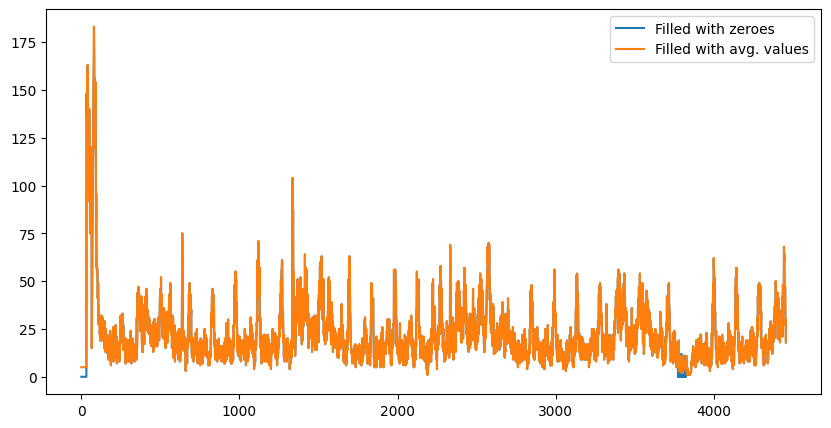

In [18]:
# Smoothing vs Filling
# Sample plot that shows two variations of filling missing values
# We have taken the #pickups for cluster region 2
plt.figure(figsize = (10,5))
plt.plot(jan_2015_fill[4464:8920], label="Filled with zeroes")
plt.plot(jan_2015_smooth[4464:8920], label="Filled with avg. values")
plt.legend()
plt.show()

Biểu đồ quan sát sự chênh lệch khi điền bằng 0 và giá trị trung bình

Phương pháp nào sẽ được sử dụng cho dữ liệu nào?
- Hãy xem xét chúng ta có dữ liệu của một số khoảng thời gian trong 1/1/2015, 10_ _ _ 20, tức là có 10 lần đón khách trong khoảng thời gian 10 phút đầu tiên, không có lần thu thập nào trong khoảng thời gian 10 phút thứ 2, 3 và có 20 lần thu thập trong khoảng thời gian 10 phút thứ 4.
- Trong phương pháp fill_missing, chúng ta thay thế các giá trị như sau: 10, 0, 0, 0, 20. Trong khi đó, trong phương pháp smoothing, chúng ta thay thế các giá trị như sau: 6, 6, 6, 6, 6.
- Nếu kiểm tra số lần thu thập trong 50 phút đầu tiên, ta sẽ thấy rằng chúng giống nhau trong cả hai trường hợp. Tuy nhiên, nếu quan sát kỹ hơn, ta đang xem xét các giá trị tương lai khi sử dụng phương pháp smoothing, tức là ta đang xem xét số lần thu thập trong tương lai, điều này có thể gây ra rò rỉ dữ liệu.
- Vì vậy, chúng ta sử dụng phương pháp smoothing cho dữ liệu 1/2015, vì nó đóng vai trò như dữ liệu huấn luyện và sử dụng phương pháp fill_missing đơn giản cho dữ liệu năm 2016

In [19]:
# Jan-2015 data is smoothed, Jan, Feb & Mar 2016 data missing values are filled with zeroes
jan_2015_smooth = smoothing(jan_2015_groupby['pickups'].values, jan_2015_unique)
jan_2016_smooth = fill_missing(jan_2016_groupby['pickups'].values, jan_2016_unique)
feb_2016_smooth = fill_missing(feb_2016_groupby['pickups'].values, feb_2016_unique)
mar_2016_smooth = fill_missing(mar_2016_groupby['pickups'].values, mar_2016_unique)

# Making list of all the values of pickup data in every bin for a period of 3 months,
# and storing them region-wise.
# regions_cum: It will contain 40 lists, each list will contain 4464 + 4176 + 4464 values,
# which represents the #pickups, that have happened for three months in 2016 data
regions_cum = []

# Number of 10-min indices for Jan 2015: 24*31*60/10 = 4464
# Number of 10-min indices for Jan 2016: 24*31*60/10 = 4464
# Number of 10-min indices for Feb 2016: 24*29*60/10 = 4176
# Number of 10-min indices for Mar 2016: 24*31*60/10 = 4464

for i in range(0, 40):
    regions_cum.append(jan_2016_smooth[4464*i:4464*(i+1)] + feb_2016_smooth[4176*i:4176*(i+1)] + \
        mar_2016_smooth[4464*i:4464*(i+1)])

print(len(regions_cum), len(regions_cum[0]))

40 13104


### 2.5.4. Time series and Fourier Transforms

Đồ thị cho 40 vùng khác nhau, mỗi vùng bao gồm các giá trị cho ba tháng đầu năm 2016, với mỗi đường đồ thị được tô một màu ngẫu nhiên duy nhất.



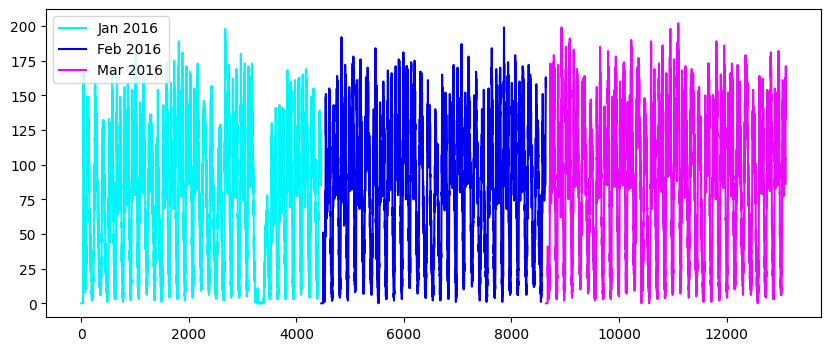

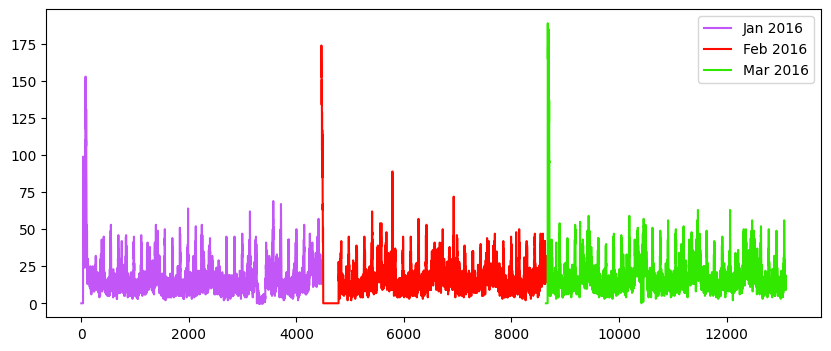

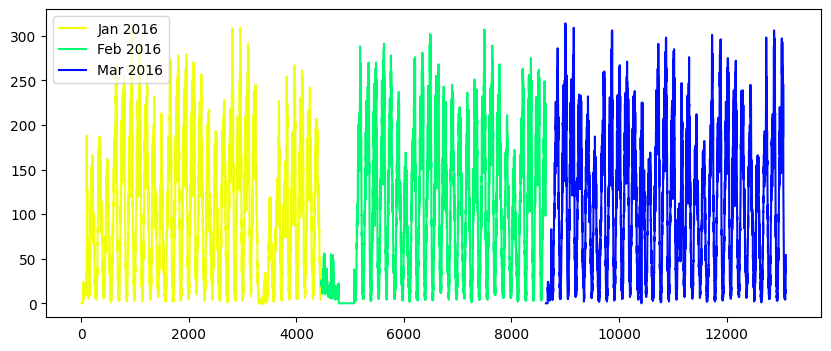

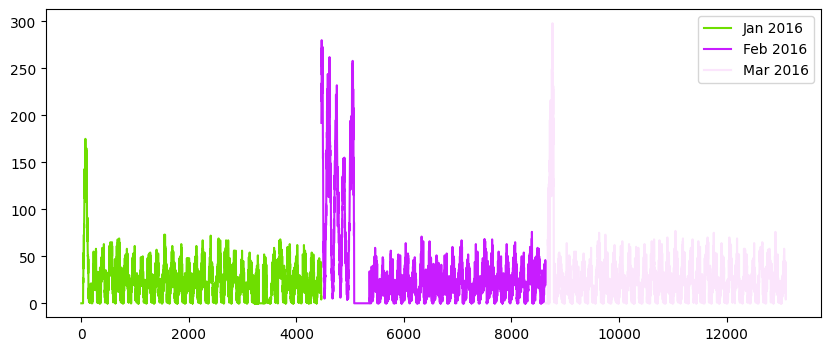

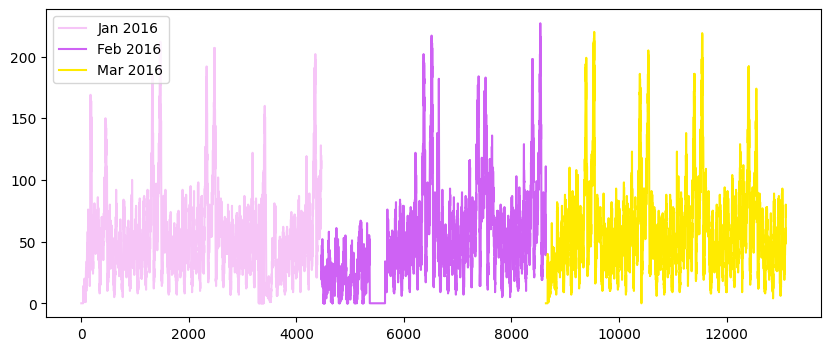

...

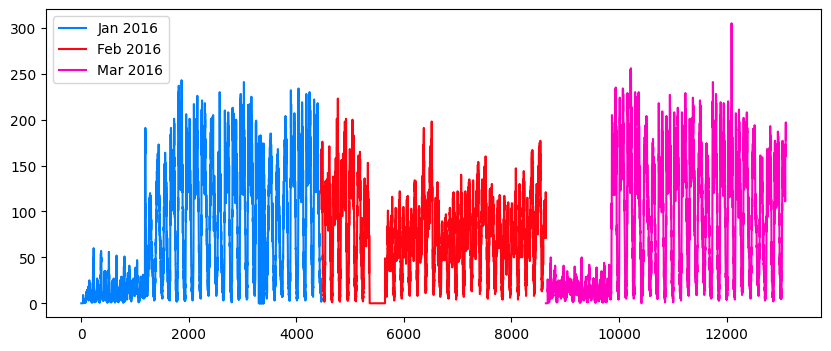

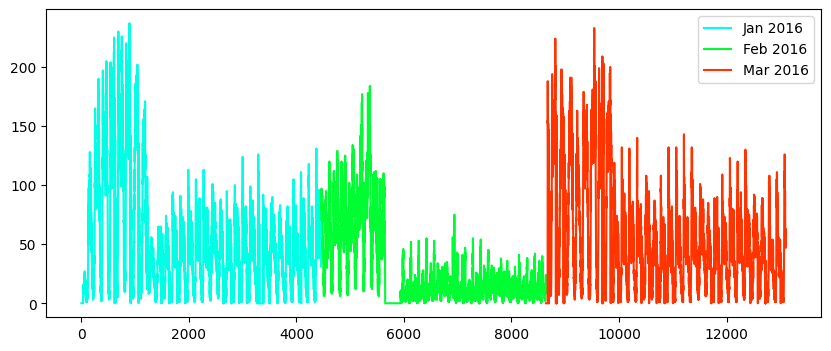

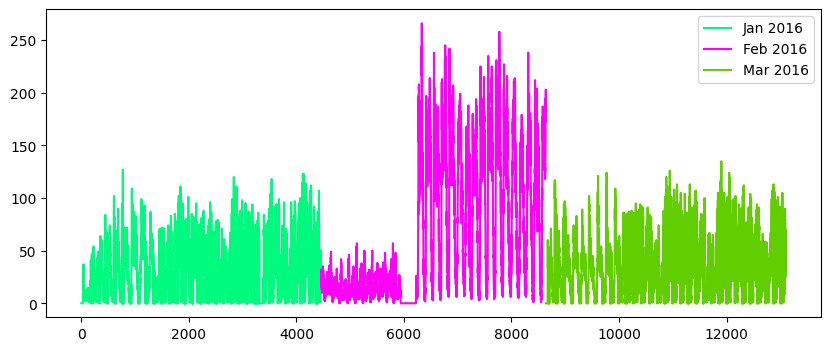

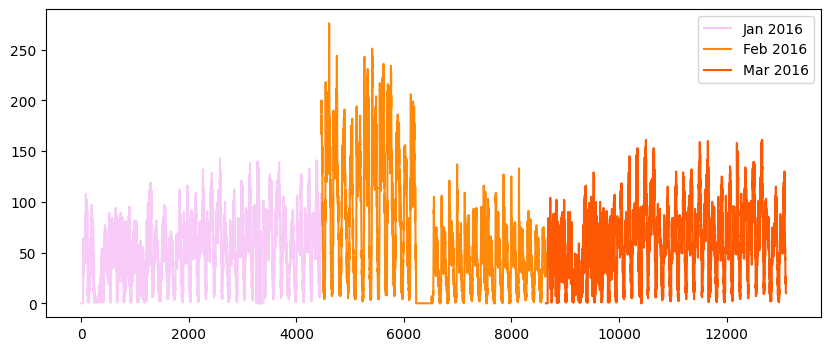

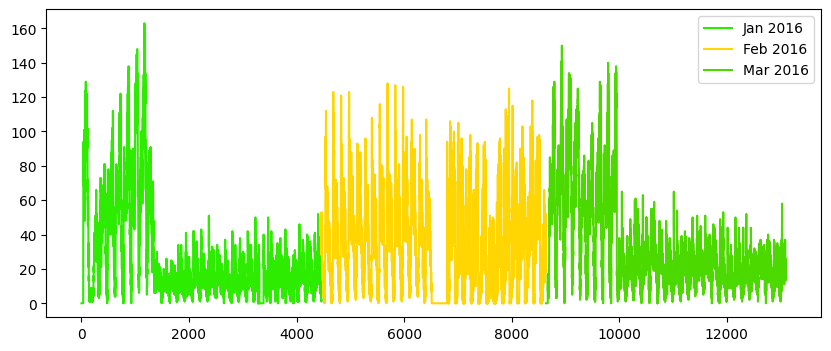

In [ ]:
# A function to generate unique colors
def uniqueish_color():
    return plt.cm.gist_ncar(np.random.random())

first_x = list(range(0,4464))
second_x = list(range(4464,8640))
third_x = list(range(8640,13104))

for i in range(40):
    plt.figure(figsize = (10,4))
    plt.plot(first_x,regions_cum[i][:4464], color = uniqueish_color(), label='Jan 2016')
    plt.plot(second_x,regions_cum[i][4464:8640], color = uniqueish_color(), label='Feb 2016')
    plt.plot(third_x,regions_cum[i][8640:], color = uniqueish_color(), label='Mar 2016')
    plt.legend()
    plt.show()

#### Visualizing Detection of Peaks
- Trực quan hóa việc phát hiện các điểm đỉnh cho cụm có chỉ số là 0, trong khoảng thời gian từ tháng 1 đến tháng 3 năm 2016.
- Các điểm đỉnh đã phát hiện cho thấy các khoảng thời gian mà chúng ta có số lượng (pickup) tối đa, và đồng thời, chúng cũng phát hiện số lượng ickup tối đa cho một cụm đã cho

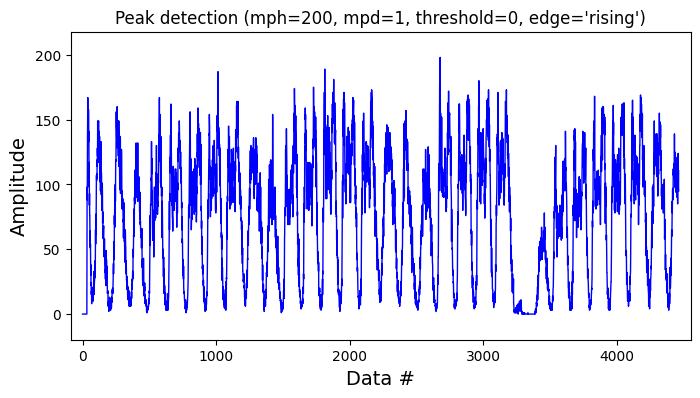

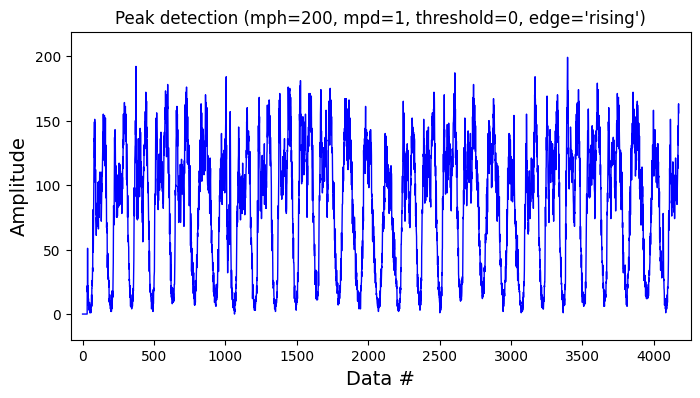

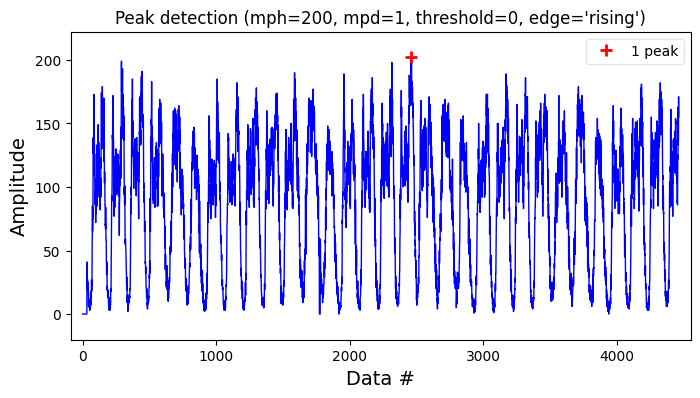

In [20]:
indexes_jan2016 = detect_peaks(regions_cum[0][:4464], mph = 200, show=True)
indexes_feb2016 = detect_peaks(regions_cum[0][4464:8640], mph = 200, show=True)
indexes_mar2016 = detect_peaks(regions_cum[0][8640:], mph = 200, show=True)

- Chúng ta sẽ sử dụng các hàm fft và fftfreq từ mô-đun numpy.fft. Sử dụng hàm fft, ta sẽ nhận được Biến Đổi Fourier Rời Rạc 1D (DFT) của dữ liệu chuỗi thời gian của chúng ta, và sử dụng hàm fftfreq, chúng ta sẽ nhận được các tần số lấy mẫu cho DFT.
  - Bây giờ, để tích hợp các đặc trưng dựa trên Biến Đổi Fourier, chúng ta sẽ thực hiện các bước sau:
  - Chúng ta sẽ xem xét dữ liệu theo từng tháng và theo cụm.
  - Đối với mỗi bộ dữ liệu như vậy, chúng ta sẽ tìm DFT và các tần số lấy mẫu của DFT.
  - Bây giờ, chúng ta sẽ thực hiện phát hiện đỉnh trên DFT, từ đó, chúng ta sẽ nhận được số #peaks và các chỉ số của các đỉnh. Làm ngưỡng, chúng ta sẽ sử dụng Minimum Peak Height (mph) là 1000.
  - Vì vậy, đặc trưng đầu tiên sẽ là số lượng các đỉnh như vậy.
  - Bây giờ, sử dụng các chỉ số của các đỉnh, chúng ta sẽ tìm các tần số lấy mẫu tương ứng, và chúng ta sẽ sử dụng các tần số lấy mẫu tương ứng với 3 đỉnh cao nhất làm 3 đặc trưng.
  - Nếu đối với một số bộ dữ liệu, chúng ta có ít hơn 3 đỉnh, thì chúng ta sẽ đơn giản đặt 0 cho những tần số đó.

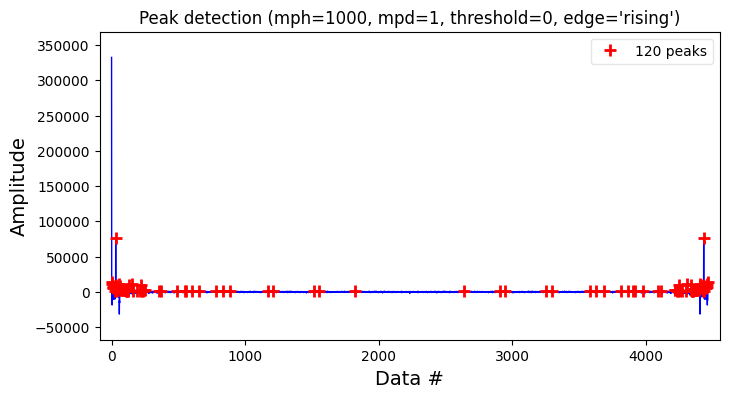

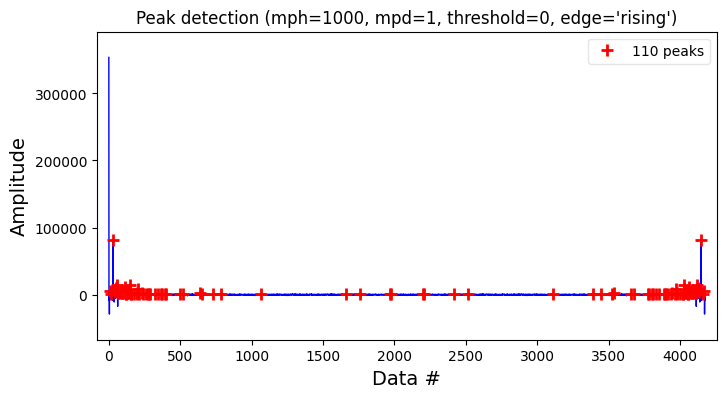

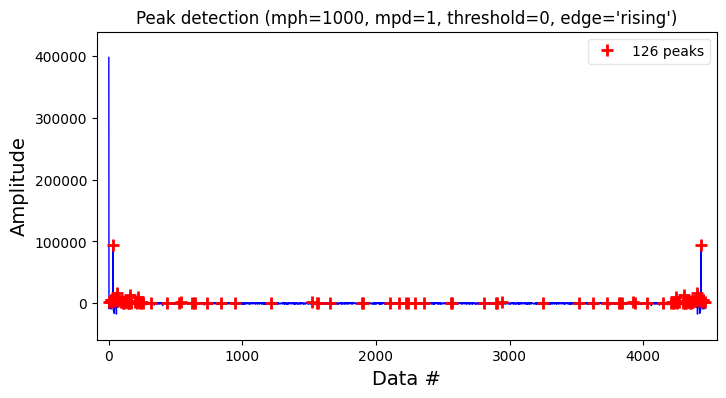

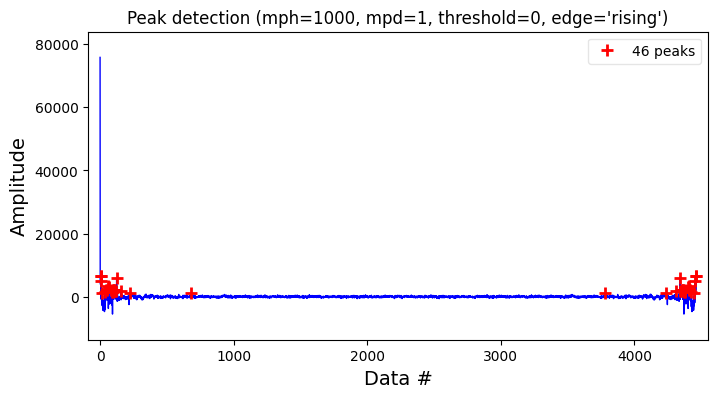

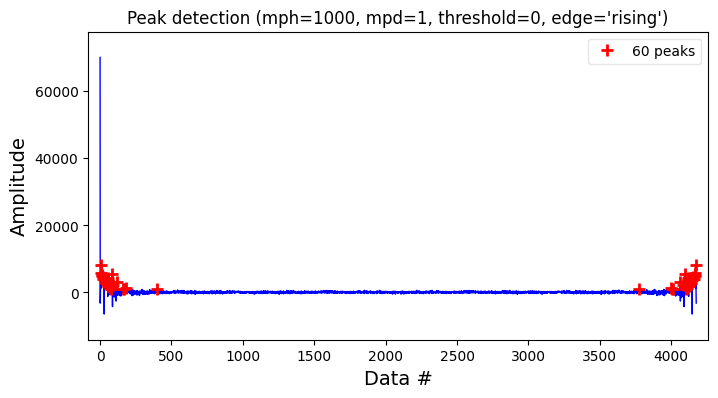

...

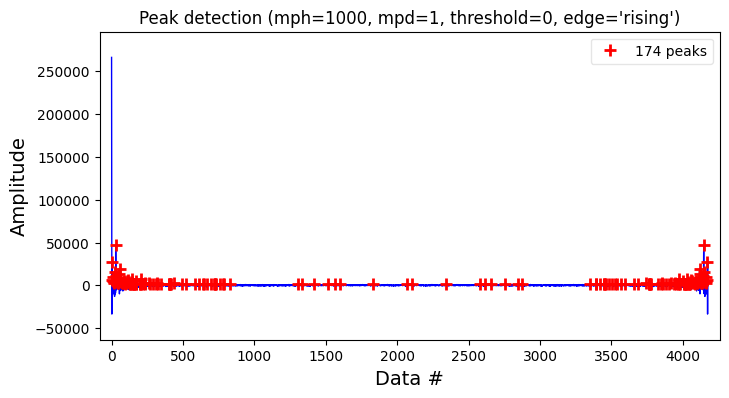

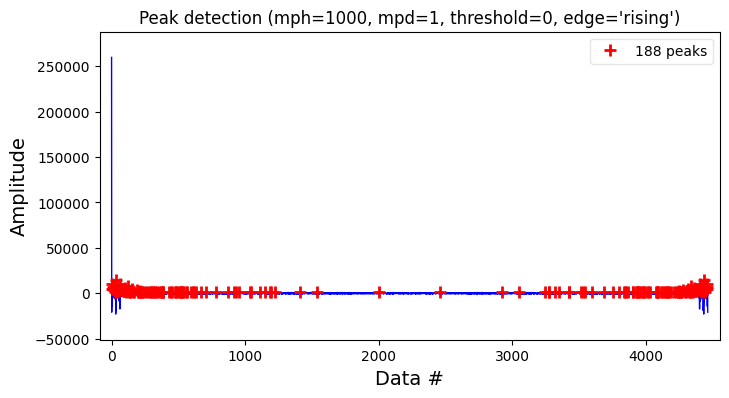

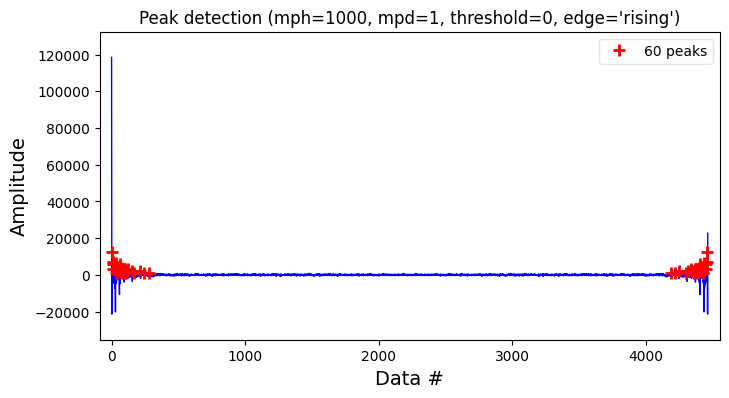

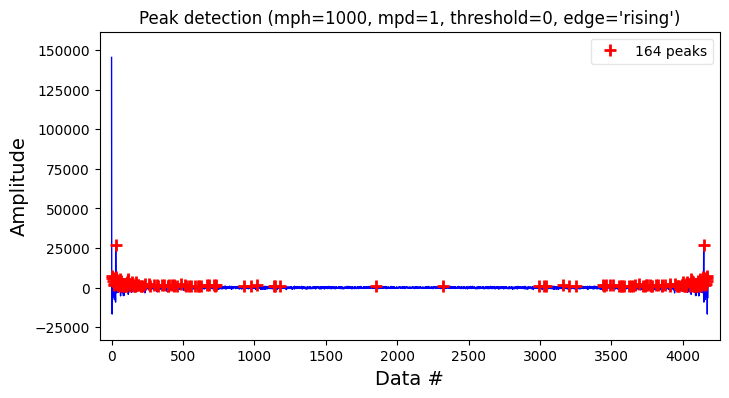

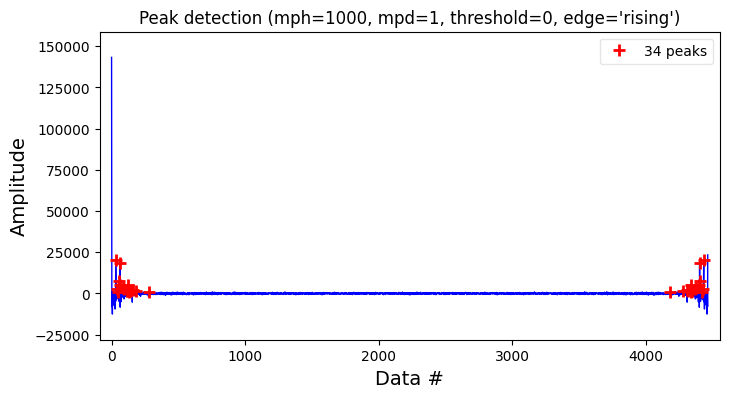

In [21]:
def extract_fft_features(cluster, month):

    # Creating an empty list for the 4 features
    features = []

    if month == 0:
        Y = np.fft.fft(regions_cum[cluster][0:4464])
        freq = np.fft.fftfreq(4464, 1)
    elif month == 1:
        Y = np.fft.fft(regions_cum[cluster][4464:8640])
        freq = np.fft.fftfreq(4176, 1)
    elif month == 2:
        Y = np.fft.fft(regions_cum[cluster][8640:])
        freq = np.fft.fftfreq(4464, 1)

    # `indexes` contains the indices of the peaks
    indexes = detect_peaks(Y, mph = 1000, show = True)

    # Number of peaks is the first feature
    features.append(len(indexes))

    if len(indexes) != 0:
        # Getting the Amplitude and Frequency of the Peaks using the `indexes`
        amp_peaks = np.abs(Y[indexes])
        freq_peaks = freq[indexes]

        # Getting the Indices which would sort the amp_peaks array
        # Since the Indices sort the array in the Increasing Order, hence reversing the array of indices
        sorted_ind = np.argsort(amp_peaks)
        sorted_ind = sorted_ind[ : :-1]

        # Contains the frequencies of the Highest Peaks in order
        high_peak_freq = np.take(freq_peaks, sorted_ind)

        for i in range(0, 6, 2):
            if i < len(high_peak_freq): features.append(np.abs(high_peak_freq[i]))
            else: features.append(0)

    else: features.extend([0, 0, 0])
    return features


# Creating an empty numpy array, sto store the FFT-based features
fft_feat = np.empty([40, 13104, 4])

for i in range(40):
    features = extract_fft_features(i, 0)
    fft_feat[i][:4464] = features
    features = extract_fft_features(i, 1)
    fft_feat[i][4464:8640] = features
    features = extract_fft_features(i, 2)
    fft_feat[i][8640:] = features

#### Observations:
- Tích hợp 4 đặc trưng trên vào tập dữ liệu và kiểm tra chúng với các mô hình Hồi quy tuyến tính, Rừng ngẫu nhiên và XgBoost Regression, nhưng chỉ số **MAPE** chỉ tăng lên (thấp hơn là tốt).

## 2.6. Modelling: Baseline Models
Bài toán: dự báo mật độ thu thập cho các tháng 1, 2 và 3 năm 2016, trong đó chúng ta sử dụng nhiều mô hình với hai biến thể:
1. Sử dụng Tỷ lệ của dữ liệu năm 2016 so với dữ liệu năm 2015 $\begin{align} R_{t} = P^{2016}_{t} / P^{2015}_{t} \end{align}$
2. Sử dụng các giá trị đã biết trước đó của chính dữ liệu năm 2016 để dự đoán các giá trị tương lai.

In [22]:
# Preparing the Dataframe only with x(i) values as Jan 2015 data and y(i) values as Jan 2016
ratios_jan = pd.DataFrame()
ratios_jan['Given'] = jan_2015_smooth
ratios_jan['Prediction'] = jan_2016_smooth
ratios_jan['Ratios'] = ratios_jan['Prediction']*1.0 / ratios_jan['Given']*1.0

### 2.6.1. Simple Moving Averages
- Mô hình đầu tiên mà chúng ta sử dụng là **Moving Averages Model** Mô hình Trung bình động, mô hình này sử dụng các giá trị trước đó 'n' để dự đoán giá trị tiếp theo.
- Sử dụng các giá trị tỷ lệ - $\begin{align}R_{t} = ( R_{t-1} + R_{t-2} + R_{t-3} .... R_{t-n} )/n \end{align}$
- Trong các ô mã dưới đây, **window-size** kích thước cửa sổ (n) là một siêu tham số (hyper-parameter), được điều chỉnh thủ công.
- Người ta thấy rằng kích thước cửa sổ là 3 là tối ưu để có được kết quả tốt nhất khi sử dụng Trung bình động với các giá trị tỷ lệ trước đó, do đó, chúng ta có - $\begin{align}R_{t} = ( R_{t-1} + R_{t-2} + R_{t-3})/3 \end{align}$

In [ ]:
ratios_jan

,Given,Prediction,Ratios
0,2,0,0.000000
1,2,0,0.000000
2,2,0,0.000000
3,2,0,0.000000
4,2,0,0.000000
...,...,...,...
178555,24,3,0.125000
178556,22,4,0.181818
178557,19,3,0.157895
178558,22,1,0.045455


In [ ]:
ratios_jan.to_csv('ratios_jan.csv', index=False)

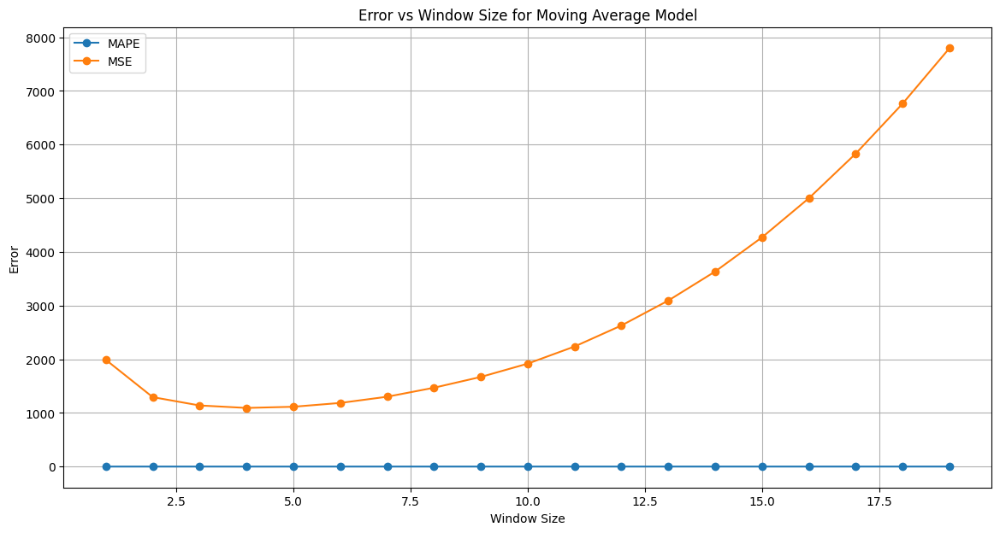

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def MA_R_Predictions_Plot(ratios, window_size):
    predicted_ratio = (ratios['Ratios'].values)[0]
    error, predicted_values, predicted_ratio_values = [], [], []
    for i in range(0, len(ratios)):
        if i % 4464 == 0:
            predicted_ratio_values.append(0)
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_val = int(((ratios['Given'].values)[i])*predicted_ratio)
        predicted_ratio_values.append(predicted_ratio)
        predicted_values.append(predicted_val)
        error.append( abs(predicted_val-(ratios['Prediction'].values)[i]) )
        if i+1 >= window_size:
            predicted_ratio = sum((ratios['Ratios'].values)[(i+1)-window_size:(i+1)]) / window_size
        else:
            predicted_ratio = sum((ratios['Ratios'].values)[0:(i+1)]) / (i+1)

    ratios['MA_R_Predicted'] = predicted_values
    ratios['MA_R_Error'] = error

    avg_pred_val = (sum(ratios['Prediction'].values) / len(ratios['Prediction'].values))
    mape_err = (1 / len(error)) * (sum(error) / avg_pred_val)
    mse_err = sum([e**2 for e in error]) / len(error)
    return mape_err, mse_err

# Danh sách các giá trị cửa sổ cần kiểm tra
window_sizes = list(range(1, 20))

# Lưu trữ lỗi cho mỗi giá trị cửa sổ
mape_errors = []
mse_errors = []

for ws in window_sizes:
    mape_err, mse_err = MA_R_Predictions_Plot(ratios_jan, ws)
    mape_errors.append(mape_err)
    mse_errors.append(mse_err)

# Vẽ biểu đồ lỗi theo kích thước cửa sổ
plt.figure(figsize=(14, 7))
plt.plot(window_sizes, mape_errors, marker='o', label='MAPE')
plt.plot(window_sizes, mse_errors, marker='o', label='MSE')
plt.xlabel('Window Size')
plt.ylabel('Error')
plt.title('Error vs Window Size for Moving Average Model')
plt.legend()
plt.grid(True)
plt.show()

In [23]:
def MA_R_Predictions(ratios):
    predicted_ratio = (ratios['Ratios'].values)[0]
    error, predicted_values, predicted_ratio_values = [], [], []
    window_size = 3
    for i in range(0, 4464*40):
        if i % 4464 == 0:
            predicted_ratio_values.append(0)
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_val = int(((ratios['Given'].values)[i])*predicted_ratio)
        predicted_ratio_values.append(predicted_ratio)
        predicted_values.append(predicted_val)
        error.append( abs(predicted_val-(ratios['Prediction'].values)[i]) )
        if i+1 >= window_size:
            predicted_ratio = sum((ratios['Ratios'].values)[(i+1)-window_size:(i+1)]) / window_size
        else:
            predicted_ratio = sum((ratios['Ratios'].values)[0:(i+1)]) / (i+1)

    ratios['MA_R_Predicted'] = predicted_values
    ratios['MA_R_Error'] = errora

    avg_pred_val = (sum(ratios['Prediction'].values) / len(ratios['Prediction'].values))
    mape_err = (1 / len(error)) * (sum(error) / avg_pred_val)
    mse_err = sum([e**2 for e in error]) / len(error)
    return ratios, mape_err, mse_err

- Tiếp theo ta sử dụng Moving averages trên giá trị 2016 để dự đoán giá trị tương lai bằng sử dụng $\begin{align}P_{t} = ( P_{t-1} + P_{t-2} + P_{t-3} .... P_{t-n} )/n \end{align}$
- Window-size (n) là hyper-parameter tự điều chỉnh
- Window-size = 1 là tối ưu để đạt được kết quả tốt nhất khi sử dụng trong Moving Averages $\begin{align}P_{t} = P_{t-1} \end{align}$

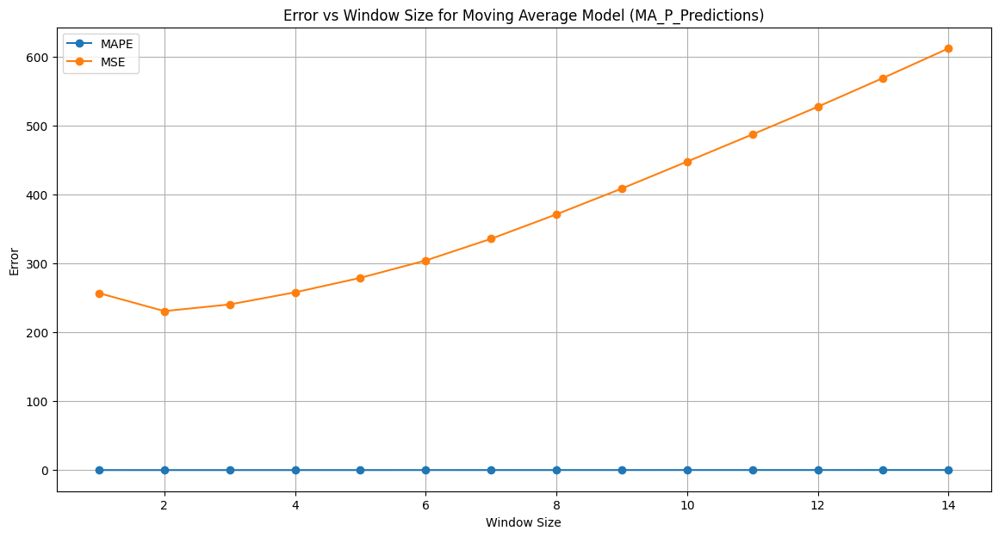

In [ ]:
def MA_P_Predictions_Plot(ratios, window_size):
    predicted_value = (ratios['Prediction'].values)[0]
    error, predicted_values = [], []
    for i in range(0, 4464*40):
        predicted_values.append(predicted_value)
        error.append(abs(predicted_value-(ratios['Prediction'].values)[i]))
        if i+1 >= window_size:
            predicted_value = int(sum((ratios['Prediction'].values)[(i+1)-window_size:(i+1)]) / window_size)
        else:
            predicted_value = int(sum((ratios['Prediction'].values)[0:(i+1)]) / (i+1))

    ratios['MA_P_Predicted'] = predicted_values
    ratios['MA_P_Error'] = error

    avg_pred_val = (sum(ratios['Prediction'].values) / len(ratios['Prediction'].values))
    mape_err = (1 / len(error)) * (sum(error) / avg_pred_val)
    mse_err = sum([e**2 for e in error]) / len(error)
    return ratios, mape_err, mse_err

# Danh sách các giá trị cửa sổ cần kiểm tra
window_sizes = list(range(1, 15))

# Lưu trữ lỗi cho mỗi giá trị cửa sổ
mape_errors = []
mse_errors = []

for ws in window_sizes:
    _, mape_err, mse_err = MA_P_Predictions_Plot(ratios_jan, ws)
    mape_errors.append(mape_err)
    mse_errors.append(mse_err)

# Vẽ biểu đồ lỗi theo kích thước cửa sổ
plt.figure(figsize=(14, 7))
plt.plot(window_sizes, mape_errors, marker='o', label='MAPE')
plt.plot(window_sizes, mse_errors, marker='o', label='MSE')
plt.xlabel('Window Size')
plt.ylabel('Error')
plt.title('Error vs Window Size for Moving Average Model (MA_P_Predictions)')
plt.legend()
plt.grid(True)
plt.show()

In [24]:
def MA_P_Predictions(ratios):
    predicted_value = (ratios['Prediction'].values)[0]
    error, predicted_values = [], []
    window_size = 2
    for i in range(0, 4464*40):
        predicted_values.append(predicted_value)
        error.append(abs(predicted_value-(ratios['Prediction'].values)[i]))
        if i+1 >= window_size:
            predicted_value = int(sum((ratios['Prediction'].values)[(i+1)-window_size:(i+1)]) / window_size)
        else:
            predicted_value = int(sum((ratios['Prediction'].values)[0:(i+1)]) / (i+1))

    ratios['MA_P_Predicted'] = predicted_values
    ratios['MA_P_Error'] = error

    avg_pred_val = (sum(ratios['Prediction'].values) / len(ratios['Prediction'].values))
    mape_err = (1 / len(error)) * (sum(error) / avg_pred_val)
    mse_err = sum([e**2 for e in error]) / len(error)
    return ratios, mape_err, mse_err

### 2.6.2 Weighted Moving Averages
- Mô hình sử dụng ở trên đã gán trọng số bằng nhau cho tất cả các giá trị trong cửa sổ sử dụng, ta biết giá trị trong tương lai có khả năng tương tự với các giá trị gần đó hơn với các giá trị cũ hơn.
- Moving Avergaes Model chuyển đổi vấn đề này thành một mối quan hệ toán học, đặt trọng số cao nhất khi tính trung bình cho giá trị gần đây nhất và giảm trọng số cho các giá trị cũ hơn sau đó. Trong trường hợp sử dụng giá trị tỷ lệ trước đó.
- Trung bình động có trọng số sử dụng các giá trị tỷ lệ như sau:
$\begin{align}R_{t} = ( N*R_{t-1} + (N-1)*R_{t-2} + (N-2)*R_{t-3} .... 1*R_{t-n} )/(N*(N+1)/2) \end{align}$

- Trong các ô mã dưới đây, kích thước cửa sổ (n) là một siêu tham số, được điều chỉnh thủ công. Window-size = 5 là tối ưu để đạt được kết quả tốt nhất khi sử dụng Weighted Moving Averages with previous Ratio values, chúng ta có:
$\begin{align} R_{t} = ( 5*R_{t-1} + 4*R_{t-2} + 3*R_{t-3} + 2*R_{t-4} + R_{t-5} )/15 \end{align}$

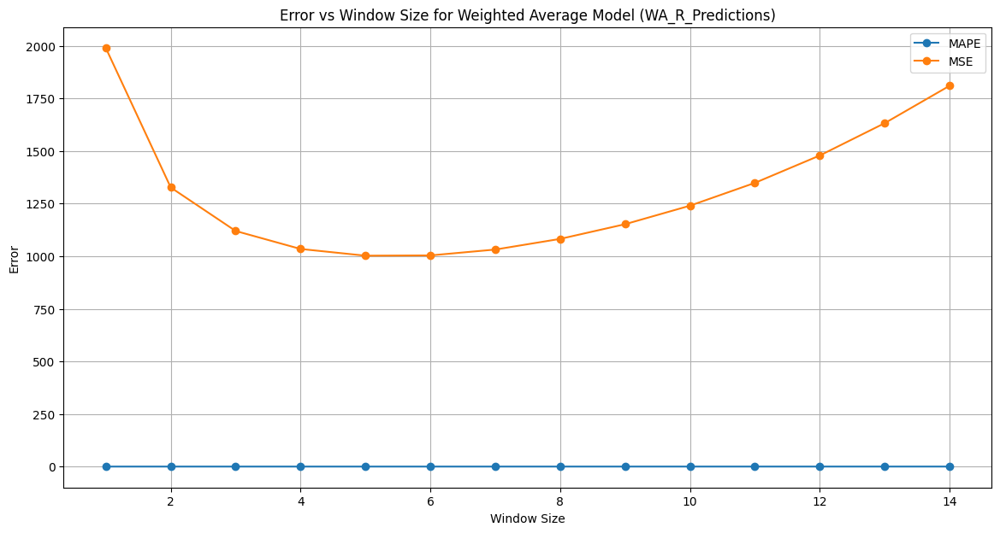

In [ ]:
def WA_R_Predictions_Plot(ratios, window_size):
    predicted_ratio = (ratios['Ratios'].values)[0]
    alpha = 0.5
    error, predicted_values, predicted_ratio_values = [], [], []
    for i in range(0, 4464*40):
        if i % 4464 == 0:
            predicted_ratio_values.append(0)
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_val = int(((ratios['Given'].values)[i]) * predicted_ratio)
        predicted_ratio_values.append(predicted_ratio)
        predicted_values.append(predicted_val)
        error.append(abs(predicted_val - (ratios['Prediction'].values)[i]))

        sum_values = 0
        sum_of_coeff = 0
        if i + 1 >= window_size:
            for j in range(window_size, 0, -1):
                sum_values += j * (ratios['Ratios'].values)[i - window_size + j]
                sum_of_coeff += j
        else:
            for j in range(i + 1, 0, -1):
                sum_values += j * (ratios['Ratios'].values)[j - 1]
                sum_of_coeff += j

        predicted_ratio = sum_values / sum_of_coeff

    ratios['WA_R_Predicted'] = predicted_values
    ratios['WA_R_Error'] = error
    avg_pred_val = (sum(ratios['Prediction'].values) / len(ratios['Prediction'].values))
    mape_err = (1 / len(error)) * (sum(error) / avg_pred_val)
    mse_err = sum([e**2 for e in error]) / len(error)
    return ratios, mape_err, mse_err

# Danh sách các giá trị cửa sổ cần kiểm tra
window_sizes = list(range(1, 15))

# Lưu trữ lỗi cho mỗi giá trị cửa sổ
mape_errors = []
mse_errors = []

for ws in window_sizes:
    _, mape_err, mse_err = WA_R_Predictions_Plot(ratios_jan, ws)
    mape_errors.append(mape_err)
    mse_errors.append(mse_err)

# Vẽ biểu đồ lỗi theo kích thước cửa sổ
plt.figure(figsize=(14, 7))
plt.plot(window_sizes, mape_errors, marker='o', label='MAPE')
plt.plot(window_sizes, mse_errors, marker='o', label='MSE')
plt.xlabel('Window Size')
plt.ylabel('Error')
plt.title('Error vs Window Size for Weighted Average Model (WA_R_Predictions)')
plt.legend()
plt.grid(True)
plt.show()

In [26]:
def WA_R_Predictions(ratios):
    predicted_ratio=(ratios['Ratios'].values)[0]
    alpha, window_size = 0.5, 5
    error, predicted_values, predicted_ratio_values = [], [], []
    for i in range(0, 4464*40):
        if i%4464 == 0:
            predicted_ratio_values.append(0)
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_val = int(((ratios['Given'].values)[i])*predicted_ratio)
        predicted_ratio_values.append(predicted_ratio)
        predicted_values.append(predicted_val)
        error.append( abs(predicted_val-(ratios['Prediction'].values)[i]) )

        sum_values = 0
        sum_of_coeff = 0
        if i+1 >= window_size:
            for j in range(window_size, 0, -1):
                sum_values += j*(ratios['Ratios'].values)[i-window_size+j]
                sum_of_coeff += j
        else:
            for j in range(i+1, 0, -1):
                sum_values += j*(ratios['Ratios'].values)[j-1]
                sum_of_coeff += j

        predicted_ratio = sum_values / sum_of_coeff

    ratios['WA_R_Predicted'] = predicted_values
    ratios['WA_R_Error'] = error
    avg_pred_val = (sum(ratios['Prediction'].values) / len(ratios['Prediction'].values))
    mape_err = (1 / len(error)) * (sum(error) / avg_pred_val)
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios, mape_err, mse_err

- Weighted Moving Averages sử dụng giá trị trước dự đoán giá trị sau  2016: $\begin{align}P_{t} = ( N*P_{t-1} + (N-1)*P_{t-2} + (N-2)*P_{t-3} .... 1*P_{t-n} )/(N*(N+1)/2) \end{align}$
- window-size = 2 là tối ưu để đạt được kết quả tốt nhất khi sử dụng Weighted Moving Averages $\begin{align} P_{t} = ( 2*P_{t-1} + P_{t-2} )/3 \end{align}$

In [ ]:
def WA_P_Predictions_Plot(ratios, window_size):
    predicted_value = (ratios['Prediction'].values)[0]
    error, predicted_values = [], []

    for i in range(0, 4464*40):
        predicted_values.append(predicted_value)
        error.append(abs(predicted_value - (ratios['Prediction'].values)[i]))

        sum_values = 0
        sum_of_coeff = 0
        if i + 1 >= window_size:
            for j in range(window_size, 0, -1):
                sum_values += j * (ratios['Prediction'].values)[i - window_size + j]
                sum_of_coeff += j
        else:
            for j in range(i + 1, 0, -1):
                sum_values += j * (ratios['Prediction'].values)[j - 1]
                sum_of_coeff += j

        predicted_value = int(sum_values / sum_of_coeff)

    ratios['WA_P_Predicted'] = predicted_values
    ratios['WA_P_Error'] = error
    avg_pred_val = (sum(ratios['Prediction'].values) / len(ratios['Prediction'].values))
    mape_err = (1 / len(error)) * (sum(error) / avg_pred_val)
    mse_err = sum([e**2 for e in error]) / len(error)
    return ratios, mape_err, mse_err

# Danh sách các giá trị cửa sổ cần kiểm tra
window_sizes = list(range(1, 15))

# Lưu trữ lỗi cho mỗi giá trị cửa sổ
mape_errors = []
mse_errors = []

for ws in window_sizes:
    _, mape_err, mse_err = WA_P_Predictions_Plot(ratios_jan, ws)
    mape_errors.append(mape_err)
    mse_errors.append(mse_err)

# Vẽ biểu đồ lỗi theo kích thước cửa sổ
plt.figure(figsize=(14, 7))
plt.plot(window_sizes, mape_errors, marker='o', label='MAPE')
plt.plot(window_sizes, mse_errors, marker='o', label='MSE')
plt.xlabel('Window Size')
plt.ylabel('Error')
plt.title('Error vs Window Size for Weighted Average Model (WA_P_Predictions)')
plt.legend()
plt.grid(True)
plt.show()

In [27]:
def WA_P_Predictions(ratios):
    predicted_value=(ratios['Prediction'].values)[0]
    error, predicted_values = [], []
    window_size = 2
    for i in range(0, 4464*40):
        predicted_values.append(predicted_value)
        error.append(abs(predicted_value-(ratios['Prediction'].values)[i]))

        sum_values = 0
        sum_of_coeff = 0
        if i+1 >= window_size:
            for j in range(window_size, 0, -1):
                sum_values += j*(ratios['Prediction'].values)[i-window_size+j]
                sum_of_coeff += j

        else:
            for j in range(i+1,0,-1):
                sum_values += j*(ratios['Prediction'].values)[j-1]
                sum_of_coeff+=j

        predicted_value = int(sum_values / sum_of_coeff)

    ratios['WA_P_Predicted'] = predicted_values
    ratios['WA_P_Error'] = error
    avg_pred_val = (sum(ratios['Prediction'].values) / len(ratios['Prediction'].values))
    mape_err = (1 / len(error)) * (sum(error) / avg_pred_val)
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios, mape_err, mse_err

### 2.6.3. Exponential  Weighted Moving Averages
- Thông qua việc tính trung bình có trọng số, chúng ta đã thỏa mãn phép so sánh bằng cách đặt trọng số cao hơn cho giá trị mới nhất và giảm dần trọng số cho các giá trị tiếp theo, nhưng chúng ta vẫn chưa biết đâu là phương pháp gán trọng số chính xác vì có vô số khả năng mà chúng ta có thể gán trọng số theo thứ tự không tăng và điều chỉnh siêu tham số kích thước cửa sổ.
- Để đơn giản hóa quá trình này, chúng ta sử dụng **Exponential Moving Averages** (Trung bình động có trọng số mũ), đây là cách hợp lý hơn trong việc gán trọng số và đồng thời, cũng sử dụng kích thước cửa sổ tối ưu.
- Trong exponential moving averages (trung bình động có trọng số mũ), chúng ta sử dụng một siêu tham số duy nhất là alpha (α), có giá trị nằm giữa 0 và 1 và dựa trên giá trị của siêu tham số alpha để cấu hình trọng số và kích thước cửa sổ.
- Ví dụ, nếu $\begin{align}\alpha=0.9\end{align}$ thì số ngày mà giá trị của lần lặp hiện tại dựa trên là khoảng $\begin{align}1/(1-\alpha)=10\end{align}$
, tức là chúng ta xem xét giá trị của 10 ngày trước khi dự đoán giá trị cho lần lặp hiện tại.
Ngoài ra, trọng số được gán sử dụng $\begin{align}2/(N+1)=0.18\end{align}$
, ở đây N là số lượng giá trị trước đó được xem xét, do đó từ đây có thể suy ra rằng giá trị đầu tiên hoặc mới nhất được gán trọng số là 0.18, trọng số này sẽ giảm mũ cho các giá trị tiếp theo.
Công thức tính là: $\begin{align}R^{'}_{t} = \alpha*R_{t-1} + (1-\alpha)*R^{'}_{t-1}  \end{align}$

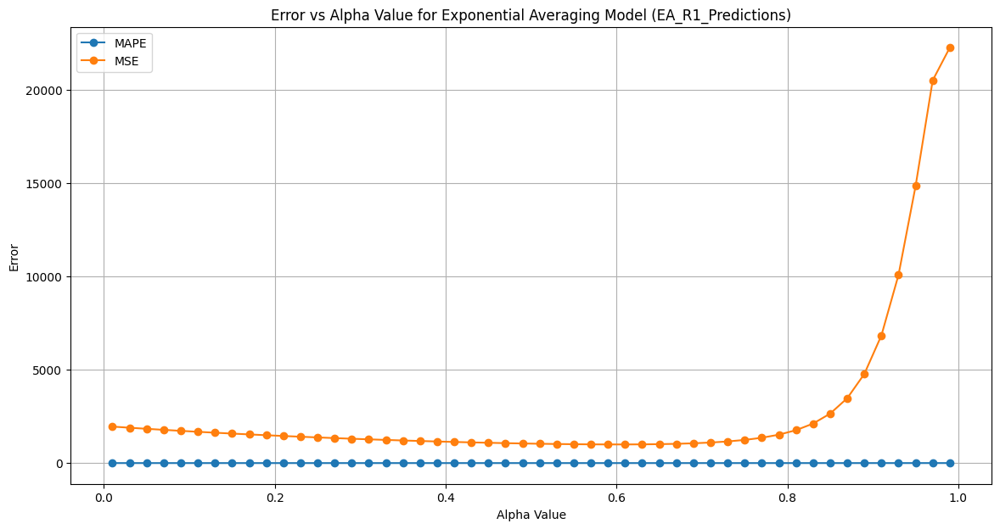

In [ ]:
def EA_R1_Predictions_Plot(ratios, alpha):
    predicted_ratio = (ratios['Ratios'].values)[0]
    error, predicted_values, predicted_ratio_values = [], [], []

    for i in range(0, 4464*40):
        if i % 4464 == 0:
            predicted_ratio_values.append(0)
            predicted_values.append(0)
            error.append(0)
            continue

        predicted_val = int(((ratios['Given'].values)[i]) * predicted_ratio)
        predicted_ratio_values.append(predicted_ratio)
        predicted_values.append(predicted_val)
        error.append(abs((predicted_val - (ratios['Prediction'].values)[i])))
        predicted_ratio = (alpha * predicted_ratio) + (1 - alpha) * ((ratios['Ratios'].values)[i])

    ratios['EA_R1_Predicted'] = predicted_values
    ratios['EA_R1_Error'] = error
    avg_pred_val = (sum(ratios['Prediction'].values) / len(ratios['Prediction'].values))
    mape_err = (1 / len(error)) * (sum(error) / avg_pred_val)
    mse_err = sum([e**2 for e in error]) / len(error)
    return ratios, mape_err, mse_err

# Danh sách các giá trị alpha cần kiểm tra
alpha_values = np.linspace(0.01, 0.99, 50)

# Lưu trữ lỗi cho mỗi giá trị alpha
mape_errors = []
mse_errors = []

for alpha in alpha_values:
    _, mape_err, mse_err = EA_R1_Predictions_Plot(ratios_jan, alpha)
    mape_errors.append(mape_err)
    mse_errors.append(mse_err)

# Vẽ biểu đồ lỗi theo giá trị alpha
plt.figure(figsize=(14, 7))
plt.plot(alpha_values, mape_errors, marker='o', label='MAPE')
plt.plot(alpha_values, mse_errors, marker='o', label='MSE')
plt.xlabel('Alpha Value')
plt.ylabel('Error')
plt.title('Error vs Alpha Value for Exponential Averaging Model (EA_R1_Predictions)')
plt.legend()
plt.grid(True)
plt.show()

In [28]:
def EA_R1_Predictions(ratios):
    predicted_ratio=(ratios['Ratios'].values)[0]
    alpha = 0.6
    error, predicted_values, predicted_ratio_values = [], [], []
    for i in range(0, 4464*40):
        if i % 4464 == 0:
            predicted_ratio_values.append(0)
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_val = int(((ratios['Given'].values)[i])*predicted_ratio)
        predicted_ratio_values.append(predicted_ratio)
        predicted_values.append(predicted_val)
        error.append(abs((predicted_val - (ratios['Prediction'].values)[i])))
        predicted_ratio = (alpha*predicted_ratio) + (1-alpha)*((ratios['Ratios'].values)[i])

    ratios['EA_R1_Predicted'] = predicted_values
    ratios['EA_R1_Error'] = error
    avg_pred_val = (sum(ratios['Prediction'].values) / len(ratios['Prediction'].values))
    mape_err = (1 / len(error)) * (sum(error) / avg_pred_val)
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios, mape_err, mse_err

- Exponential Weighted Moving Averages sử dụng cho Previous 2016 Values:
$\begin{align}P^{'}_{t} = \alpha*P_{t-1} + (1-\alpha)*P^{'}_{t-1}  \end{align}$

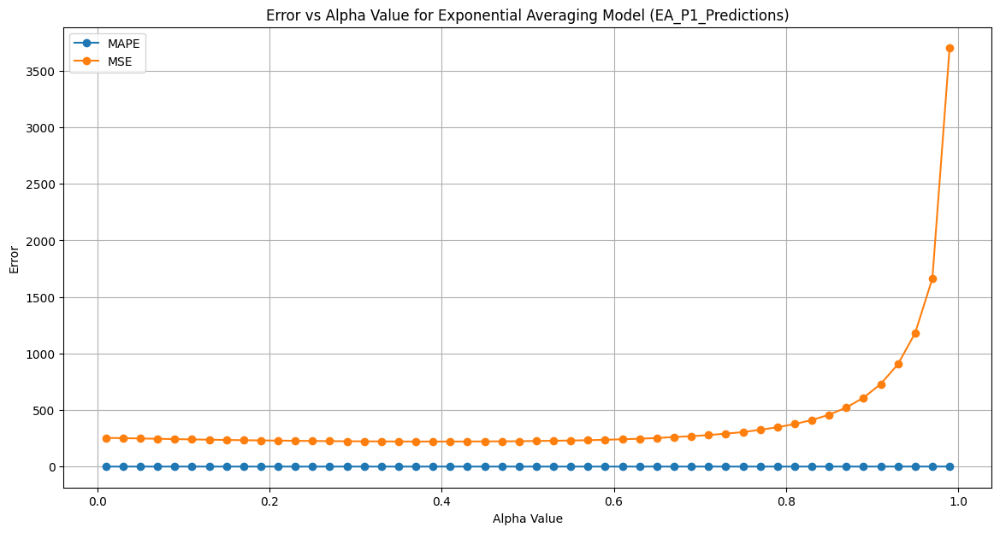

In [ ]:
def EA_P1_Predictions_Plot(ratios, alpha):
    predicted_value = (ratios['Prediction'].values)[0]
    error, predicted_values = [], []
    for i in range(0, 4464*40):
        if i % 4464 == 0:
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_values.append(predicted_value)
        error.append(abs((predicted_value - (ratios['Prediction'].values)[i])))
        predicted_value = int((alpha * predicted_value) + (1 - alpha) * ((ratios['Prediction'].values)[i]))

    ratios['EA_P1_Predicted'] = predicted_values
    ratios['EA_P1_Error'] = error
    avg_pred_val = (sum(ratios['Prediction'].values) / len(ratios['Prediction'].values))
    mape_err = (1 / len(error)) * (sum(error) / avg_pred_val)
    mse_err = sum([e**2 for e in error]) / len(error)
    return ratios, mape_err, mse_err

# Danh sách các giá trị alpha cần kiểm tra
alpha_values = np.linspace(0.01, 0.99, 50)

# Lưu trữ lỗi cho mỗi giá trị alpha
mape_errors = []
mse_errors = []

for alpha in alpha_values:
    _, mape_err, mse_err = EA_P1_Predictions_Plot(ratios_jan, alpha)
    mape_errors.append(mape_err)
    mse_errors.append(mse_err)

# Vẽ biểu đồ lỗi theo giá trị alpha
plt.figure(figsize=(14, 7))
plt.plot(alpha_values, mape_errors, marker='o', label='MAPE')
plt.plot(alpha_values, mse_errors, marker='o', label='MSE')
plt.xlabel('Alpha Value')
plt.ylabel('Error')
plt.title('Error vs Alpha Value for Exponential Averaging Model (EA_P1_Predictions)')
plt.legend()
plt.grid(True)
plt.show()

In [29]:
def EA_P1_Predictions(ratios):
    predicted_value= (ratios['Prediction'].values)[0]
    alpha = 0.3
    error, predicted_values = [], []
    for i in range(0, 4464*40):
        if i % 4464 == 0:
            predicted_values.append(0)
            error.append(0)
            continue
        predicted_values.append(predicted_value)
        error.append(abs((predicted_value-(ratios['Prediction'].values)[i])))
        predicted_value =int((alpha*predicted_value) + (1-alpha)*((ratios['Prediction'].values)[i]))

    ratios['EA_P1_Predicted'] = predicted_values
    ratios['EA_P1_Error'] = error
    avg_pred_val = (sum(ratios['Prediction'].values) / len(ratios['Prediction'].values))
    mape_err = (1 / len(error)) * (sum(error) / avg_pred_val)
    mse_err = sum([e**2 for e in error])/len(error)
    return ratios, mape_err, mse_err

In [30]:
mape_err = [0]*10
mse_err = [0]*10
ratios_jan, mape_err[0], mse_err[0] = MA_R_Predictions(ratios_jan)
ratios_jan, mape_err[1], mse_err[1] = MA_P_Predictions(ratios_jan)
ratios_jan, mape_err[2], mse_err[2] = WA_R_Predictions(ratios_jan)
ratios_jan, mape_err[3], mse_err[3] = WA_P_Predictions(ratios_jan)
ratios_jan, mape_err[4], mse_err[4] = EA_R1_Predictions(ratios_jan)
ratios_jan, mape_err[5], mse_err[5] = EA_P1_Predictions(ratios_jan)

### 2.6.4. Comparison between Baseline Models
- Độ đo được chọn chọn <b>MAPE (Lỗi Phần Trăm Tuyệt Đối Trung Bình)</b> làm chỉ số lỗi để so sánh giữa các mô hình, nhằm biết được mức độ chính xác trung bình của mô hình dự đoán của chúng tôi ra sao.
- <b>MSE (Lỗi Bình Phương Trung Bình)</b> cũng được sử dụng, để chúng tôi hiểu rõ hơn về hiệu suất của mô hình dự báo với các ngoại lệ, và nó giúp chúng tôi đảm bảo rằng không có nhiều sai số giữa giá trị dự đoán và giá trị thực tế.

In [31]:
x = PrettyTable()

x.field_names = ["Baseline Model", "MAPE", "MSE"]
x.add_rows([
    ["Simple Moving Averages (Ratios)", mape_err[0], mse_err[0]],
    ["Simple Moving Averages (2016 Values)", mape_err[1], mse_err[1]],
    ["Weighted Moving Averages (Ratios)", mape_err[2], mse_err[2]],
    ["Weighted Moving Averages (2016 Values)", mape_err[3], mse_err[3]],
    ["Exponential Weighted Moving Averages (Ratios)", mape_err[4], mse_err[4]],
    ["Exponential Weighted Moving Averages (2016 Values)", mape_err[5], mse_err[5]]
])

print ("Error Metric Matrix (Forecasting Methods) - MAPE & MSE")
print(x)

Error Metric Matrix (Forecasting Methods) - MAPE & MSE
+----------------------------------------------------+---------------------+--------------------+
|                   Baseline Model                   |         MAPE        |        MSE         |
+----------------------------------------------------+---------------------+--------------------+
|          Simple Moving Averages (Ratios)           | 0.23551136892314542 | 1138.9365423387096 |
|        Simple Moving Averages (2016 Values)        | 0.15288285753070066 | 230.9719254032258  |
|         Weighted Moving Averages (Ratios)          |  0.2346490985694606 | 1002.4054267473118 |
|       Weighted Moving Averages (2016 Values)       | 0.15055421746839956 | 225.44119623655914 |
|   Exponential Weighted Moving Averages (Ratios)    | 0.23495639101693397 | 998.8283490143369  |
| Exponential Weighted Moving Averages (2016 Values) | 0.15011099085802607 | 223.68617831541218 |
+----------------------------------------------------+---------

- **Note**: So sánh giữa Jan 2015 and Jan 2016 data
- Từ kết quả trên ta có thể nhận định được mô hình dự báo tốt nhất là
$\begin{align}P^{'}_{t} = \alpha*P_{t-1} + (1-\alpha)*P^{'}_{t-1}  \end{align}$ i.e **Exponential Weighted Moving Averages using 2016 Values**.

## 2.7 Regression Models


### 2.7.1. Preparing Data & Performing Train-Test Split

#### 2.7.1.1. Preparing Data

In [138]:
# Number of 10-min indices for Jan 2016: 24*31*60/10 = 4464
# Number of 10-min indices for Feb 2016: 24*29*60/10 = 4176
# Number of 10-min indices for Mar 2016: 24*31*60/10 = 4464
# regions_cum: It will contain 40 lists, each list will contain (4464+4176+4464) = 13104 values
# which represents the #pickups that have happened for three months in 2016.

# Since, we are considering the #pickups for the last 5 time-bins, hence, we are omitting the
# first 5 time bins from our dataframe, and therefore, our prediction starts from 5th 10-min interval
regions_cum_fft = regions_cum

# We take #pickups that have happened in last 5 10-min intervals
number_of_time_stamps = 5

# It is a list of lists
# It will contain 13099 #pickups for each cluster
output = []
output_fft = []
# It is a list of lists
# tsne_lat will contain 13099 times latitude of cluster center for every cluster
# Ex: [[cent_lat 13099times], [cent_lat 13099times], [cent_lat 13099times] .... 40 lists]
# It is a list of lists
tsne_lat = []
tsne_lat_fft = []

# tsne_lon will contain 13099 times longitude of cluster center for every cluster
# Ex: [[cent_long 13099times], [cent_long 13099times], [cent_long 13099times] .... 40 lists]
# It is a list of lists
tsne_lon = []
tsne_lon_fft = []
# We will code each day as below
# Sun = 0, Mon = 1, Tue = 2, Wed = 3, Thu = 4, Fri = 5, Sat = 6
# For every cluster, we will be adding 13099 values, each value represent to which day of
# the week that pickup bin belongs to.
# It is a list of lists
tsne_weekday = []
tsne_weekday_fft = []
# It's a numpy array of shape (40 * 13099, 5) = (523960, 5)
# Each row corresponds to an entry in out data
# For the first row we will have [f0,f1,f2,f3,f4], where fi = #pickups happened in (i+1)th
# 10-min interval (bin). The second row will have [f1,f2,f3,f4,f5]
# The third row will have [f2,f3,f4,f5,f6], and so on...
tsne_feature = []
tsne_feature = [0] * number_of_time_stamps
tsne_feature_fft = []
tsne_feature_fft = [0] * number_of_time_stamps
# Jan 2016 is Thursday, so we start our day from 4: "(int(k/144))%7+4"
# regions_cum is a list of lists
# [[x1,x2,x3..x13104], [x1,x2,x3..x13104], [x1,x2,x3..x13104], ... 40 lists]

for i in range(0, 40):
    tsne_lat.append([kmeans.cluster_centers_[i][0]]*13099)
    tsne_lon.append([kmeans.cluster_centers_[i][1]]*13099)
    tsne_weekday.append([int(((int(k/144))%7+4)%7) for k in range(5,4464+4176+4464)])
    tsne_feature = np.vstack((tsne_feature, [
        regions_cum[i][r : r + number_of_time_stamps] \
        for r in range(0, len(regions_cum[i]) - number_of_time_stamps)
    ]))
    output.append(regions_cum[i][5:])
for i in range(0, 40):
    tsne_lat_fft.append([kmeans.cluster_centers_[i][0]]*13099)
    tsne_lon_fft.append([kmeans.cluster_centers_[i][1]]*13099)
    tsne_weekday_fft.append([int(((int(k/144))%7+4)%7) for k in range(5,4464+4176+4464)])
    tsne_feature_fft = np.vstack((tsne_feature_fft, [
        regions_cum_fft[i][r : r + number_of_time_stamps] \
        for r in range(0, len(regions_cum_fft[i]) - number_of_time_stamps)
    ]))
    output_fft.append(regions_cum_fft[i][5:])
# Removing the first dummy row
tsne_feature = tsne_feature[1:]
tsne_feature_fft = tsne_feature_fft[1:]

print(len(tsne_lat[0])*len(tsne_lat))
print(tsne_feature.shape[0])
print(len(tsne_weekday)*len(tsne_weekday[0]))
print(len(output)*len(output[0]))

print(len(tsne_lat_fft[0])*len(tsne_lat_fft))
print(tsne_feature_fft.shape[0])
print(len(tsne_weekday_fft)*len(tsne_weekday_fft[0]))
print(len(output_fft)*len(output_fft[0]))

523960
523960
523960
523960
523960
523960
523960
523960


In [139]:
# Adding the FFT-Based Features, Removing the first 5 rows for each of the clusters
fft_feat_rem5 = fft_feat[ : ,5: , :]
print(fft_feat_rem5.shape)

fft_feat_prep = fft_feat_rem5.reshape((523960, 4))
print(fft_feat_prep.shape)

tsne_feature_fft = np.hstack([tsne_feature_fft, fft_feat_prep])
print(tsne_feature_fft.shape)

(40, 13099, 4)
(523960, 4)
(523960, 9)


- Getting the predictions of EWMA to be used as a feature in cumulative form.
- Upto now we computed 8 features for every data-point that starts from 50th-min of the day
    1. Cluster center lattitude
    2. Cluster center longitude
    3. Day of the week
    4. f_t_1: #pickups that have happened in the previous (t-1)th 10-min interval
    5. f_t_2: #pickups that have happened in the previous (t-2)th 10-min interval
    6. f_t_3: #pickups that have happened in the previous (t-3)th 10-min interval
    7. f_t_4: #pickups that have happened in the previous (t-4)th 10-min interval
    8. f_t_5: #pickups that have happened in the previous (t-5)th 10-min interval

In [140]:
# From the baseline models we said that the EWMA gives us the least error
# We will try to add the same EWMA at t as a feature to our data
# EWMA => P'(t) = alpha * P'(t-1) + (1-alpha) * P(t-1)
alpha = 0.3

# It is a temporary array that stores EWMA for each 10-min interval,
# For each cluster it will get reset. For every cluster it contains 13104 values
predicted_values = []

# It is similar like tsne_lat
# It is a list of lists
# [[x5,x6,x7..x13104], [x5,x6,x7..x13104], [x5,x6,x7..x13104], .. 40 lists]
predict_list = []
tsne_flat_exp_avg = []

for r in range(0,40):
    for i in range(0,13104):
        if i==0:
            predicted_value = regions_cum[r][0]
            predicted_values.append(0)
            continue
        predicted_values.append(predicted_value)
        predicted_value = int((alpha*predicted_value) + (1-alpha)*(regions_cum[r][i]))
    predict_list.append(predicted_values[5:])
    predicted_values = []

In [141]:
# From the baseline models we said that the EWMA gives us the least error
# We will try to add the same EWMA at t as a feature to our data
# EWMA => P'(t) = alpha * P'(t-1) + (1-alpha) * P(t-1)
alpha_fft = 0.3

# It is a temporary array that stores EWMA for each 10-min interval,
# For each cluster it will get reset. For every cluster it contains 13104 values
predicted_values_fft = []

# It is similar like tsne_lat
# It is a list of lists
# [[x5,x6,x7..x13104], [x5,x6,x7..x13104], [x5,x6,x7..x13104], .. 40 lists]
predict_list_fft = []
tsne_flat_exp_avg_fft = []

for r in range(0,40):
    for i in range(0,13104):
        if i==0:
            predicted_value_fft = regions_cum_fft[r][0]
            predicted_values_fft.append(0)
            continue
        predicted_values_fft.append(predicted_value_fft)
        predicted_value_fft = int((alpha_fft*predicted_value_fft) + (1-alpha_fft)*(regions_cum_fft[r][i]))
    predict_list_fft.append(predicted_values_fft[5:])
    predicted_values_fft = []

#### 2.7.1.2. Performing train-test split

In [142]:
# train-test split: 70%-30% split
print("Size of train data:", int(13099*0.7))
print("Size of test data:", int(13099*0.3))

Size of train data: 9169
Size of test data: 3929


In [143]:
# Extracting first 9169 timestamp values i.e., 70% of 13099 (total timestamps) for our training data
train_features =  [tsne_feature[13099*i:(13099*i+9169)] for i in range(0,40)]
# temp = [0]*(12955 - 9068)
test_features = [tsne_feature[13099*i+9169:13099*(i+1)] for i in range(0,40)]

In [144]:
# Extracting first 9169 timestamp values i.e., 70% of 13099 (total timestamps) for our training data
train_features_fft =  [tsne_feature_fft[13099*i:(13099*i+9169)] for i in range(0,40)]
# temp = [0]*(12955 - 9068)
test_features_fft = [tsne_feature_fft[13099*i+9169:13099*(i+1)] for i in range(0,40)]

In [145]:
print("Number of Data-clusters:", len(train_features), "\nNumber of data points in train data",
    len(train_features[0]), "\nEach data-point contains", len(train_features[0][0]),"features")
print("\n")
print("Number of Data-clusters:", len(test_features), "\nNumber of data points in test data",
    len(test_features[0]), "\nEach data-point contains", len(test_features[0][0]), "features")

Number of Data-clusters: 40 
Number of data points in train data 9169 
Each data-point contains 5 features


Number of Data-clusters: 40 
Number of data points in test data 3930 
Each data-point contains 5 features


In [146]:
print("Number of Data-clusters:", len(train_features), "\nNumber of data points in train data",
    len(train_features_fft[0]), "\nEach data-point contains", len(train_features_fft[0][0]),"features")
print("\n")
print("Number of Data-clusters:", len(test_features), "\nNumber of data points in test data",
    len(test_features_fft[0]), "\nEach data-point contains", len(test_features_fft[0][0]), "features")

Number of Data-clusters: 40 
Number of data points in train data 9169 
Each data-point contains 9 features


Number of Data-clusters: 40 
Number of data points in test data 3930 
Each data-point contains 9 features


In [147]:
# Extracting first 9169 timestamp values i.e., 70% of 13099 (total timestamps) for our training data
tsne_train_flat_lat = [i[:9169] for i in tsne_lat]
tsne_train_flat_lon = [i[:9169] for i in tsne_lon]
tsne_train_flat_weekday = [i[:9169] for i in tsne_weekday]
tsne_train_flat_output = [i[:9169] for i in output]
tsne_train_flat_exp_avg = [i[:9169] for i in predict_list]

In [148]:
# Extracting first 9169 timestamp values i.e., 70% of 13099 (total timestamps) for our training data
tsne_train_flat_lat_fft = [i[:9169] for i in tsne_lat_fft]
tsne_train_flat_lon_fft = [i[:9169] for i in tsne_lon_fft]
tsne_train_flat_weekday_fft = [i[:9169] for i in tsne_weekday_fft]
tsne_train_flat_output_fft = [i[:9169] for i in output_fft]
tsne_train_flat_exp_avg_fft = [i[:9169] for i in predict_list_fft]

In [149]:
# Extracting the rest of the timestamp values i.e., 30% of 13099 (total timestamps) for our test data
tsne_test_flat_lat = [i[9169:] for i in tsne_lat]
tsne_test_flat_lon = [i[9169:] for i in tsne_lon]
tsne_test_flat_weekday = [i[9169:] for i in tsne_weekday]
tsne_test_flat_output = [i[9169:] for i in output]
tsne_test_flat_exp_avg = [i[9169:] for i in predict_list]

In [150]:
# Extracting the rest of the timestamp values i.e., 30% of 13099 (total timestamps) for our test data
tsne_test_flat_lat_fft = [i[9169:] for i in tsne_lat_fft]
tsne_test_flat_lon_fft = [i[9169:] for i in tsne_lon_fft]
tsne_test_flat_weekday_fft = [i[9169:] for i in tsne_weekday_fft]
tsne_test_flat_output_fft = [i[9169:] for i in output_fft]
tsne_test_flat_exp_avg_fft = [i[9169:] for i in predict_list_fft]

In [151]:
# The above variables contain values in the form of list of lists (i.e., list of values of
# each region), here we make all of them in one list.
train_new_features = []
for i in range(0, 40):
    train_new_features.extend(train_features[i])

test_new_features = []
for i in range(0, 40):
    test_new_features.extend(test_features[i])

In [152]:
# The above variables contain values in the form of list of lists (i.e., list of values of
# each region), here we make all of them in one list.
train_new_features_fft = []
for i in range(0, 40):
    train_new_features_fft.extend(train_features_fft[i])

test_new_features_fft = []
for i in range(0, 40):
    test_new_features_fft.extend(test_features_fft[i])

In [153]:
# Converting lists of lists into a single list i.e., flatten
# a  = [[1,2,3,4],[4,6,7,8]]
# print(sum(a,[]))
# [1, 2, 3, 4, 4, 6, 7, 8]

tsne_train_lat = sum(tsne_train_flat_lat, [])
tsne_train_lon = sum(tsne_train_flat_lon, [])
tsne_train_weekday = sum(tsne_train_flat_weekday, [])
tsne_train_output = sum(tsne_train_flat_output, [])
tsne_train_exp_avg = sum(tsne_train_flat_exp_avg,[])

In [154]:
# Converting lists of lists into a single list i.e., flatten
# a  = [[1,2,3,4],[4,6,7,8]]
# print(sum(a,[]))
# [1, 2, 3, 4, 4, 6, 7, 8]

tsne_train_lat_fft = sum(tsne_train_flat_lat_fft, [])
tsne_train_lon_fft = sum(tsne_train_flat_lon_fft, [])
tsne_train_weekday_fft = sum(tsne_train_flat_weekday_fft, [])
tsne_train_output_fft = sum(tsne_train_flat_output_fft, [])
tsne_train_exp_avg_fft = sum(tsne_train_flat_exp_avg_fft,[])

In [155]:
# Converting lists of lists into a single list i.e., flatten
# a  = [[1,2,3,4],[4,6,7,8]]
# print(sum(a,[]))
# [1, 2, 3, 4, 4, 6, 7, 8]

tsne_test_lat = sum(tsne_test_flat_lat, [])
tsne_test_lon = sum(tsne_test_flat_lon, [])
tsne_test_weekday = sum(tsne_test_flat_weekday, [])
tsne_test_output = sum(tsne_test_flat_output, [])
tsne_test_exp_avg = sum(tsne_test_flat_exp_avg,[])

In [156]:
# Converting lists of lists into a single list i.e., flatten
# a  = [[1,2,3,4],[4,6,7,8]]
# print(sum(a,[]))
# [1, 2, 3, 4, 4, 6, 7, 8]

tsne_test_lat_fft = sum(tsne_test_flat_lat_fft, [])
tsne_test_lon_fft = sum(tsne_test_flat_lon_fft, [])
tsne_test_weekday_fft = sum(tsne_test_flat_weekday_fft, [])
tsne_test_output_fft = sum(tsne_test_flat_output_fft, [])
tsne_test_exp_avg_fft = sum(tsne_test_flat_exp_avg_fft,[])

In [157]:
# Preparing the data-frame for our train data

# Considering FFT-Based Features
columns_fft = ['ft_5','ft_4','ft_3','ft_2','ft_1', 'len_peaks', 'freq_1', 'freq_2', 'freq_3']
# Not Considering FFT-Based Features
#columns = ['ft_5','ft_4','ft_3','ft_2','ft_1']

df_train_fft = pd.DataFrame(data = train_new_features_fft, columns = columns_fft)
df_train_fft['lat'] = tsne_train_lat
df_train_fft['lon'] = tsne_train_lon
df_train_fft['weekday'] = tsne_train_weekday
df_train_fft['exp_avg'] = tsne_train_exp_avg
print(df_train_fft.shape)

(366760, 13)


In [158]:
# Preparing the data-frame for our train data

# Considering FFT-Based Features
# columns = ['ft_5','ft_4','ft_3','ft_2','ft_1', 'len_peaks', 'freq_1', 'freq_2', 'freq_3']
# Not Considering FFT-Based Features
columns = ['ft_5','ft_4','ft_3','ft_2','ft_1']

df_train = pd.DataFrame(data = train_new_features, columns = columns)
df_train['lat'] = tsne_train_lat
df_train['lon'] = tsne_train_lon
df_train['weekday'] = tsne_train_weekday
df_train['exp_avg'] = tsne_train_exp_avg
print(df_train.shape)

(366760, 9)


In [159]:
df_train_fft.head()

,ft_5,ft_4,ft_3,ft_2,ft_1,len_peaks,freq_1,freq_2,freq_3,lat,lon,weekday,exp_avg
0,0.0,0.0,0.0,0.0,0.0,120.0,0.006944,0.013889,0.014785,40.709712,-74.011243,4,0
1,0.0,0.0,0.0,0.0,0.0,120.0,0.006944,0.013889,0.014785,40.709712,-74.011243,4,0
2,0.0,0.0,0.0,0.0,0.0,120.0,0.006944,0.013889,0.014785,40.709712,-74.011243,4,0
3,0.0,0.0,0.0,0.0,0.0,120.0,0.006944,0.013889,0.014785,40.709712,-74.011243,4,0
4,0.0,0.0,0.0,0.0,0.0,120.0,0.006944,0.013889,0.014785,40.709712,-74.011243,4,0


In [160]:
df_train.head()

,ft_5,ft_4,ft_3,ft_2,ft_1,lat,lon,weekday,exp_avg
0,0,0,0,0,0,40.709712,-74.011243,4,0
1,0,0,0,0,0,40.709712,-74.011243,4,0
2,0,0,0,0,0,40.709712,-74.011243,4,0
3,0,0,0,0,0,40.709712,-74.011243,4,0
4,0,0,0,0,0,40.709712,-74.011243,4,0


In [161]:
# Preparing the data-frame for our test data
df_test = pd.DataFrame(data=test_new_features, columns=columns)
df_test['lat'] = tsne_test_lat
df_test['lon'] = tsne_test_lon
df_test['weekday'] = tsne_test_weekday
df_test['exp_avg'] = tsne_test_exp_avg
print(df_test.shape)

(157200, 9)


In [162]:
# Preparing the data-frame for our test data
df_test_fft = pd.DataFrame(data=test_new_features_fft, columns=columns_fft)
df_test_fft['lat'] = tsne_test_lat_fft
df_test_fft['lon'] = tsne_test_lon_fft
df_test_fft['weekday'] = tsne_test_weekday_fft
df_test_fft['exp_avg'] = tsne_test_exp_avg_fft
print(df_test_fft.shape)

(157200, 13)


In [66]:
df_test.head()

,ft_5,ft_4,ft_3,ft_2,ft_1,lat,lon,weekday,exp_avg
0,108,87,117,109,99,40.709712,-74.011243,4,102
1,87,117,109,99,105,40.709712,-74.011243,4,104
2,117,109,99,105,97,40.709712,-74.011243,4,99
3,109,99,105,97,115,40.709712,-74.011243,4,110
4,99,105,97,115,102,40.709712,-74.011243,4,104


In [163]:
df_test_fft.head()

,ft_5,ft_4,ft_3,ft_2,ft_1,len_peaks,freq_1,freq_2,freq_3,lat,lon,weekday,exp_avg
0,108.0,87.0,117.0,109.0,99.0,126.0,0.006944,0.013889,0.027778,40.709712,-74.011243,4,102
1,87.0,117.0,109.0,99.0,105.0,126.0,0.006944,0.013889,0.027778,40.709712,-74.011243,4,104
2,117.0,109.0,99.0,105.0,97.0,126.0,0.006944,0.013889,0.027778,40.709712,-74.011243,4,99
3,109.0,99.0,105.0,97.0,115.0,126.0,0.006944,0.013889,0.027778,40.709712,-74.011243,4,110
4,99.0,105.0,97.0,115.0,102.0,126.0,0.006944,0.013889,0.027778,40.709712,-74.011243,4,104


#### Observations:
- Nếu chúng ta có một điểm thử nghiệm, trước tiên chúng ta sẽ xem xét các tọa độ, chúng ta sẽ truyền vào mô hình MiniBatchKMeans của chúng ta, mô hình này sẽ dự đoán cụm cho những tọa độ này. Sử dụng cụm được dự đoán, chúng ta sẽ tìm ra tọa độ của tâm cụm được dự đoán, vì chúng ta đã có tọa độ của từng tâm cụm (được tính sẵn trong khi huấn luyện).

- Vĩ độ và kinh độ của tâm cụm sẽ tạo thành 2 trong số 9 đặc trưng của chúng ta. Vì chúng ta có khoảng thời gian, chúng ta có thể dễ dàng tính toán ngày trong tuần. Ngoài ra, vì chúng ta sẽ có mật độ đón khách của 5 khoảng thời gian trước đó cho cụm được cho, chúng ta sẽ thu được 5 đặc trưng khác.

- Và tương tự, chúng ta sẽ có giá trị trung bình luỹ thừa (exp_avg), được tính dựa trên mật độ đón khách của các khoảng thời gian trước đó.

- Theo cách này, chỉ cần sử dụng các khoảng thời gian và vị trí địa lý của tài xế taxi, chúng ta có thể tìm ra 9 đặc trưng, dựa vào đó, chúng ta có thể dự đoán mật độ đón khách cho khu vực và khoảng thời gian được cho.


In [ ]:
# df_test = pd.read_csv('df_test.csv')
# df_train = pd.read_csv('df_train.csv')
# tsne_train_output  = pd.read_csv('tsne_train_output.csv')

### 2.7.2. Modelling using Regression Models


#### 2.7.2.1 Linear Regression Model

In [164]:
# No hyper-parameter tuning to do
lr_reg = LinearRegression().fit(df_train, tsne_train_output)
y_pred = lr_reg.predict(df_train)
lr_train_predictions = [round(value) for value in y_pred]
y_pred = lr_reg.predict(df_test)
lr_test_predictions = [round(value) for value in y_pred]

In [166]:
# No hyper-parameter tuning to do
lr_reg_fft = LinearRegression().fit(df_train_fft, tsne_train_output_fft)
y_pred_fft = lr_reg_fft.predict(df_train_fft)
lr_train_predictions_fft = [round(value) for value in y_pred_fft]
y_pred_fft = lr_reg_fft.predict(df_test_fft)
lr_test_predictions_fft = [round(value) for value in y_pred_fft]

In [169]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Assuming df_train, tsne_train_output, df_test, and tsne_test_output are already defined
# df_train: Training features
# tsne_train_output: Training target
# df_test: Testing features
# tsne_test_output: Testing target

# Fit the Linear Regression model
lr_reg = LinearRegression().fit(df_train, tsne_train_output)

# Make predictions on the training set
y_train_pred = lr_reg.predict(df_train)
lr_train_predictions = [round(value) for value in y_train_pred]

# Make predictions on the test set
y_test_pred = lr_reg.predict(df_test)
lr_test_predictions = [round(value) for value in y_test_pred]

# Print a few predicted values alongside actual values for the test set
print("\nTest set predictions vs actual values:")
for pred, actual in zip(lr_test_predictions[:5], tsne_test_output[:5]):
    print(f"Predicted: {pred}, Actual: {actual}")

print("\nTest set predictions vs actual values:")
for pred, actual in zip(lr_test_predictions_fft[:5], tsne_test_output_fft[:5]):
    print(f"Predicted: {pred}, Actual: {actual}")


Test set predictions vs actual values:
Predicted: 102, Actual: 105
Predicted: 104, Actual: 97
Predicted: 99, Actual: 115
Predicted: 109, Actual: 102
Predicted: 104, Actual: 123

Test set predictions vs actual values:
Predicted: 102, Actual: 105
Predicted: 103, Actual: 97
Predicted: 98, Actual: 115
Predicted: 108, Actual: 102
Predicted: 104, Actual: 123


#### 2.7.2.2. Random Forest Regressor Model

Sử dụng grid-search để tìm mô hình tốt nhất

In [70]:
params = {
    'max_features': ['auto', 'sqrt', 'log2'],
    'min_samples_leaf': [1, 2, 3, 4],
    'min_samples_split': [1, 2, 3, 4],
    'n_estimators': [i for i in range(0, 101, 20)],
    'n_jobs': [-1]
}
rfr = RandomForestRegressor()
model = RandomizedSearchCV(rfr, params, verbose = 1)
model.fit(df_train, tsne_train_output)
print(model.best_params_)

# Best Params found using RandomizedSearch
# {'n_jobs': -1, 'n_estimators': 40, 'min_samples_split': 3,
# 'min_samples_leaf': 4, 'max_features': 'sqrt'}

In [170]:
# Training the Model with the best hyper-parameters found using the above Randomized Search
regr1 = RandomForestRegressor(max_features='sqrt', min_samples_leaf = 4,
    min_samples_split = 3, n_estimators = 40, n_jobs = -1)
regr1.fit(df_train, tsne_train_output)

RandomForestRegressor(max_features='sqrt', min_samples_leaf=4,
                      min_samples_split=3, n_estimators=40, n_jobs=-1)

In [171]:
# Training the Model with the best hyper-parameters found using the above Randomized Search
regr1_fft = RandomForestRegressor(max_features='sqrt', min_samples_leaf = 4,
    min_samples_split = 3, n_estimators = 40, n_jobs = -1)
regr1_fft.fit(df_train_fft, tsne_train_output_fft)

RandomForestRegressor(max_features='sqrt', min_samples_leaf=4,
                      min_samples_split=3, n_estimators=40, n_jobs=-1)

In [176]:
# Predicting on train & test data using our trained Random Forest model
y_pred = regr1.predict(df_train)
rndf_train_predictions = [round(value) for value in y_pred]
y_pred = regr1.predict(df_test)
rndf_test_predictions = [round(value) for value in y_pred]

In [177]:
# Predicting on train & test data using our trained Random Forest model
y_pred_fft = regr1_fft.predict(df_train_fft)
rndf_train_predictions_fft = [round(value) for value in y_pred_fft]
y_pred_fft = regr1_fft.predict(df_test_fft)
rndf_test_predictions_fft = [round(value) for value in y_pred_fft]

In [173]:
# Print a few predicted values alongside actual values for the training set
print("Training set predictions vs actual values:")
for pred, actual in zip(y_train_pred[:5], tsne_train_output[:5]):
    print(f"Predicted: {pred}, Actual: {actual}")

# Print a few predicted values alongside actual values for the test set
print("\nTest set predictions vs actual values:")
for pred, actual in zip(y_test_pred[:5], tsne_test_output[:5]):
    print(f"Predicted: {pred}, Actual: {actual}")

Training set predictions vs actual values:
Predicted: 1.2119423961565303, Actual: 0
Predicted: 1.2119423961565303, Actual: 0
Predicted: 1.2119423961565303, Actual: 0
Predicted: 1.2119423961565303, Actual: 0
Predicted: 1.2119423961565303, Actual: 0

Test set predictions vs actual values:
Predicted: 101.91566906576702, Actual: 105
Predicted: 103.65235595472251, Actual: 97
Predicted: 98.7578853893595, Actual: 115
Predicted: 108.54965596921653, Actual: 102
Predicted: 104.03398732477422, Actual: 123


In [75]:
# Feature importances based on analysis using Random Forest
print (df_train.columns)
print (regr1.feature_importances_)

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'exp_avg'],
      dtype='object')
[0.01083216 0.03465044 0.11385581 0.21581052 0.34867936 0.00311351
 0.00399628 0.00197944 0.26708247]


#### 2.7.2.3 XgBoost Regressor Model

In [ ]:
# params = {
#     'learning_rate': [0.01, 0.1, 1],
#     'n_estimators': [i for i in range(1, 1001, 250)],
#     'max_depth': [2, 3, 4],
#     'min_child_weight': [2, 3, 4],
#     'gamma': [0, 0.1, 0.5],
#     'subsample': [0.5, 0.8, 1],
#     'reg_alpha': [100, 200],
#     'reg_lambda': [100, 200],
#     'colsample_bytree': [0.4, 0.8, 1.0],
#     'n_jobs': [-1]
# }
# xgbr = xgb.XGBRegressor()
# model = RandomizedSearchCV(xgbr, params, verbose = 2)
# model.fit(df_train, tsne_train_output)
# print(model.best_params_)

# Best Params found using RandomizedSearch
# {'subsample': 0.8, 'reg_lambda': 200, 'reg_alpha': 200, 'n_jobs': -1,
# 'n_estimators': 1000, 'min_child_weight': 3, 'max_depth': 3, 'learning_rate': 0.1,
# 'gamma': 0, 'colsample_bytree': 0.8}

In [174]:
# Training the Model with the best hyper-parameters found using the above Randomized Search
x_model = xgb.XGBRegressor(
    learning_rate=0.1, n_estimators=1000, max_depth=3, min_child_weight=3,
    gamma=0, subsample=0.8, reg_alpha=200, reg_lambda=200, colsample_bytree=0.8, n_jobs=-1
)
x_model.fit(df_train, tsne_train_output)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=3, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=-1,
             num_parallel_tree=None, random_state=None, ...)

In [175]:
# Training the Model with the best hyper-parameters found using the above Randomized Search
x_model_fft = xgb.XGBRegressor(
    learning_rate=0.1, n_estimators=1000, max_depth=3, min_child_weight=3,
    gamma=0, subsample=0.8, reg_alpha=200, reg_lambda=200, colsample_bytree=0.8, n_jobs=-1
)
x_model_fft.fit(df_train_fft, tsne_train_output_fft)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=3, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=-1,
             num_parallel_tree=None, random_state=None, ...)

In [178]:
# Predicting on train & test data using our trained XgBoost regressor model
y_pred = x_model.predict(df_train)
xgb_train_predictions = [round(value) for value in y_pred]
y_pred = x_model.predict(df_test)
xgb_test_predictions = [round(value) for value in y_pred]

In [179]:
# Predicting on train & test data using our trained XgBoost regressor model
y_pred_fft = x_model_fft.predict(df_train_fft)
xgb_train_predictions_fft = [round(value) for value in y_pred_fft]
y_pred_fft = x_model_fft.predict(df_test_fft)
xgb_test_predictions_fft = [round(value) for value in y_pred_fft]

In [180]:
# Feature importances based on analysis using XgBoost
print (df_train.columns)
print(x_model.feature_importances_)

Index(['ft_5', 'ft_4', 'ft_3', 'ft_2', 'ft_1', 'lat', 'lon', 'weekday',
       'exp_avg'],
      dtype='object')
[0.00181776 0.0018068  0.00876482 0.09471556 0.18061458 0.00101678
 0.00109231 0.00115023 0.7090212 ]


### 2.7.3. Calculating the Error Metric Values for the Various Models

In [181]:
train_mape = []
test_mape = []
test_mape_fft = []
train_mape.append((mean_absolute_error(tsne_train_output,df_train['ft_1'].values)) / (sum(tsne_train_output)/len(tsne_train_output)))
train_mape.append((mean_absolute_error(tsne_train_output,df_train['exp_avg'].values)) / (sum(tsne_train_output)/len(tsne_train_output)))
train_mape.append((mean_absolute_error(tsne_train_output,rndf_train_predictions)) / (sum(tsne_train_output)/len(tsne_train_output)))
train_mape.append((mean_absolute_error(tsne_train_output, xgb_train_predictions)) / (sum(tsne_train_output)/len(tsne_train_output)))
train_mape.append((mean_absolute_error(tsne_train_output, lr_train_predictions)) / (sum(tsne_train_output)/len(tsne_train_output)))

test_mape.append((mean_absolute_error(tsne_test_output, df_test['ft_1'].values)) / (sum(tsne_test_output)/len(tsne_test_output)))
test_mape.append((mean_absolute_error(tsne_test_output, df_test['exp_avg'].values)) / (sum(tsne_test_output)/len(tsne_test_output)))
test_mape.append((mean_absolute_error(tsne_test_output, rndf_test_predictions)) / (sum(tsne_test_output)/len(tsne_test_output)))
test_mape.append((mean_absolute_error(tsne_test_output, xgb_test_predictions)) / (sum(tsne_test_output)/len(tsne_test_output)))
test_mape.append((mean_absolute_error(tsne_test_output, lr_test_predictions)) / (sum(tsne_test_output)/len(tsne_test_output)))

In [182]:
test_mape_fft.append((mean_absolute_error(tsne_test_output_fft, df_test_fft['ft_1'].values)) / (sum(tsne_test_output_fft)/len(tsne_test_output_fft)))
test_mape_fft.append((mean_absolute_error(tsne_test_output_fft, df_test_fft['exp_avg'].values)) / (sum(tsne_test_output_fft)/len(tsne_test_output_fft)))
test_mape_fft.append((mean_absolute_error(tsne_test_output_fft, rndf_test_predictions_fft)) / (sum(tsne_test_output_fft)/len(tsne_test_output_fft)))
test_mape_fft.append((mean_absolute_error(tsne_test_output_fft, xgb_test_predictions_fft)) / (sum(tsne_test_output_fft)/len(tsne_test_output_fft)))
test_mape_fft.append((mean_absolute_error(tsne_test_output_fft, lr_test_predictions_fft)) / (sum(tsne_test_output_fft)/len(tsne_test_output_fft)))

In [183]:
x = PrettyTable()

x.field_names = ["Model", "Train MAPE", "Test MAPE"]
x.add_rows([
    ["Baseline Model (2016 Values)", train_mape[0], test_mape[0]],
    ["Exponential Weighted Moving Averages (2016 Values)", train_mape[1], test_mape[1]],
    ["Random Forest Regressor", train_mape[2], test_mape[2]],
    ["XgBoost Regressor", train_mape[3], test_mape[3]],
    ["Linear Regression", train_mape[4], test_mape[4]]
])

print(x)

+----------------------------------------------------+---------------------+---------------------+
|                       Model                        |      Train MAPE     |      Test MAPE      |
+----------------------------------------------------+---------------------+---------------------+
|            Baseline Model (2016 Values)            | 0.15046272400011323 |  0.1444880063337084 |
| Exponential Weighted Moving Averages (2016 Values) |  0.1428069838481325 | 0.13701729671034324 |
|              Random Forest Regressor               | 0.10024897875692643 | 0.13578445050391394 |
|                 XgBoost Regressor                  |  0.1417884848869179 | 0.13638277270637483 |
|                 Linear Regression                  | 0.14343641878362898 | 0.13684158091660314 |
+----------------------------------------------------+---------------------+---------------------+


In [184]:
x = PrettyTable()

x.field_names = ["Model", "Test MAPE fft", "Test MAPE"]
x.add_rows([
    ["Baseline Model (2016 Values)", test_mape_fft[0], test_mape[0]],
    ["Exponential Weighted Moving Averages (2016 Values)", test_mape_fft[1], test_mape[1]],
    ["Random Forest Regressor", test_mape_fft[2], test_mape[2]],
    ["XgBoost Regressor", test_mape_fft[3], test_mape[3]],
    ["Linear Regression", test_mape_fft[4], test_mape[4]]
])

print(x)

+----------------------------------------------------+---------------------+---------------------+
|                       Model                        |    Test MAPE fft    |      Test MAPE      |
+----------------------------------------------------+---------------------+---------------------+
|            Baseline Model (2016 Values)            |  0.1444880063337084 |  0.1444880063337084 |
| Exponential Weighted Moving Averages (2016 Values) | 0.13701729671034324 | 0.13701729671034324 |
|              Random Forest Regressor               | 0.13583227847144083 | 0.13578445050391394 |
|                 XgBoost Regressor                  |  0.1380420061885231 | 0.13638277270637483 |
|                 Linear Regression                  | 0.13712240481289245 | 0.13684158091660314 |
+----------------------------------------------------+---------------------+---------------------+


In [185]:
from sklearn.metrics import mean_squared_error
import numpy as np

# Initialize lists to store RMSE values for training and testing datasets
train_rmse = []
test_rmse = []

# Calculate RMSE for training data
train_rmse.append(np.sqrt(mean_squared_error(tsne_train_output, df_train['ft_1'].values)))
train_rmse.append(np.sqrt(mean_squared_error(tsne_train_output, df_train['exp_avg'].values)))
train_rmse.append(np.sqrt(mean_squared_error(tsne_train_output, rndf_train_predictions)))
train_rmse.append(np.sqrt(mean_squared_error(tsne_train_output, xgb_train_predictions)))
train_rmse.append(np.sqrt(mean_squared_error(tsne_train_output, lr_train_predictions)))

# Calculate RMSE for testing data
test_rmse.append(np.sqrt(mean_squared_error(tsne_test_output, df_test['ft_1'].values)))
test_rmse.append(np.sqrt(mean_squared_error(tsne_test_output, df_test['exp_avg'].values)))
test_rmse.append(np.sqrt(mean_squared_error(tsne_test_output, rndf_test_predictions)))
test_rmse.append(np.sqrt(mean_squared_error(tsne_test_output, xgb_test_predictions)))
test_rmse.append(np.sqrt(mean_squared_error(tsne_test_output, lr_test_predictions)))

# Print the RMSE values
print("Training RMSE values:", train_rmse)
print("Testing RMSE values:", test_rmse)

Training RMSE values: [15.232301162045157, 14.365294311746764, 10.199228589641177, 14.098070513828878, 14.276396338716268]
Testing RMSE values: [15.17106631653364, 14.358862996939747, 14.130350773321206, 14.411144127501231, 14.275952885492586]


In [186]:
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Initialize lists to store RMSE and R² values for training and testing datasets
train_rmse = []
test_rmse = []
train_r2 = []
test_r2 = []

# Calculate RMSE and R² for training data
train_rmse.append(np.sqrt(mean_squared_error(tsne_train_output, df_train['ft_1'].values)))
train_r2.append(r2_score(tsne_train_output, df_train['ft_1'].values))

train_rmse.append(np.sqrt(mean_squared_error(tsne_train_output, df_train['exp_avg'].values)))
train_r2.append(r2_score(tsne_train_output, df_train['exp_avg'].values))

train_rmse.append(np.sqrt(mean_squared_error(tsne_train_output, rndf_train_predictions)))
train_r2.append(r2_score(tsne_train_output, rndf_train_predictions))

train_rmse.append(np.sqrt(mean_squared_error(tsne_train_output, xgb_train_predictions)))
train_r2.append(r2_score(tsne_train_output, xgb_train_predictions))

train_rmse.append(np.sqrt(mean_squared_error(tsne_train_output, lr_train_predictions)))
train_r2.append(r2_score(tsne_train_output, lr_train_predictions))

# Calculate RMSE and R² for testing data
test_rmse.append(np.sqrt(mean_squared_error(tsne_test_output, df_test['ft_1'].values)))
test_r2.append(r2_score(tsne_test_output, df_test['ft_1'].values))

test_rmse.append(np.sqrt(mean_squared_error(tsne_test_output, df_test['exp_avg'].values)))
test_r2.append(r2_score(tsne_test_output, df_test['exp_avg'].values))

test_rmse.append(np.sqrt(mean_squared_error(tsne_test_output, rndf_test_predictions)))
test_r2.append(r2_score(tsne_test_output, rndf_test_predictions))

test_rmse.append(np.sqrt(mean_squared_error(tsne_test_output, xgb_test_predictions)))
test_r2.append(r2_score(tsne_test_output, xgb_test_predictions))

test_rmse.append(np.sqrt(mean_squared_error(tsne_test_output, lr_test_predictions)))
test_r2.append(r2_score(tsne_test_output, lr_test_predictions))

# Print the RMSE and R² values
print("Training RMSE values:", train_rmse)
print("Testing RMSE values:", test_rmse)
print("Training R² values:", train_r2)
print("Testing R² values:", test_r2)


Training RMSE values: [15.232301162045157, 14.365294311746764, 10.199228589641177, 14.098070513828878, 14.276396338716268]
Testing RMSE values: [15.17106631653364, 14.358862996939747, 14.130350773321206, 14.411144127501231, 14.275952885492586]
Training R² values: [0.9389867729390823, 0.9457347239282715, 0.9726455736529404, 0.9477348360045567, 0.9464042746292186]
Testing R² values: [0.9421312678079312, 0.948161567857051, 0.9497983906146612, 0.94778338947962, 0.9487584844454882]


In [187]:
# Create PrettyTable
table = PrettyTable()
table.field_names = ["Model", "Train RMSE", "Test RMSE", "Train R²", "Test R²"]

models = ['Baseline Model (2016 Values)', 'Exponential Weighted Moving Averages (2016 Values)', 'Random Forest Regressor', 'XgBoost Regressor', 'Linear Regression']

for i, model in enumerate(models):
    table.add_row([model, train_rmse[i], test_rmse[i], train_r2[i], test_r2[i]])

# Print the table
print(table)

+----------------------------------------------------+--------------------+--------------------+--------------------+--------------------+
|                       Model                        |     Train RMSE     |     Test RMSE      |      Train R²      |      Test R²       |
+----------------------------------------------------+--------------------+--------------------+--------------------+--------------------+
|            Baseline Model (2016 Values)            | 15.232301162045157 | 15.17106631653364  | 0.9389867729390823 | 0.9421312678079312 |
| Exponential Weighted Moving Averages (2016 Values) | 14.365294311746764 | 14.358862996939747 | 0.9457347239282715 | 0.948161567857051  |
|              Random Forest Regressor               | 10.199228589641177 | 14.130350773321206 | 0.9726455736529404 | 0.9497983906146612 |
|                 XgBoost Regressor                  | 14.098070513828878 | 14.411144127501231 | 0.9477348360045567 |  0.94778338947962  |
|                 Linear Re